# Data Preparation and Initial EDA

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

In [2]:
import os
os.getcwd()

'C:\\Users\\euric\\Desktop\\3.1\\PJDSC\\src'

In [3]:
# #IMPROVE faster with csv
# Read with read_excel
customer_info = pd.read_excel('./dataset/CUSTOMER INFO_PJDSC.xlsx')
credit_card_txns = pd.read_excel('./dataset/CREDIT CARD TXNS_PJDSC.xlsx')
debit_purchase_txns = pd.read_excel('./dataset/DEBIT CARD TXNS_PJDSC.xlsx')
financial_digital_txns = pd.read_excel('./dataset/FINANCIAL DIGITAL TXNS_PJDSC.xlsx')
incoming_instapay_txns = pd.read_excel('./dataset/INCOMING INSTAPAY TXNS_PJDSC.xlsx')
outgoing_instapay_txns = pd.read_excel('./dataset/OUTGOING INSTAPAY TXNS_PJDSC.xlsx')

In [4]:
# To make all datasets have common column DATE (other than CUST_NUM), split DATE_AND_TIME
financial_digital_txns = pd.read_excel('./dataset/FINANCIAL DIGITAL TXNS_PJDSC.xlsx')
financial_digital_txns = financial_digital_txns.assign(DATE=financial_digital_txns.DATE_AND_TIME.dt.date, TIME_2=financial_digital_txns.DATE_AND_TIME.dt.time)
financial_digital_txns.DATE = financial_digital_txns.DATE.apply(pd.to_datetime)

# To make all datasets have same format for TIME, convert time to seconds
financial_digital_txns["TIME"] = (financial_digital_txns["DATE_AND_TIME"].dt.hour)*3600 + (financial_digital_txns["DATE_AND_TIME"].dt.minute)*60 + (financial_digital_txns["DATE_AND_TIME"]).dt.second
financial_digital_txns

,CUST_NUM,AMOUNT,DATE_AND_TIME,CHANNEL,TRAN_TYPE,DATE,TIME_2,TIME
0,4418.325475,2000.885936,2023-04-01 07:55:10,MOBILE,E-WALLET,2023-04-01,07:55:10,28510
1,4418.325475,2000.407658,2023-04-01 07:54:01,MOBILE,E-WALLET,2023-04-01,07:54:01,28441
2,4418.325475,9829.356544,2023-04-14 11:04:20,MOBILE,BILLS PAYMENT,2023-04-14,11:04:20,39860
3,7356.780546,2000.575996,2023-04-11 09:41:43,MOBILE,E-WALLET,2023-04-11,09:41:43,34903
4,10768.575579,100.667732,2023-04-02 20:36:51,WEB,E-WALLET,2023-04-02,20:36:51,74211
...,...,...,...,...,...,...,...,...
174608,13088.594424,900.879829,2023-06-27 18:32:03,MOBILE,INTERNAL FUNDS TRANSFER,2023-06-27,18:32:03,66723
174609,8528.499516,9600.119220,2023-06-30 08:46:47,MOBILE,INTERNAL FUNDS TRANSFER,2023-06-30,08:46:47,31607
174610,12189.967350,500.941213,2023-06-27 15:05:57,MOBILE,E-WALLET,2023-06-27,15:05:57,54357
174611,10215.845731,1000.576820,2023-06-26 14:17:08,MOBILE,INTERNAL FUNDS TRANSFER,2023-06-26,14:17:08,51428


In [5]:
# #IMPROVE Auto-naming the datsets
f'{customer_info=}'.split('=')[0]

'customer_info'

In [6]:
datasets = [customer_info, credit_card_txns, debit_purchase_txns, financial_digital_txns, incoming_instapay_txns, outgoing_instapay_txns]
datasets_names = ['customer_info', 'credit_card_txns', 'debit_purchase_txns', 'financial_digital_txns', 'incoming_instapay_txns', 'outgoing_instapay_txns']

In [7]:
# Data Type Check
for i in np.arange(0, len(datasets)):
    print(datasets_names[i])
    print(datasets[i].dtypes)
    print()

customer_info
CUST_NUM          float64
PROVINCE           object
REGION             object
EDUCATION          object
AGE               float64
TENURE            float64
BUSINESS_OWNER     object
DIGITAL_FLAG       object
INCOME_SOURCE      object
IDV_OR_ORG          int64
SEGMENT             int64
SUBSEGMENT         object
GENDER             object
MARITAL_STATUS     object
dtype: object

credit_card_txns
CUST_NUM              float64
MERCH_GROUP            object
DATE           datetime64[ns]
AMOUNT                float64
CHANNEL                object
MERCH_NAME             object
COUNTRY                object
dtype: object

debit_purchase_txns
CUST_NUM           float64
CHANNEL             object
DATE        datetime64[ns]
TIME                 int64
AMOUNT             float64
dtype: object

financial_digital_txns
CUST_NUM                float64
AMOUNT                  float64
DATE_AND_TIME    datetime64[ns]
CHANNEL                  object
TRAN_TYPE                object
DATE        

In [8]:
# Check for number of unique values per column per dataset in datasets
for i in np.arange(0, len(datasets)):
    print(datasets_names[i])
    print(datasets[i].nunique())
    print()

customer_info
CUST_NUM          46148
PROVINCE             45
REGION               14
EDUCATION             4
AGE                 106
TENURE              307
BUSINESS_OWNER        2
DIGITAL_FLAG          3
INCOME_SOURCE        12
IDV_OR_ORG            1
SEGMENT               1
SUBSEGMENT            1
GENDER                3
MARITAL_STATUS        6
dtype: int64

credit_card_txns
CUST_NUM        2143
MERCH_GROUP       12
DATE              91
AMOUNT         33126
CHANNEL            3
MERCH_NAME      3008
COUNTRY           40
dtype: int64

debit_purchase_txns
CUST_NUM     25618
CHANNEL          2
DATE            92
TIME         67455
AMOUNT      369594
dtype: int64

financial_digital_txns
CUST_NUM          10160
AMOUNT           174613
DATE_AND_TIME    172043
CHANNEL               4
TRAN_TYPE             3
DATE                 91
TIME_2            65872
TIME              65872
dtype: int64

incoming_instapay_txns
CUST_NUM         12929
DATE                91
TIME             47447
AMOUNT  

In [9]:
# Check for presence of duplicate rows. duplicated() returns T/F.
for i in np.arange(0, len(datasets)):
    print(datasets_names[i])
    print(datasets[i].duplicated().value_counts())
    print()

customer_info
True     92296
False    46148
dtype: int64

credit_card_txns
False    33126
dtype: int64

debit_purchase_txns
False    369594
dtype: int64

financial_digital_txns
False    174613
dtype: int64

incoming_instapay_txns
False    80042
dtype: int64

outgoing_instapay_txns
False    40829
dtype: int64



In [10]:
# Number of rows in customer_info before cleaning
len(customer_info)

138444

In [11]:
# Only customer_info has unnecessary columns
'''
Unique values per column:
IDV_OR_ORG            1
SEGMENT               1
SUBSEGMENT            1
'''

# Only customer_info has duplicates
'''
Unique values for duplicated() which returns T/F:
customer_info
True     92296
False    46148
'''

customer_info = pd.read_excel('./dataset/CUSTOMER INFO_PJDSC.xlsx')
customer_info = customer_info.drop(['IDV_OR_ORG', 'SEGMENT', 'SUBSEGMENT'], axis=1)
customer_info = customer_info.drop_duplicates()

In [12]:
# Number of rows in customer_info after cleaning
len(customer_info)

46148

In [13]:
# For each dataset in datasets, create dataset_columns that is a list of the columns of the dataset
datasets_columns = []
for i in np.arange(0, len(datasets)):
    datasets_columns.append(list(datasets[i]))

datasets_columns[0]

['CUST_NUM',
 'PROVINCE',
 'REGION',
 'EDUCATION',
 'AGE',
 'TENURE',
 'BUSINESS_OWNER',
 'DIGITAL_FLAG',
 'INCOME_SOURCE',
 'IDV_OR_ORG',
 'SEGMENT',
 'SUBSEGMENT',
 'GENDER',
 'MARITAL_STATUS']

In [14]:
# Return value_counts() for all the datasets with regard to all their columns

for i in np.arange(0, len(datasets)):
    print(datasets_names[i] + " -------------------------------------")
    for j in np.arange(0, len(datasets_columns[i])):
        print(datasets[i][datasets_columns[i][j]].value_counts())
        print()

customer_info -------------------------------------
11712.654012    3
9939.338006     3
9951.638257     3
9957.412415     3
9962.534015     3
               ..
4470.083221     3
4499.709102     3
4519.663926     3
4550.360425     3
11776.173572    3
Name: CUST_NUM, Length: 46148, dtype: int64

NEGROS OCCIDENTAL                 13488
MISAMIS ORIENTAL                   9783
PANGASINAN                         8841
BENGUET                            8214
ZAMBALES                           5742
ZAMBOANGA DEL SUR                  5310
SOUTH COTABATO                     5262
NEGROS ORIENTAL                    5034
LEYTE                              4845
NUEVA ECIJA                        4836
BOHOL                              4206
CAMARINES SUR                      4044
TARLAC                             4020
ISABELA                            3792
ALBAY                              3546
LA UNION                           3462
DAVAO DEL NORTE                    3432
ILOCOS NORTE             

12299.238264    1
999.246503      1
14998.879809    1
37887.906624    1
1998.916122     1
               ..
199.284709      1
199.290302      1
199.719507      1
199.602608      1
9999.146908     1
Name: AMOUNT, Length: 80042, dtype: int64

SA    79248
CA      794
Name: BPI_ACCT_TYPE, dtype: int64

HUMAN         41404
CAT            7074
DOG            6348
HORSE          3749
ELEPHANT       3569
GORILLA        3049
BAT            2097
LION           1767
GIRAFFE        1726
TIGER          1449
WOLF           1098
KOALA           943
CHIMPANZEE      779
SQUIRREL        756
CHEETAH         514
KANGAROO        425
MONKEY          376
DEER            332
HEDGEHOG        322
SEAL            271
RACCOON         256
EMU             164
WHALE           162
OSTRICH         158
RABBIT          155
MOOSE           143
MEERKAT         138
BEAR            130
ZEBRA           126
SERVAL          106
ANTELOPE         62
DOLPHIN          61
MONGOOSE         55
OTTER            48
SLOTH            46


In [15]:
# Create dataset_count for each transaction dataset per customer
datasets_count = []
datasets_count_names = ["CUST_NUM", "C_TXNS", "D_TXNS", "DIG_TXNS", "IN_INSTA_TXNS", "OUT_INSTA_TXNS"]
for i in np.arange(0, len(datasets)):
    if i != 0:
        count = datasets[i].value_counts("CUST_NUM").reset_index()
        count.columns = ["CUST_NUM", datasets_count_names[i]]
        datasets_count.append(count)
    else:
        datasets_count.append(customer_info)

# Sample
datasets_count[1]

,CUST_NUM,C_TXNS
0,14020.863169,219
1,11148.767824,127
2,9836.371485,127
3,6756.675514,123
4,11626.958416,119
...,...,...
2138,3255.570611,1
2139,3252.472905,1
2140,10486.581044,1
2141,12996.553543,1


In [16]:
# https://www.statology.org/pandas-merge-on-index/
from functools import reduce
merged_count = reduce(lambda  left,right: pd.merge(left,right,on=['CUST_NUM'], how='outer'), datasets_count)
merged_count

,CUST_NUM,PROVINCE,REGION,EDUCATION,AGE,TENURE,BUSINESS_OWNER,DIGITAL_FLAG,INCOME_SOURCE,GENDER,MARITAL_STATUS,C_TXNS,D_TXNS,DIG_TXNS,IN_INSTA_TXNS,OUT_INSTA_TXNS
0,11712.654012,BENGUET,CORDILLERA ADMINISTRATIVE REGION (CAR),NO_DATA,20.0,1.833333,N,DIGITAL,ALLOWANCE,MALE,SINGLE,NaN,41.0,13.0,5.0,17.0
1,436.605085,BENGUET,CORDILLERA ADMINISTRATIVE REGION (CAR),NO_DATA,21.0,4.250000,N,NO_DATA,SALARY,FEMALE,SINGLE,NaN,NaN,NaN,NaN,NaN
2,921.989154,BENGUET,CORDILLERA ADMINISTRATIVE REGION (CAR),NO_DATA,23.0,2.000000,N,TRADITIONAL,ALLOWANCE,MALE,SINGLE,NaN,9.0,8.0,4.0,NaN
3,1119.634762,BENGUET,CORDILLERA ADMINISTRATIVE REGION (CAR),LOW,13.0,5.583333,N,TRADITIONAL,ALLOWANCE,MALE,SINGLE,NaN,2.0,NaN,NaN,NaN
4,1709.755538,BENGUET,CORDILLERA ADMINISTRATIVE REGION (CAR),NO_DATA,20.0,1.250000,N,DIGITAL,SALARY,FEMALE,SINGLE,NaN,7.0,3.0,4.0,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
46143,14060.827927,SULTAN KUDARAT,REGION XII (SOCCSKSARGEN),MID,34.0,9.916667,N,TRADITIONAL,SALARY,MALE,SINGLE,NaN,NaN,NaN,2.0,NaN
46144,14101.987945,SULTAN KUDARAT,REGION XII (SOCCSKSARGEN),NO_DATA,25.0,2.000000,N,DIGITAL,SALARY,MALE,MARRIED,NaN,NaN,NaN,NaN,NaN
46145,11266.634103,OCCIDENTAL MINDORO,MIMAROPA REGION,NO_DATA,30.0,2.750000,N,DIGITAL,SALARY,FEMALE,MARRIED,NaN,NaN,1.0,NaN,21.0
46146,8992.043372,OCCIDENTAL MINDORO,MIMAROPA REGION,NO_DATA,53.0,2.916667,N,TRADITIONAL,SALARY,FEMALE,MARRIED,NaN,34.0,NaN,NaN,NaN


In [17]:
# Create dataset_count for each transaction dataset per customer
datasets_sum = []
datasets_sum_names = ["CUST_NUM", "C_TXNS_SUM", "D_TXNS_SUM", "DIG_TXNS_SUM", "IN_INSTA_TXNS_SUM", "OUT_INSTA_TXNS_SUM"]
for i in np.arange(0, len(datasets)):
    if i != 0:
        sum = datasets[i].groupby("CUST_NUM").sum("AMOUNT")[["AMOUNT"]].reset_index()
        sum.columns = ["CUST_NUM", datasets_sum_names[i]]
        datasets_sum.append(sum)
    else:
        datasets_sum.append(customer_info)

# Sample
datasets_sum[1]

,CUST_NUM,C_TXNS_SUM
0,206.450963,139134.165448
1,362.331340,37549.343106
2,565.598798,20881.381549
3,658.971927,17923.512310
4,726.733789,14729.502327
...,...,...
2138,14128.979510,6170.401745
2139,14132.466310,36142.860915
2140,14132.798803,4696.501730
2141,14137.138466,47765.146136


In [18]:
# Sample 1

credit_card_txns_sum = credit_card_txns.groupby("CUST_NUM").sum("AMOUNT")[["AMOUNT"]].reset_index()
credit_card_txns_sum.columns = ["CUST_NUM", "C_TXNS_SUM"]
credit_card_txns_sum

,CUST_NUM,C_TXNS_SUM
0,206.450963,139134.165448
1,362.331340,37549.343106
2,565.598798,20881.381549
3,658.971927,17923.512310
4,726.733789,14729.502327
...,...,...
2138,14128.979510,6170.401745
2139,14132.466310,36142.860915
2140,14132.798803,4696.501730
2141,14137.138466,47765.146136


In [19]:
from functools import reduce
merged_sum = reduce(lambda  left,right: pd.merge(left,right,on=['CUST_NUM'], how='outer'), datasets_sum)
merged_sum

,CUST_NUM,PROVINCE,REGION,EDUCATION,AGE,TENURE,BUSINESS_OWNER,DIGITAL_FLAG,INCOME_SOURCE,GENDER,MARITAL_STATUS,C_TXNS_SUM,D_TXNS_SUM,DIG_TXNS_SUM,IN_INSTA_TXNS_SUM,OUT_INSTA_TXNS_SUM
0,11712.654012,BENGUET,CORDILLERA ADMINISTRATIVE REGION (CAR),NO_DATA,20.0,1.833333,N,DIGITAL,ALLOWANCE,MALE,SINGLE,NaN,20390.258341,76823.021158,13095.957256,27643.975823
1,436.605085,BENGUET,CORDILLERA ADMINISTRATIVE REGION (CAR),NO_DATA,21.0,4.250000,N,NO_DATA,SALARY,FEMALE,SINGLE,NaN,NaN,NaN,NaN,NaN
2,921.989154,BENGUET,CORDILLERA ADMINISTRATIVE REGION (CAR),NO_DATA,23.0,2.000000,N,TRADITIONAL,ALLOWANCE,MALE,SINGLE,NaN,32302.648762,5146.924018,13396.837358,NaN
3,1119.634762,BENGUET,CORDILLERA ADMINISTRATIVE REGION (CAR),LOW,13.0,5.583333,N,TRADITIONAL,ALLOWANCE,MALE,SINGLE,NaN,2.925549,NaN,NaN,NaN
4,1709.755538,BENGUET,CORDILLERA ADMINISTRATIVE REGION (CAR),NO_DATA,20.0,1.250000,N,DIGITAL,SALARY,FEMALE,SINGLE,NaN,12178.902578,3466.929487,15546.981865,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
46143,14060.827927,SULTAN KUDARAT,REGION XII (SOCCSKSARGEN),MID,34.0,9.916667,N,TRADITIONAL,SALARY,MALE,SINGLE,NaN,NaN,NaN,8399.157542,NaN
46144,14101.987945,SULTAN KUDARAT,REGION XII (SOCCSKSARGEN),NO_DATA,25.0,2.000000,N,DIGITAL,SALARY,MALE,MARRIED,NaN,NaN,NaN,NaN,NaN
46145,11266.634103,OCCIDENTAL MINDORO,MIMAROPA REGION,NO_DATA,30.0,2.750000,N,DIGITAL,SALARY,FEMALE,MARRIED,NaN,NaN,9799.940690,NaN,168147.211967
46146,8992.043372,OCCIDENTAL MINDORO,MIMAROPA REGION,NO_DATA,53.0,2.916667,N,TRADITIONAL,SALARY,FEMALE,MARRIED,NaN,243953.821928,NaN,NaN,NaN


In [20]:
# Group by Date, Amount
# Create dataset_count for each transaction dataset per date
datasets_sum_date = []
datasets_sum_names_date = ["DATE", "C_TXNS_SUM", "D_TXNS_SUM", "DIG_TXNS_SUM", "IN_INSTA_TXNS_SUM", "OUT_INSTA_TXNS_SUM"]
for i in np.arange(0, len(datasets)):
    if i != 0:
        sum = datasets[i].groupby("DATE").sum("AMOUNT")[["AMOUNT"]].reset_index()
        sum.columns = ["DATE", datasets_sum_names_date[i]]
        datasets_sum_date.append(sum)
    else:
        dates = datasets[i+1].groupby("DATE").sum("AMOUNT")[["AMOUNT"]].reset_index()
        dates.columns = ["DATE", datasets_sum_names_date[i+1]]
        dates = dates[["DATE"]]
        datasets_sum_date.append(dates)

# Sample
datasets_sum_date[1]

,DATE,C_TXNS_SUM
0,2023-04-01,9.746271e+05
1,2023-04-02,1.317806e+06
2,2023-04-03,1.126838e+06
3,2023-04-04,1.691844e+06
4,2023-04-05,1.120454e+06
...,...,...
86,2023-06-26,1.163781e+06
87,2023-06-27,1.227395e+06
88,2023-06-28,1.227052e+06
89,2023-06-29,1.736688e+06


In [21]:
# Sum of transactions per date.

from functools import reduce
merged_sum_date = reduce(lambda  left,right: pd.merge(left,right,on=['DATE']), datasets_sum_date)
merged_sum_date

,DATE,C_TXNS_SUM,D_TXNS_SUM,DIG_TXNS_SUM,IN_INSTA_TXNS_SUM,OUT_INSTA_TXNS_SUM
0,2023-04-01,9.746271e+05,1.592374e+07,6.683733e+06,6.781972e+06,3.102494e+06
1,2023-04-02,1.317806e+06,1.005541e+07,4.451269e+06,5.250821e+06,1.589111e+06
2,2023-04-03,1.126838e+06,1.476091e+07,6.876218e+06,7.959203e+06,3.390179e+06
3,2023-04-04,1.691844e+06,1.539711e+07,6.591062e+06,7.304538e+06,2.755327e+06
4,2023-04-05,1.120454e+06,1.888949e+07,9.671110e+06,7.863949e+06,3.504510e+06
...,...,...,...,...,...,...
86,2023-06-26,1.163781e+06,1.174181e+07,8.126610e+06,6.649900e+06,3.761011e+06
87,2023-06-27,1.227395e+06,1.368766e+07,6.609170e+06,6.877190e+06,4.505389e+06
88,2023-06-28,1.227052e+06,1.230785e+07,5.473922e+06,6.691098e+06,3.549667e+06
89,2023-06-29,1.736688e+06,1.520087e+07,7.817619e+06,8.025567e+06,4.256745e+06


In [22]:
# Group by Date, Amount
# Create dataset_count for each transaction dataset per date
datasets_count_date = []
datasets_count_names_date = ["DATE", "C_TXNS", "D_TXNS", "DIG_TXNS", "IN_INSTA_TXNS", "OUT_INSTA_TXNS"]
for i in np.arange(0, len(datasets)):
    if i != 0:
        count = datasets[i].value_counts("DATE").reset_index()
        count.columns = ["DATE", datasets_count_names_date[i]]
        datasets_count_date.append(count)
    else:
        dates = datasets[i+1].value_counts("DATE").reset_index()
        dates.columns = ["DATE", datasets_count_names_date[i+1]]
        dates = dates[["DATE"]]
        datasets_sum_date.append(dates)

# Sample
datasets_count_date[0]

,DATE,C_TXNS
0,2023-06-24,469
1,2023-05-13,469
2,2023-06-17,465
3,2023-06-18,463
4,2023-06-03,459
...,...,...
86,2023-04-18,302
87,2023-04-14,293
88,2023-04-12,288
89,2023-04-06,283


In [23]:
# Sum of transactions per date.

from functools import reduce
merged_count_date = reduce(lambda  left,right: pd.merge(left,right,on=['DATE']), datasets_count_date)
merged_count_date

,DATE,C_TXNS,D_TXNS,DIG_TXNS,IN_INSTA_TXNS,OUT_INSTA_TXNS
0,2023-06-24,469,3784,1624,731,397
1,2023-05-13,469,4614,1972,855,480
2,2023-06-17,465,4090,1731,834,424
3,2023-06-18,463,3205,1430,741,348
4,2023-06-03,459,3895,1855,807,424
...,...,...,...,...,...,...
86,2023-04-18,302,3781,1735,883,443
87,2023-04-14,293,5981,2589,1107,578
88,2023-04-12,288,3839,1698,838,430
89,2023-04-06,283,2917,1618,675,361


In [24]:
merged_ave_date = pd.DataFrame()
for i in np.arange(0, len(datasets_sum_names_date)):
    if i != 0:
        column_name = datasets_count_names_date[i] + "_AVE"
        merged_ave_date[column_name] = merged_sum_date[datasets_sum_names_date[i]] / merged_count_date[datasets_count_names_date[i]]
    else:
        column_name = datasets_count_names_date[0]
        merged_ave_date[column_name] = merged_sum_date[column_name]
merged_ave_date = merged_ave_date.set_index("DATE")
merged_ave_date

,C_TXNS_AVE,D_TXNS_AVE,DIG_TXNS_AVE,IN_INSTA_TXNS_AVE,OUT_INSTA_TXNS_AVE
DATE,,,,,
2023-04-01,2078.096220,4208.177103,4115.599238,9277.663255,7814.846626
2023-04-02,2809.820814,2179.325868,2257.235761,6141.310988,3310.647967
2023-04-03,2423.307218,3609.023309,3972.396074,9543.409203,7995.706247
2023-04-04,3654.089760,4804.090199,4609.134361,9857.676432,7917.605129
2023-04-05,2441.076688,4849.676283,5213.536552,9744.670159,8265.353218
...,...,...,...,...,...
2023-06-26,3853.578870,3105.476711,4683.925350,7531.030500,8489.867902
2023-06-27,4189.060102,2288.523710,2552.788891,6212.456726,7794.791207
2023-06-28,4260.596611,3206.004742,3223.746937,7984.603970,8255.040340


# Further EDA

In [25]:
merged_count['TOTAL_TXNS'] = merged_count.iloc[:, -6:].sum(axis=1)
merged_count.sort_values(by=['TOTAL_TXNS'])

C:\Users\euric\AppData\Local\Temp\ipykernel_10384\3615389456.py:1: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  merged_count['TOTAL_TXNS'] = merged_count.iloc[:, -6:].sum(axis=1)


,CUST_NUM,PROVINCE,REGION,EDUCATION,AGE,TENURE,BUSINESS_OWNER,DIGITAL_FLAG,INCOME_SOURCE,GENDER,MARITAL_STATUS,C_TXNS,D_TXNS,DIG_TXNS,IN_INSTA_TXNS,OUT_INSTA_TXNS,TOTAL_TXNS
44314,6270.751311,COTABATO (NORTH COTABATO),REGION XII (SOCCSKSARGEN),MID,53.0,8.583333,Y,NO_DATA,BUSINESS,MALE,SINGLE,NaN,NaN,NaN,NaN,NaN,0.0
27442,12066.956617,ALBAY,REGION V (BICOL REGION),MID,33.0,11.166667,N,NO_DATA,SALARY,MALE,MARRIED,NaN,NaN,NaN,NaN,NaN,0.0
27441,12057.772680,ALBAY,REGION V (BICOL REGION),LOW,56.0,9.500000,N,NO_DATA,REMITTANCE,FEMALE,SINGLE,NaN,NaN,NaN,NaN,NaN,0.0
27440,12049.872364,ALBAY,REGION V (BICOL REGION),MID,27.0,3.833333,N,NO_DATA,SALARY,FEMALE,SINGLE,NaN,NaN,NaN,NaN,NaN,0.0
12219,10208.488723,MISAMIS ORIENTAL,REGION X (NORTHERN MINDANAO),HIGH,61.0,11.166667,N,TRADITIONAL,SALARY,MALE,SINGLE,NaN,NaN,NaN,NaN,NaN,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
23267,10533.220875,NEGROS OCCIDENTAL,REGION VI (WESTERN VISAYAS),MID,34.0,7.583333,N,DIGITAL,SALARY,FEMALE,MARRIED,NaN,38.0,239.0,79.0,118.0,474.0
25189,4563.455051,AGUSAN DEL NORTE,REGION XIII (CARAGA),MID,38.0,8.250000,N,DIGITAL,SALARY,FEMALE,SINGLE,NaN,NaN,260.0,225.0,1.0,486.0
33647,13895.230189,DAVAO DEL NORTE,REGION XI (DAVAO REGION),MID,36.0,11.833333,N,DIGITAL,BUSINESS,FEMALE,SINGLE,NaN,201.0,65.0,227.0,NaN,493.0
25785,13084.583371,AGUSAN DEL NORTE,REGION XIII (CARAGA),MID,39.0,8.583333,N,DIGITAL,SALARY,FEMALE,SINGLE,NaN,NaN,218.0,497.0,NaN,715.0


In [26]:
merged_count.value_counts("TOTAL_TXNS")

TOTAL_TXNS
0.0      17748
6.0       1475
1.0       1412
2.0       1390
3.0       1139
         ...  
258.0        1
261.0        1
267.0        1
269.0        1
850.0        1
Length: 268, dtype: int64

In [27]:
# Active Users
print(len(merged_count[merged_count["TOTAL_TXNS"]>0]))
print("{:.11%}".format(len(merged_count[merged_count["TOTAL_TXNS"]>0]) / len(merged_count)))

28400
61.54112854295%


<AxesSubplot:xlabel='TOTAL_TXNS'>

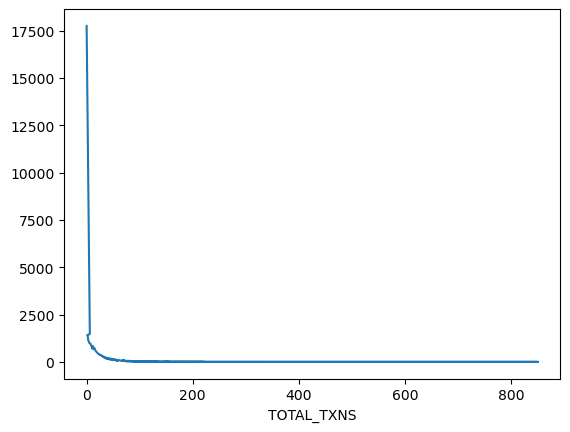

In [28]:
merged_count.value_counts("TOTAL_TXNS").plot()

array([[<AxesSubplot:title={'center':'TOTAL_TXNS'}>]], dtype=object)

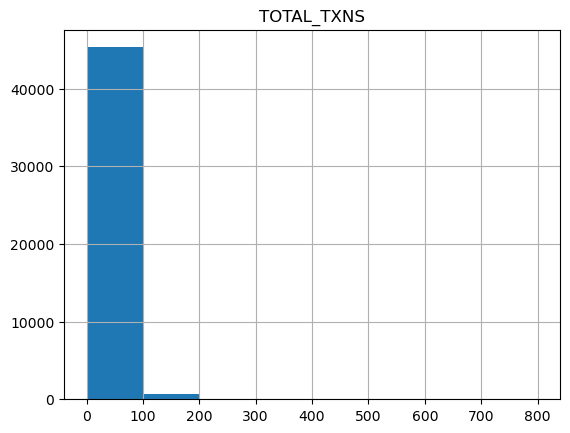

In [29]:
merged_count.hist("TOTAL_TXNS", bins=[0,100,200,300,400,500,600,700,800])

array([[<AxesSubplot:title={'center':'TOTAL_TXNS'}>]], dtype=object)

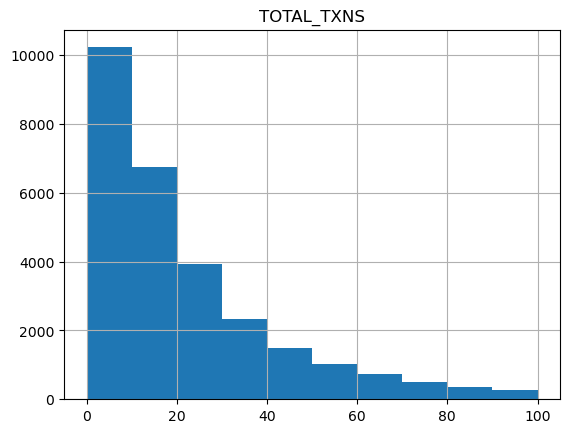

In [30]:
merged_count[(merged_count["TOTAL_TXNS"]<=100) & (merged_count["TOTAL_TXNS"]>0)].hist("TOTAL_TXNS", bins=np.arange(0,110,10))

In [31]:
np.histogram(merged_count.TOTAL_TXNS, bins=[0,100,200,300,400,500,600,700,800])[0]

array([45312,   736,    79,    14,     5,     0,     0,     1],
      dtype=int64)

<AxesSubplot:>

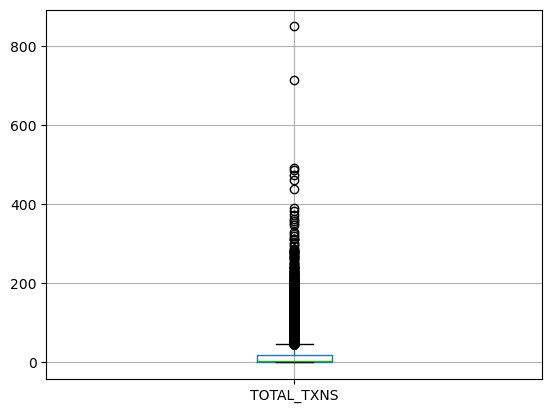

In [32]:
merged_count.boxplot("TOTAL_TXNS")

In [33]:
#HERE
# df = pd.DataFrame()
# df["Average"] = merged_sum[datasets_sum_names[2]] / merged_count[datasets_count_names[2]]
# df

merged_ave = pd.DataFrame()
for i in np.arange(0, len(datasets_sum_names)):
    if i != 0:
        column_name = datasets_count_names[i] + "_AVE"
        merged_ave[column_name] = merged_sum[datasets_sum_names[i]] / merged_count[datasets_count_names[i]]
    else:
        column_name = datasets_count_names[0]
        merged_ave[column_name] = merged_sum[column_name]
merged_ave = merged_ave.set_index("CUST_NUM")
merged_ave

,C_TXNS_AVE,D_TXNS_AVE,DIG_TXNS_AVE,IN_INSTA_TXNS_AVE,OUT_INSTA_TXNS_AVE
CUST_NUM,,,,,
11712.654012,NaN,497.323374,5909.463166,2619.191451,1626.116225
436.605085,NaN,NaN,NaN,NaN,NaN
921.989154,NaN,3589.183196,643.365502,3349.209339,NaN
1119.634762,NaN,1.462774,NaN,NaN,NaN
1709.755538,NaN,1739.843225,1155.643162,3886.745466,NaN
...,...,...,...,...,...
14060.827927,NaN,NaN,NaN,4199.578771,NaN
14101.987945,NaN,NaN,NaN,NaN,NaN
11266.634103,NaN,NaN,9799.940690,NaN,8007.010094


In [34]:
merged_ave.describe()

,C_TXNS_AVE,D_TXNS_AVE,DIG_TXNS_AVE,IN_INSTA_TXNS_AVE,OUT_INSTA_TXNS_AVE
count,2143.000000,25618.000000,10160.000000,12929.000000,6230.000000
mean,7115.802682,3094.402388,4331.536522,7102.001922,7204.661839
std,20715.680063,2737.507328,7498.605777,7745.915963,8683.122559
min,63.734544,0.512859,0.918294,0.143108,1.469938
25%,1135.718334,1289.261251,1125.456801,2211.238241,1625.299555
50%,2236.370278,2458.466158,2274.380407,4508.934395,3999.690513
75%,5048.659957,4139.446445,4722.060672,9073.380976,9468.804422
max,455019.668648,36556.898889,234250.652677,49999.761556,50000.412774


<AxesSubplot:>

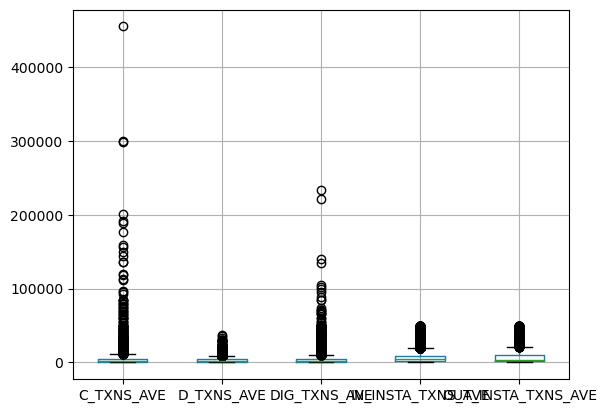

In [35]:
merged_ave.boxplot()

In [36]:
merged_ave[merged_ave["C_TXNS_AVE"] > 100000].sort_values(by="C_TXNS_AVE")

,C_TXNS_AVE,D_TXNS_AVE,DIG_TXNS_AVE,IN_INSTA_TXNS_AVE,OUT_INSTA_TXNS_AVE
CUST_NUM,,,,,
12740.071507,111469.945431,NaN,1333.992062,NaN,NaN
10324.459405,113020.454625,8122.620129,NaN,NaN,NaN
4042.308994,119012.707770,3571.980630,5689.326161,NaN,9499.594442
13192.394172,120004.162780,12501.673643,6643.251643,19345.802064,45749.532389
9082.735381,135560.953312,20001.631081,NaN,NaN,NaN
11878.069793,136018.233732,1.446526,NaN,5998.407369,NaN
12387.307294,144007.717678,NaN,7304.014196,5257.252444,24199.639919
12292.602816,150012.737877,NaN,1831.787053,NaN,NaN
10526.659489,155887.893057,3459.376670,10824.732123,8490.647225,25071.086890


In [37]:
customer_info[customer_info["CUST_NUM"].isin(merged_ave[merged_ave["C_TXNS_AVE"] > 100000].index)]

,CUST_NUM,PROVINCE,REGION,EDUCATION,AGE,TENURE,BUSINESS_OWNER,DIGITAL_FLAG,INCOME_SOURCE,GENDER,MARITAL_STATUS
6524,9082.735381,ILOCOS NORTE,REGION I (ILOCOS REGION),MID,36.0,10.166667,Y,TRADITIONAL,BUSINESS,FEMALE,MARRIED
6568,12387.307294,ILOCOS NORTE,REGION I (ILOCOS REGION),MID,50.0,5.666667,N,DIGITAL,SALARY,FEMALE,SINGLE
10117,11184.928341,BOHOL,REGION VII (CENTRAL VISAYAS),MID,34.0,12.166667,N,NO_DATA,SALARY,MALE,SINGLE
10709,13143.995663,MISAMIS ORIENTAL,REGION X (NORTHERN MINDANAO),MID,69.0,12.166667,Y,NO_DATA,BUSINESS,FEMALE,SINGLE
15661,9709.793098,CAPIZ,REGION VI (WESTERN VISAYAS),MID,38.0,10.250000,N,DIGITAL,SALARY,MALE,MARRIED
16510,10324.459405,BATAAN,REGION III (CENTRAL LUZON),MID,51.0,10.750000,N,TRADITIONAL,COMMISSION,MALE,SINGLE
19890,5503.326630,CAMARINES SUR,REGION V (BICOL REGION),MID,44.0,5.083333,N,DIGITAL,SALARY,MALE,SINGLE
21057,10526.659489,NEGROS OCCIDENTAL,REGION VI (WESTERN VISAYAS),MID,47.0,15.166667,N,DIGITAL,REMITTANCE,FEMALE,SINGLE
25563,10324.846730,AGUSAN DEL NORTE,REGION XIII (CARAGA),MID,52.0,22.333333,N,TRADITIONAL,SALARY,FEMALE,SINGLE
27767,13079.158306,PALAWAN,MIMAROPA REGION,LOW,56.0,6.083333,Y,TRADITIONAL,BUSINESS,MALE,MARRIED


In [38]:
merged_sum.describe()

,CUST_NUM,AGE,TENURE,C_TXNS_SUM,D_TXNS_SUM,DIG_TXNS_SUM,IN_INSTA_TXNS_SUM,OUT_INSTA_TXNS_SUM
count,46148.000000,46126.000000,46148.000000,2.143000e+03,2.561800e+04,1.016000e+04,1.292900e+04,6.230000e+03
mean,9424.785491,40.255496,6.280592,5.014520e+04,4.674248e+04,5.814984e+04,4.471498e+04,4.373016e+04
std,3337.170592,15.712765,5.241107,8.294724e+04,8.055004e+04,1.564503e+05,1.357691e+05,1.024136e+05
min,85.229103,1.000000,0.083333,6.373454e+01,5.128589e-01,9.182938e-01,1.431080e-01,1.469938e+00
25%,7064.942498,28.000000,2.166667,9.939362e+03,9.008177e+03,6.916670e+03,5.495917e+03,4.398222e+03
50%,10000.653129,36.000000,5.083333,2.713986e+04,2.779049e+04,2.385868e+04,1.749846e+04,1.505350e+04
75%,12247.160446,49.000000,9.000000,5.784442e+04,5.811244e+04,6.162836e+04,4.799694e+04,4.642760e+04
max,14141.980201,122.000000,30.416667,1.832335e+06,5.813320e+06,7.319855e+06,1.104299e+07,2.639254e+06


In [39]:
merged_sum[merged_sum["IN_INSTA_TXNS_SUM"]==max(merged_sum["IN_INSTA_TXNS_SUM"])]

,CUST_NUM,PROVINCE,REGION,EDUCATION,AGE,TENURE,BUSINESS_OWNER,DIGITAL_FLAG,INCOME_SOURCE,GENDER,MARITAL_STATUS,C_TXNS_SUM,D_TXNS_SUM,DIG_TXNS_SUM,IN_INSTA_TXNS_SUM,OUT_INSTA_TXNS_SUM
33647,13895.230189,DAVAO DEL NORTE,REGION XI (DAVAO REGION),MID,36.0,11.833333,N,DIGITAL,BUSINESS,FEMALE,SINGLE,NaN,5.813320e+06,3.175234e+06,1.104299e+07,NaN


In [40]:
third_quartile = merged_sum["IN_INSTA_TXNS_SUM"].quantile(0.75)
merged_sum[merged_sum["IN_INSTA_TXNS_SUM"]>=third_quartile]["REGION"].value_counts()

REGION X (NORTHERN MINDANAO)              447
REGION III (CENTRAL LUZON)                429
REGION VI (WESTERN VISAYAS)               417
REGION I (ILOCOS REGION)                  408
CORDILLERA ADMINISTRATIVE REGION (CAR)    214
REGION V (BICOL REGION)                   210
REGION VII (CENTRAL VISAYAS)              185
REGION II (CAGAYAN VALLEY)                183
REGION XII (SOCCSKSARGEN)                 178
REGION IX (ZAMBOANGA PENINSULA)           152
REGION VIII (EASTERN VISAYAS)             137
REGION XIII (CARAGA)                      101
MIMAROPA REGION                            93
REGION XI (DAVAO REGION)                   79
Name: REGION, dtype: int64

<AxesSubplot:>

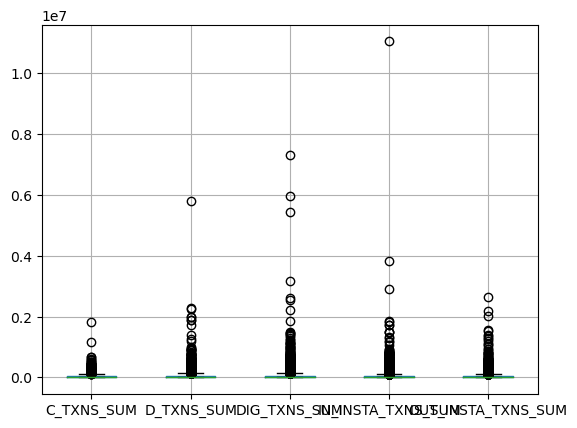

In [41]:
merged_sum[datasets_sum_names[1:]].boxplot()

In [42]:
#merged_ave[datasets_ave_names[1:]].boxplot()

In [43]:
for i in np.arange(1,len(datasets_sum_names)):
    print((merged_sum[datasets_sum_names[i]]>0).value_counts())

False    44005
True      2143
Name: C_TXNS_SUM, dtype: int64
True     25618
False    20530
Name: D_TXNS_SUM, dtype: int64
False    35988
True     10160
Name: DIG_TXNS_SUM, dtype: int64
False    33219
True     12929
Name: IN_INSTA_TXNS_SUM, dtype: int64
False    39918
True      6230
Name: OUT_INSTA_TXNS_SUM, dtype: int64


<AxesSubplot:>

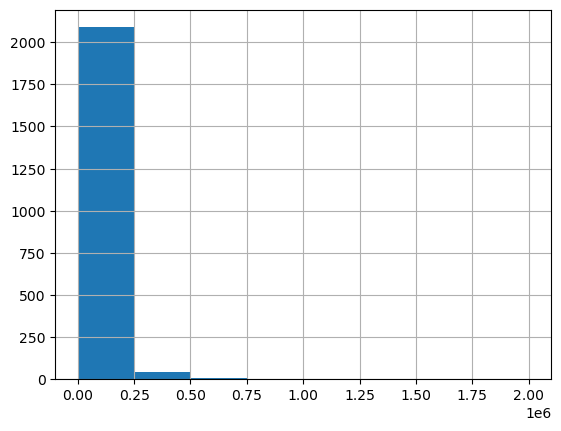

In [44]:
#HERE
# num_hist = np.histogram(merged_sum.C_TXNS_SUM.dropna())
# num_hist

merged_sum["C_TXNS_SUM"].hist(bins = np.arange(0, 2.25*10**6, 0.25*10**6))

[[0.0, 85471843.75989965], [250000.0, 14323349.028776204], [500000.0, 4671078.270760566], [750000.0, 0.0], [1000000.0, 1162566.9116738844], [1250000.0, 0.0], [1500000.0, 0.0], [1750000.0, 1832334.8044460583]]


<AxesSubplot:>

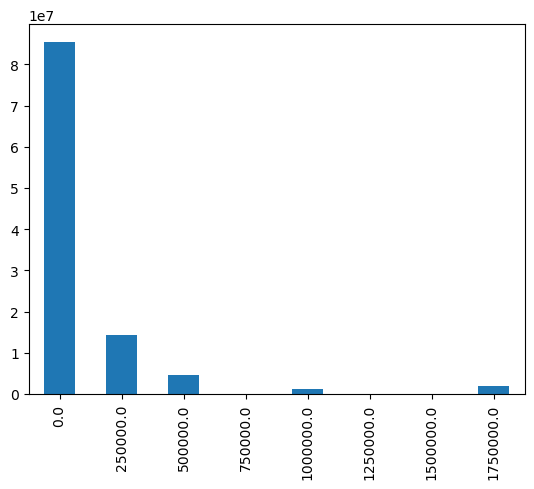

In [45]:
# Weighted Contribution of each interval of C_TXNS_SUM
list = []
for i in np.arange(0, 2.00*10**6, 0.25*10**6):
    if i == 0:
        total_sum = merged_sum[merged_sum["C_TXNS_SUM"]<=0.25*10**6]["C_TXNS_SUM"].sum()
        list.append([i, total_sum])
    else:
        total_sum = merged_sum[(merged_sum["C_TXNS_SUM"]>i) & (merged_sum["C_TXNS_SUM"]<=i+0.25*10**6)]["C_TXNS_SUM"].sum()
        list.append([i, total_sum])
print(list)

data = np.array(list)
x = data[:,0].tolist()
y = data[:,1].tolist()

pd.DataFrame(y, x).plot.bar(legend=False)

<AxesSubplot:>

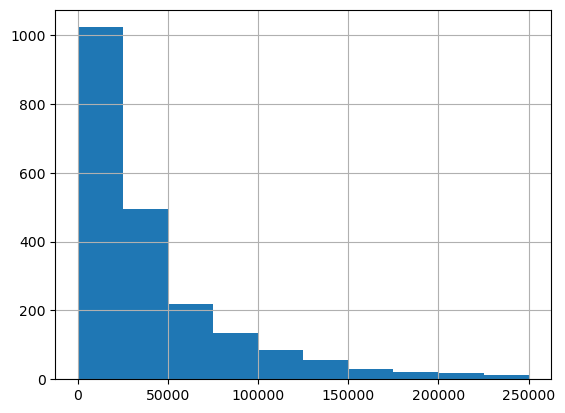

In [46]:
merged_sum[merged_sum["C_TXNS_SUM"]<0.25*10**6]["C_TXNS_SUM"].hist(bins = np.arange(0, 275000, 25000))

[[0, 10620785.46400074], [25000, 17745280.21511721], [50000, 13185126.745735168], [75000, 11683974.949053766], [100000, 9386634.130187567], [125000, 7698924.275917759], [150000, 4669846.196829497], [175000, 3885780.49011862], [200000, 4028422.1940511186], [225000, 2567069.098888202], [250000, 1826161.2360445792]]


<AxesSubplot:>

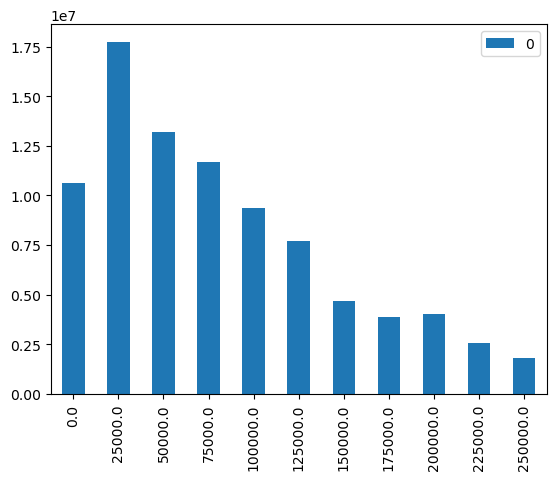

In [47]:
list = []
for i in np.arange(0, 275000, 25000):
    if i == 0:
        total_sum = merged_sum[merged_sum["C_TXNS_SUM"]<=25000]["C_TXNS_SUM"].sum()
        list.append([i, total_sum])
    else:
        total_sum = merged_sum[(merged_sum["C_TXNS_SUM"]>i) & (merged_sum["C_TXNS_SUM"]<=i+25000)]["C_TXNS_SUM"].sum()
        list.append([i, total_sum])
print(list)

data = np.array(list)
x = data[:,0].tolist()
y = data[:,1].tolist()

# plt.bar(x, y)
# plt.show()
# plt.pie(data[:,1], labels=data[:,0])
# plt.plot(data[:,0], data[:,1])

pd.DataFrame(y, x).plot.bar()

In [48]:
#https://re-thought.com/pandas-value_counts/
#https://datatofish.com/list-column-names-pandas-dataframe/
customer_info.groupby("REGION")["PROVINCE"].value_counts()

REGION                                  PROVINCE                      
CORDILLERA ADMINISTRATIVE REGION (CAR)  BENGUET                           2738
MIMAROPA REGION                         PALAWAN                            799
                                        ORIENTAL MINDORO                   348
                                        OCCIDENTAL MINDORO                   3
REGION I (ILOCOS REGION)                PANGASINAN                        2947
                                        LA UNION                          1154
                                        ILOCOS NORTE                      1121
                                        ILOCOS SUR                         631
REGION II (CAGAYAN VALLEY)              ISABELA                           1264
                                        CAGAYAN                           1037
                                        NUEVA VIZCAYA                      373
REGION III (CENTRAL LUZON)              ZAMBALES            

In [49]:
merged_count.groupby(["REGION","PROVINCE"])["TOTAL_TXNS"].sum()

REGION                                  PROVINCE                      
CORDILLERA ADMINISTRATIVE REGION (CAR)  BENGUET                           48034.0
MIMAROPA REGION                         OCCIDENTAL MINDORO                  128.0
                                        ORIENTAL MINDORO                   4805.0
                                        PALAWAN                           14473.0
REGION I (ILOCOS REGION)                ILOCOS NORTE                      14089.0
                                        ILOCOS SUR                         7505.0
                                        LA UNION                          16472.0
                                        PANGASINAN                        37483.0
REGION II (CAGAYAN VALLEY)              CAGAYAN                           14367.0
                                        ISABELA                           16875.0
                                        NUEVA VIZCAYA                      4640.0
REGION III (CENTRAL LUZON) 

In [50]:
# Group by Region, Province, Income_Source
region_prov_income = merged_count.groupby(["REGION","PROVINCE","INCOME_SOURCE"]).count()
region_prov_income = region_prov_income[['CUST_NUM', 'C_TXNS', 'D_TXNS', 'DIG_TXNS', 'IN_INSTA_TXNS', 'OUT_INSTA_TXNS', 'TOTAL_TXNS']]
region_prov_income

CUST_NUM  \
REGION                                 PROVINCE        INCOME_SOURCE                           
CORDILLERA ADMINISTRATIVE REGION (CAR) BENGUET         ALLOWANCE                         483   
                                                       BUSINESS                          146   
                                                       COMMISSION                         47   
                                                       DONATION                            1   
                                                       ECONOMICALLY_INACTIVE               4   
...                                                                                      ...   
REGION XIII (CARAGA)                   SURIGAO DEL SUR BUSINESS                           16   
                                                       OTHER_SOURCES_NOT_SPECIFIED         1   
                                                       PENSION                             1   
                                                       REMITTANCE                          7   
                                                       SALARY                             61   

                                                                                    C_TXNS  \
REGION                                 PROVINCE        INCOME_SOURCE                         
CORDILLERA ADMINISTRATIVE REGION (CAR) BENGUET         ALLOWANCE                        10   
                                                       BUSINESS                         11   
                                                       COMMISSION                        4   
                                                       DONATION                          0   
                                                       ECONOMICALLY_INACTIVE             0   
...                                                                                    ...   
REGION XIII (CARAGA)                   SURIGAO DEL SUR BUSINESS                          2   
                                                       OTHER_SOURCES_NOT_SPECIFIED       0   
                                                       PENSION                           0   
                                                       REMITTANCE                        0   
                                                       SALARY                            7   

                                                                                    D_TXNS  \
REGION                                 PROVINCE        INCOME_SOURCE                         
CORDILLERA ADMINISTRATIVE REGION (CAR) BENGUET         ALLOWANCE                       269   
                                                       BUSINESS                         65   
                                                       COMMISSION                       23   
                                                       DONATION                          0   
                                                       ECONOMICALLY_INACTIVE             4   
...                                                                                    ...   
REGION XIII (CARAGA)                   SURIGAO DEL SUR BUSINESS                          7   
                                                       OTHER_SOURCES_NOT_SPECIFIED       1   
                                                       PENSION                           1   
                                                       REMITTANCE                        1   
                                                       SALARY                           41   

                                                                                    DIG_TXNS  \
REGION                                 PROVINCE        INCOME_SOURCE                           
CORDILLERA ADMINISTRATIVE REGION (CAR) BENGUET         ALLOWANCE                         144   
                                                       BUSINESS                           35   
     

In [51]:
# Percentages I think are for example, how much of SALARY is in CAR?
# What I want to do is what percent of SALARY makes up income source of CAR?
merged_count.groupby(["REGION","PROVINCE"])['INCOME_SOURCE'].value_counts(normalize=True).to_frame()

INCOME_SOURCE
REGION                                 PROVINCE        INCOME_SOURCE                             
CORDILLERA ADMINISTRATIVE REGION (CAR) BENGUET         SALARY                            0.629657
                                                       ALLOWANCE                         0.176406
                                                       PENSION                           0.069394
                                                       BUSINESS                          0.053324
                                                       REMITTANCE                        0.030314
...                                                                                           ...
REGION XIII (CARAGA)                   SURIGAO DEL SUR ALLOWANCE                         0.165049
                                                       BUSINESS                          0.155340
                                                       REMITTANCE                        0.067961
                                                       OTHER_SOURCES_NOT_SPECIFIED       0.009709
                                                       PENSION                           0.009709

[408 rows x 1 columns]

In [52]:
# Percentage of each type of transaction per gender, to see what each gender prefers

by_gender = pd.DataFrame()
by_gender_sum = merged_sum.groupby(["GENDER"]).sum()[['CUST_NUM', 'C_TXNS_SUM', 'D_TXNS_SUM', 'DIG_TXNS_SUM', 'IN_INSTA_TXNS_SUM', 'OUT_INSTA_TXNS_SUM']]
by_gender_count = merged_count.groupby(["GENDER"]).sum()[['CUST_NUM', 'C_TXNS', 'D_TXNS', 'DIG_TXNS', 'IN_INSTA_TXNS', 'OUT_INSTA_TXNS']]
for i in np.arange(1, len(datasets)):
    if i != 0:
        by_gender[datasets_count_names[i]] = by_gender_sum[datasets_sum_names[i]] / by_gender_count[datasets_count_names[i]]
by_gender

# Notice that behavior per gender is similar.

,C_TXNS,D_TXNS,DIG_TXNS,IN_INSTA_TXNS,OUT_INSTA_TXNS
GENDER,,,,,
FEMALE,3127.996874,3238.623015,3391.720656,7162.655477,6728.831130
MALE,3394.494294,3242.587478,3391.452862,7325.083636,6613.015950
OTHERS,3542.597975,3222.849618,2896.200082,6857.685635,6242.290411


In [53]:
by_gender_sum = merged_sum.groupby(["GENDER"]).sum()[['CUST_NUM', 'C_TXNS_SUM', 'D_TXNS_SUM', 'DIG_TXNS_SUM', 'IN_INSTA_TXNS_SUM', 'OUT_INSTA_TXNS_SUM']]
by_gender_sum

,CUST_NUM,C_TXNS_SUM,D_TXNS_SUM,DIG_TXNS_SUM,IN_INSTA_TXNS_SUM,OUT_INSTA_TXNS_SUM
GENDER,,,,,,
FEMALE,2.530605e+08,5.916293e+07,6.960837e+08,3.489538e+08,3.376691e+08,1.555571e+08
MALE,1.731401e+08,4.696622e+07,4.784957e+08,2.335626e+08,2.325714e+08,1.128181e+08
OTHERS,8.734349e+06,1.332017e+06,2.286934e+07,8.286028e+06,7.879481e+06,4.063731e+06


In [54]:
by_gender_count = merged_count.groupby(["GENDER"]).sum()[['CUST_NUM', 'C_TXNS', 'D_TXNS', 'DIG_TXNS', 'IN_INSTA_TXNS', 'OUT_INSTA_TXNS']]
by_gender_count

,CUST_NUM,C_TXNS,D_TXNS,DIG_TXNS,IN_INSTA_TXNS,OUT_INSTA_TXNS
GENDER,,,,,,
FEMALE,2.530605e+08,18914.0,214932.0,102884.0,47143.0,23118.0
MALE,1.731401e+08,13836.0,147566.0,68868.0,31750.0,17060.0
OTHERS,8.734349e+06,376.0,7096.0,2861.0,1149.0,651.0


In [55]:
datasets[4]

,CUST_NUM,DATE,TIME,AMOUNT,BPI_ACCT_TYPE,SRC_BANK_NAME
0,5713.401964,2023-04-01,73591,12299.238264,SA,LEMUR
1,5713.401964,2023-04-05,44714,2499.424915,SA,HUMAN
2,5713.401964,2023-04-24,46302,748.744684,SA,HUMAN
3,5713.401964,2023-04-29,40612,1799.144167,SA,HUMAN
4,5713.401964,2023-04-29,24021,1499.628880,SA,HUMAN
...,...,...,...,...,...,...
80037,11432.368259,2023-06-30,76309,2998.982229,SA,HUMAN
80038,9868.617026,2023-06-30,38348,7499.457892,SA,HUMAN
80039,9868.617026,2023-06-30,38465,19.806571,SA,HUMAN
80040,13968.861156,2023-06-30,51968,999.240763,SA,HUMAN


<AxesSubplot:xlabel='GENDER'>

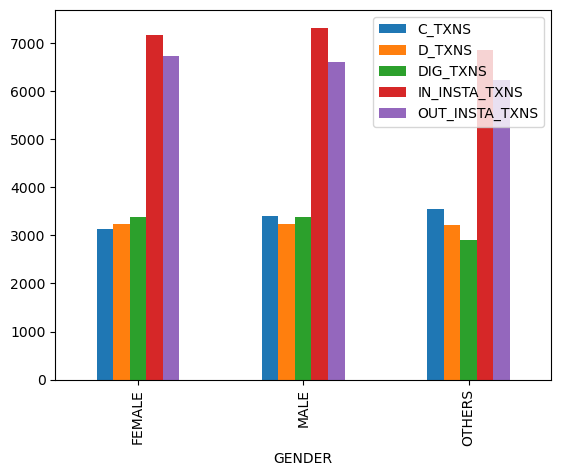

In [56]:
by_gender.plot(kind='bar')

In [57]:
datasets[1]['DATE'].value_counts()

2023-05-13    469
2023-06-24    469
2023-06-17    465
2023-06-18    463
2023-06-03    459
             ... 
2023-04-18    302
2023-04-14    293
2023-04-12    288
2023-04-06    283
2023-04-07    136
Name: DATE, Length: 91, dtype: int64

In [58]:
customer_info['AGE_START'] = customer_info['AGE'] - customer_info['TENURE']
customer_info

,CUST_NUM,PROVINCE,REGION,EDUCATION,AGE,TENURE,BUSINESS_OWNER,DIGITAL_FLAG,INCOME_SOURCE,GENDER,MARITAL_STATUS,AGE_START
0,11712.654012,BENGUET,CORDILLERA ADMINISTRATIVE REGION (CAR),NO_DATA,20.0,1.833333,N,DIGITAL,ALLOWANCE,MALE,SINGLE,18.166667
1,436.605085,BENGUET,CORDILLERA ADMINISTRATIVE REGION (CAR),NO_DATA,21.0,4.250000,N,NO_DATA,SALARY,FEMALE,SINGLE,16.750000
2,921.989154,BENGUET,CORDILLERA ADMINISTRATIVE REGION (CAR),NO_DATA,23.0,2.000000,N,TRADITIONAL,ALLOWANCE,MALE,SINGLE,21.000000
3,1119.634762,BENGUET,CORDILLERA ADMINISTRATIVE REGION (CAR),LOW,13.0,5.583333,N,TRADITIONAL,ALLOWANCE,MALE,SINGLE,7.416667
4,1709.755538,BENGUET,CORDILLERA ADMINISTRATIVE REGION (CAR),NO_DATA,20.0,1.250000,N,DIGITAL,SALARY,FEMALE,SINGLE,18.750000
...,...,...,...,...,...,...,...,...,...,...,...,...
46143,14060.827927,SULTAN KUDARAT,REGION XII (SOCCSKSARGEN),MID,34.0,9.916667,N,TRADITIONAL,SALARY,MALE,SINGLE,24.083333
46144,14101.987945,SULTAN KUDARAT,REGION XII (SOCCSKSARGEN),NO_DATA,25.0,2.000000,N,DIGITAL,SALARY,MALE,MARRIED,23.000000
46145,11266.634103,OCCIDENTAL MINDORO,MIMAROPA REGION,NO_DATA,30.0,2.750000,N,DIGITAL,SALARY,FEMALE,MARRIED,27.250000
46146,8992.043372,OCCIDENTAL MINDORO,MIMAROPA REGION,NO_DATA,53.0,2.916667,N,TRADITIONAL,SALARY,FEMALE,MARRIED,50.083333


array([[<AxesSubplot:title={'center':'AGE_START'}>]], dtype=object)

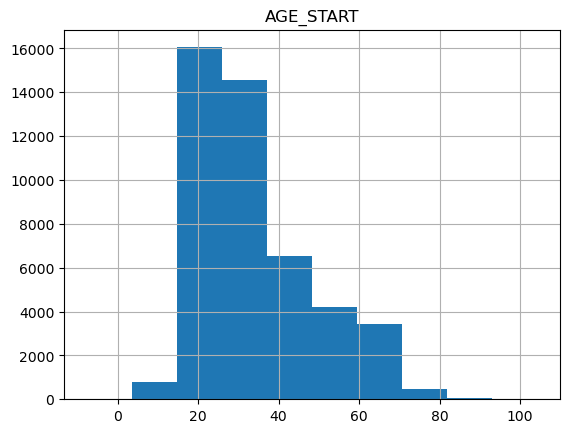

In [59]:
customer_info.hist(column='AGE_START')

array([[<AxesSubplot:title={'center':'AGE'}>]], dtype=object)

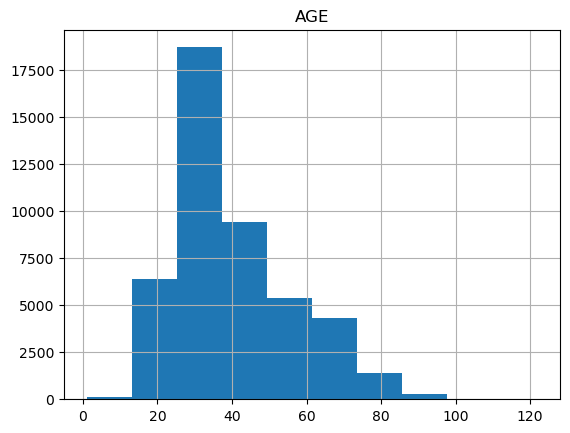

In [60]:
customer_info.hist(column='AGE')

array([[<AxesSubplot:title={'center':'TENURE'}>]], dtype=object)

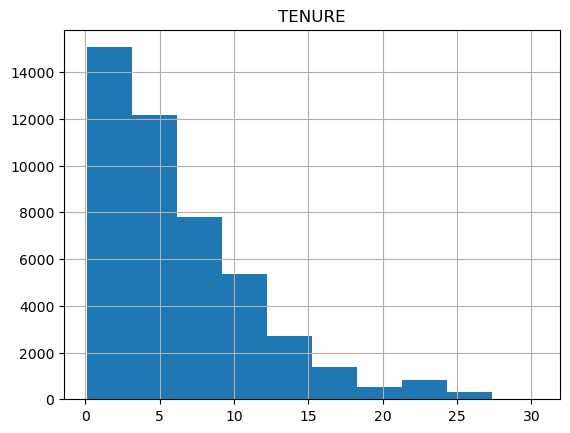

In [61]:
customer_info.hist(column='TENURE')

<AxesSubplot:>

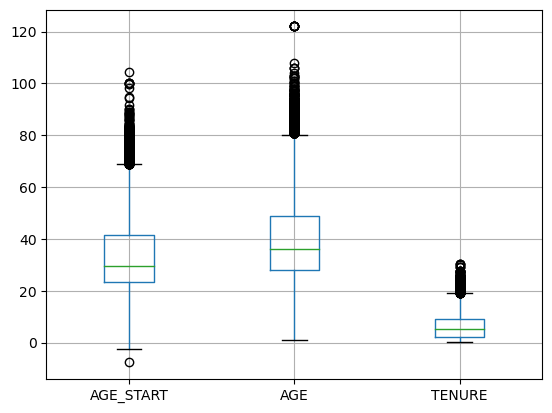

In [62]:
customer_info.boxplot(column=['AGE_START', 'AGE', 'TENURE'])

<AxesSubplot:>

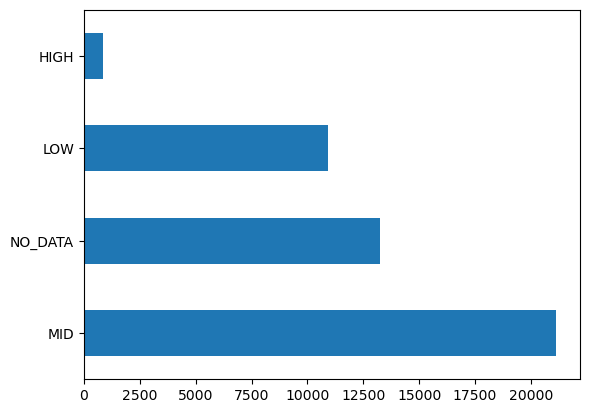

In [63]:
customer_info["EDUCATION"].value_counts().plot.barh()

<AxesSubplot:ylabel='EDUCATION'>

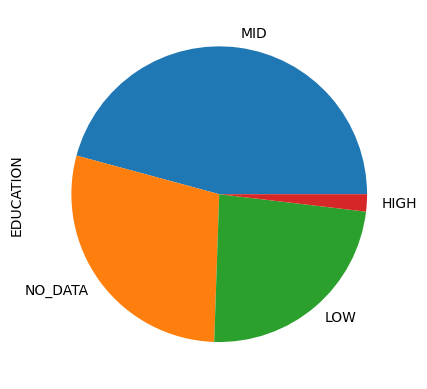

In [64]:
customer_info["EDUCATION"].value_counts().plot.pie()

In [65]:
print("AVERAGES BASED ON: EDUCATION")
for i in np.arange(1, len(datasets_sum_names)):
    print(datasets_sum_names[i] + " average")
    print("low:", merged_sum.where(merged_sum['EDUCATION']=="LOW")[datasets_sum_names[i]].mean())
    print("mid:", merged_sum.where(merged_sum['EDUCATION']=="MID")[datasets_sum_names[i]].mean())
    print("high:", merged_sum.where(merged_sum['EDUCATION']=="HIGH")[datasets_sum_names[i]].mean())
    print()

AVERAGES BASED ON: EDUCATION
C_TXNS_SUM average
low: 42611.86183590706
mid: 52083.827233254975
high: 53505.8598679957

D_TXNS_SUM average
low: 38402.54695438957
mid: 54658.38562352669
high: 46623.76187336559

DIG_TXNS_SUM average
low: 43732.99726343362
mid: 70012.68617408349
high: 65500.459650393714

IN_INSTA_TXNS_SUM average
low: 36797.37531407078
mid: 49154.85827742521
high: 47970.771729890745

OUT_INSTA_TXNS_SUM average
low: 28747.46667311112
mid: 49022.67002118371
high: 49300.43814723602



In [66]:
print("AVERAGES BASED ON: AGE")
for i in np.arange(1, len(datasets_sum_names)):
    print(datasets_sum_names[i] + " average")
    print("0-10:", merged_sum.where((merged_sum["AGE"]>=0) & (merged_sum["AGE"]<=10))[datasets_sum_names[i]].mean())
    print("11-20:", merged_sum.where((merged_sum["AGE"]>10) & (merged_sum["AGE"]<=20))[datasets_sum_names[i]].mean())
    print("21-30:", merged_sum.where((merged_sum["AGE"]>20) & (merged_sum["AGE"]<=30))[datasets_sum_names[i]].mean())
    print("31-40:", merged_sum.where((merged_sum["AGE"]>30) & (merged_sum["AGE"]<=40))[datasets_sum_names[i]].mean())
    print("41-50:", merged_sum.where((merged_sum["AGE"]>40) & (merged_sum["AGE"]<=50))[datasets_sum_names[i]].mean())
    print("51-60:", merged_sum.where((merged_sum["AGE"]>50) & (merged_sum["AGE"]<=60))[datasets_sum_names[i]].mean())
    print("61-70:", merged_sum.where((merged_sum["AGE"]>60) & (merged_sum["AGE"]<=70))[datasets_sum_names[i]].mean())
    print("71-80:", merged_sum.where((merged_sum["AGE"]>70) & (merged_sum["AGE"]<=80))[datasets_sum_names[i]].mean())
    print("81-90:", merged_sum.where((merged_sum["AGE"]>80) & (merged_sum["AGE"]<=90))[datasets_sum_names[i]].mean())
    print("91-100:", merged_sum.where((merged_sum["AGE"]>90) & (merged_sum["AGE"]<=100))[datasets_sum_names[i]].mean())
    print()

AVERAGES BASED ON: AGE
C_TXNS_SUM average
0-10: nan
11-20: nan
21-30: 43977.84579354648
31-40: 44737.94049706728
41-50: 60061.61968889241
51-60: 69883.71152339307
61-70: 47608.36376659197
71-80: 25533.806341197607
81-90: nan
91-100: 59008.554035716865

D_TXNS_SUM average
0-10: 45020.0643015378
11-20: 26087.315247998664
21-30: 44031.398967572284
31-40: 55560.36403369908
41-50: 57710.25765102925
51-60: 49614.06753342351
61-70: 30389.88005877894
71-80: 23098.619084625236
81-90: 16824.79042015111
91-100: 16538.635073121914

DIG_TXNS_SUM average
0-10: nan
11-20: 23678.63403798652
21-30: 48060.14984251982
31-40: 69795.92906990067
41-50: 71237.74273332758
51-60: 54429.9004230346
61-70: 46402.93564057924
71-80: 82944.65961617608
81-90: 16050.883519238105
91-100: 38000.88970330994

IN_INSTA_TXNS_SUM average
0-10: 25215.709219153334
11-20: 23118.253606910403
21-30: 38858.50402222845
31-40: 56014.15962524983
41-50: 46758.03175901439
51-60: 32778.31213345882
61-70: 35627.283998377665
71-80: 34980.

In [67]:
df = merged_sum.groupby("BUSINESS_OWNER").sum() / merged_sum.groupby("BUSINESS_OWNER").count()
df = df.dropna(axis=1, how='all')
df

,AGE,CUST_NUM,C_TXNS_SUM,DIG_TXNS_SUM,D_TXNS_SUM,IN_INSTA_TXNS_SUM,OUT_INSTA_TXNS_SUM,TENURE
BUSINESS_OWNER,,,,,,,,
N,39.806795,9423.665329,47485.277346,55636.885963,46239.472431,43512.327143,42993.792689,6.136836
Y,48.817153,9446.170014,81618.351730,132539.388300,58396.002500,67656.854749,62029.364433,9.024960


In [68]:
df = merged_sum.groupby("BUSINESS_OWNER").sum() / merged_sum.groupby("BUSINESS_OWNER").count()
df = df.dropna(axis=1, how='all')
df

,AGE,CUST_NUM,C_TXNS_SUM,DIG_TXNS_SUM,D_TXNS_SUM,IN_INSTA_TXNS_SUM,OUT_INSTA_TXNS_SUM,TENURE
BUSINESS_OWNER,,,,,,,,
N,39.806795,9423.665329,47485.277346,55636.885963,46239.472431,43512.327143,42993.792689,6.136836
Y,48.817153,9446.170014,81618.351730,132539.388300,58396.002500,67656.854749,62029.364433,9.024960


In [69]:
# There are accounts in which the tenure is larger than the age.
(customer_info['AGE']<=customer_info['TENURE']).value_counts()

False    46142
True         6
dtype: int64

In [70]:
customer_info[(customer_info['AGE']<=customer_info['TENURE'])==True]

,CUST_NUM,PROVINCE,REGION,EDUCATION,AGE,TENURE,BUSINESS_OWNER,DIGITAL_FLAG,INCOME_SOURCE,GENDER,MARITAL_STATUS,AGE_START
588,6741.393179,ZAMBALES,REGION III (CENTRAL LUZON),MID,6.0,6.083333,N,NO_DATA,SALARY,FEMALE,SINGLE,-0.083333
1033,13892.537709,MISAMIS ORIENTAL,REGION X (NORTHERN MINDANAO),MID,5.0,5.083333,N,NO_DATA,SALARY,FEMALE,SINGLE,-0.083333
1633,3155.037242,NEGROS OCCIDENTAL,REGION VI (WESTERN VISAYAS),MID,22.0,22.333333,N,TRADITIONAL,NO_DATA,MALE,SINGLE,-0.333333
2401,8961.150596,NEGROS ORIENTAL,REGION VII (CENTRAL VISAYAS),NO_DATA,23.0,25.500000,N,NO_DATA,NO_DATA,MALE,SINGLE,-2.500000
2841,12720.959241,LEYTE,REGION VIII (EASTERN VISAYAS),LOW,5.0,5.000000,N,TRADITIONAL,SALARY,FEMALE,SINGLE,0.000000
3260,1886.584745,ISABELA,REGION II (CAGAYAN VALLEY),MID,5.0,12.666667,Y,NO_DATA,BUSINESS,FEMALE,SINGLE,-7.666667


In [71]:
merged_sum[((merged_sum["AGE"]>=0) & (merged_sum["AGE"]<=10) & (merged_sum["OUT_INSTA_TXNS_SUM"]>0))].dropna(axis=1, how='all')

,CUST_NUM,PROVINCE,REGION,EDUCATION,AGE,TENURE,BUSINESS_OWNER,DIGITAL_FLAG,INCOME_SOURCE,GENDER,MARITAL_STATUS,IN_INSTA_TXNS_SUM,OUT_INSTA_TXNS_SUM
2221,11551.479732,NUEVA ECIJA,REGION III (CENTRAL LUZON),MID,1.0,0.833333,Y,TRADITIONAL,BUSINESS,FEMALE,SINGLE,43989.733489,66348.74926


In [72]:
for i in np.arange(0, len(datasets)):
    print(len(datasets[i]))

138444
33126
369594
174613
80042
40829


## Distribution of Customers

In [73]:
customer_info

,CUST_NUM,PROVINCE,REGION,EDUCATION,AGE,TENURE,BUSINESS_OWNER,DIGITAL_FLAG,INCOME_SOURCE,GENDER,MARITAL_STATUS,AGE_START
0,11712.654012,BENGUET,CORDILLERA ADMINISTRATIVE REGION (CAR),NO_DATA,20.0,1.833333,N,DIGITAL,ALLOWANCE,MALE,SINGLE,18.166667
1,436.605085,BENGUET,CORDILLERA ADMINISTRATIVE REGION (CAR),NO_DATA,21.0,4.250000,N,NO_DATA,SALARY,FEMALE,SINGLE,16.750000
2,921.989154,BENGUET,CORDILLERA ADMINISTRATIVE REGION (CAR),NO_DATA,23.0,2.000000,N,TRADITIONAL,ALLOWANCE,MALE,SINGLE,21.000000
3,1119.634762,BENGUET,CORDILLERA ADMINISTRATIVE REGION (CAR),LOW,13.0,5.583333,N,TRADITIONAL,ALLOWANCE,MALE,SINGLE,7.416667
4,1709.755538,BENGUET,CORDILLERA ADMINISTRATIVE REGION (CAR),NO_DATA,20.0,1.250000,N,DIGITAL,SALARY,FEMALE,SINGLE,18.750000
...,...,...,...,...,...,...,...,...,...,...,...,...
46143,14060.827927,SULTAN KUDARAT,REGION XII (SOCCSKSARGEN),MID,34.0,9.916667,N,TRADITIONAL,SALARY,MALE,SINGLE,24.083333
46144,14101.987945,SULTAN KUDARAT,REGION XII (SOCCSKSARGEN),NO_DATA,25.0,2.000000,N,DIGITAL,SALARY,MALE,MARRIED,23.000000
46145,11266.634103,OCCIDENTAL MINDORO,MIMAROPA REGION,NO_DATA,30.0,2.750000,N,DIGITAL,SALARY,FEMALE,MARRIED,27.250000
46146,8992.043372,OCCIDENTAL MINDORO,MIMAROPA REGION,NO_DATA,53.0,2.916667,N,TRADITIONAL,SALARY,FEMALE,MARRIED,50.083333


### By Region, Province

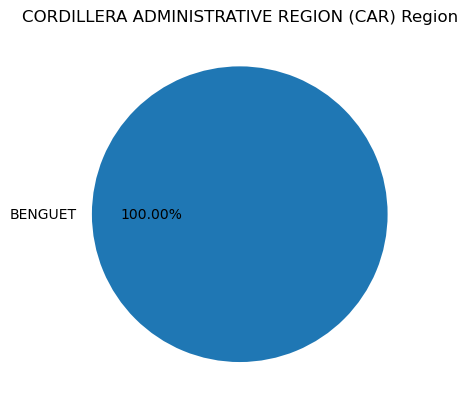

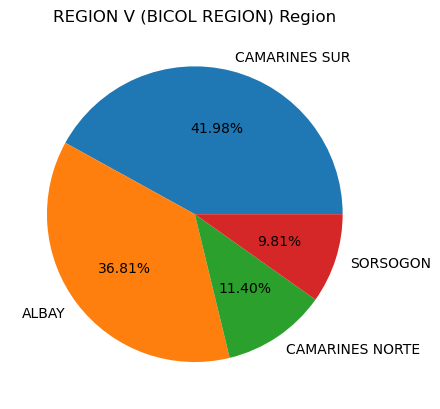

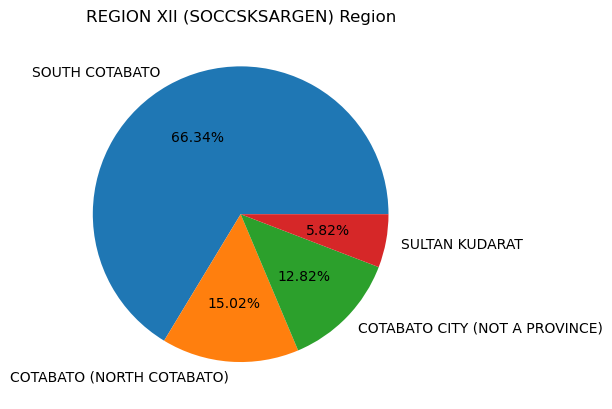

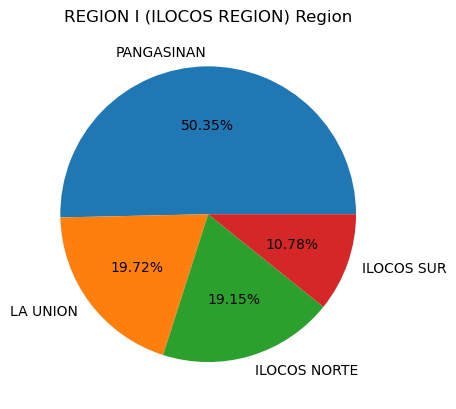

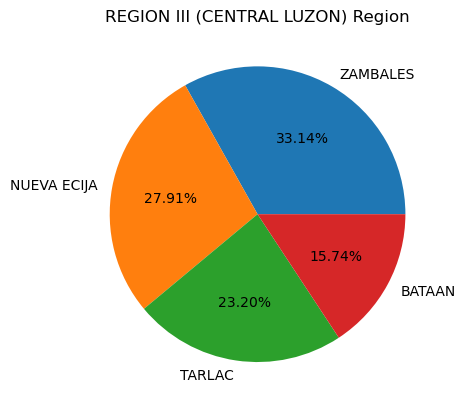

...

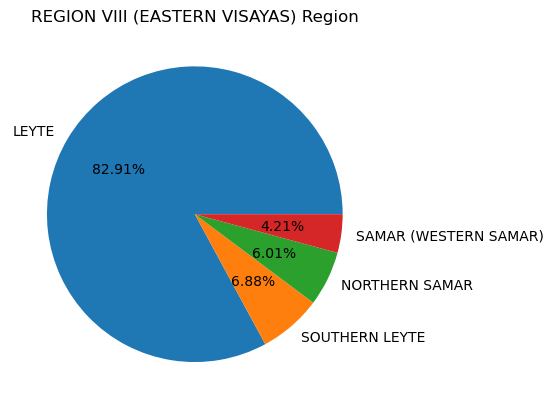

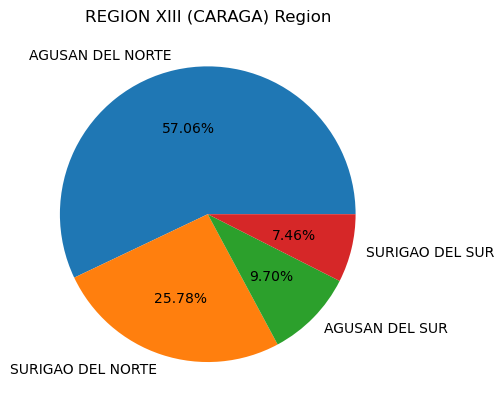

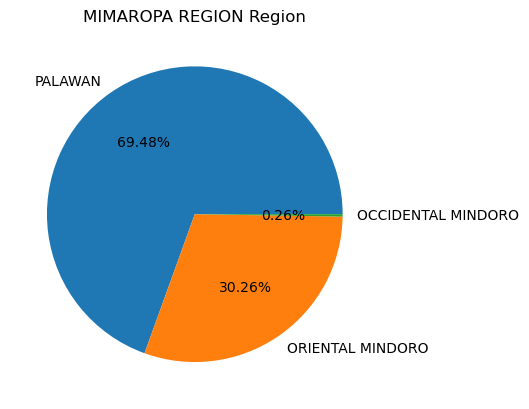

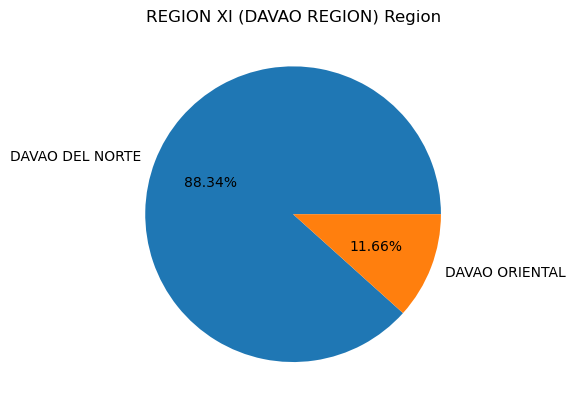

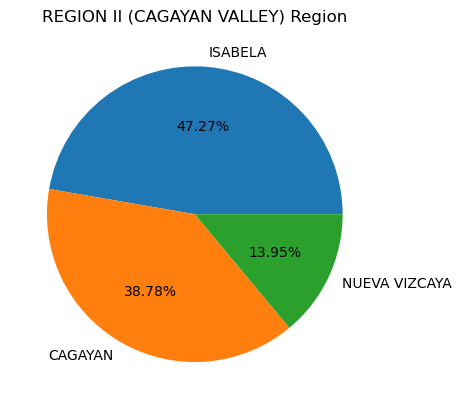

In [74]:
# Pie plot for every region, All customers
regions = customer_info["REGION"].unique()

for region in regions:
    plt.figure()  # Create a new figure
    customer_info.groupby("REGION")["PROVINCE"].value_counts()[region].plot.pie(autopct="%1.2f%%")
    plt.title(f"{region} Region")
    plt.ylabel("")
    plt.show()

In [75]:
# Active Users
print(len(merged_count[merged_count["TOTAL_TXNS"]>0]))
print("{:.11%}".format(len(merged_count[merged_count["TOTAL_TXNS"]>0]) / len(merged_count)))

28400
61.54112854295%


In [76]:
# Active customers
active_customer_sum = merged_sum[~merged_sum[datasets_sum_names[1:]].isnull().all(axis=1)]
active_customer_sum

,CUST_NUM,PROVINCE,REGION,EDUCATION,AGE,TENURE,BUSINESS_OWNER,DIGITAL_FLAG,INCOME_SOURCE,GENDER,MARITAL_STATUS,C_TXNS_SUM,D_TXNS_SUM,DIG_TXNS_SUM,IN_INSTA_TXNS_SUM,OUT_INSTA_TXNS_SUM
0,11712.654012,BENGUET,CORDILLERA ADMINISTRATIVE REGION (CAR),NO_DATA,20.0,1.833333,N,DIGITAL,ALLOWANCE,MALE,SINGLE,NaN,20390.258341,76823.021158,13095.957256,27643.975823
2,921.989154,BENGUET,CORDILLERA ADMINISTRATIVE REGION (CAR),NO_DATA,23.0,2.000000,N,TRADITIONAL,ALLOWANCE,MALE,SINGLE,NaN,32302.648762,5146.924018,13396.837358,NaN
3,1119.634762,BENGUET,CORDILLERA ADMINISTRATIVE REGION (CAR),LOW,13.0,5.583333,N,TRADITIONAL,ALLOWANCE,MALE,SINGLE,NaN,2.925549,NaN,NaN,NaN
4,1709.755538,BENGUET,CORDILLERA ADMINISTRATIVE REGION (CAR),NO_DATA,20.0,1.250000,N,DIGITAL,SALARY,FEMALE,SINGLE,NaN,12178.902578,3466.929487,15546.981865,NaN
6,1964.683690,BENGUET,CORDILLERA ADMINISTRATIVE REGION (CAR),LOW,22.0,5.333333,N,TRADITIONAL,ALLOWANCE,MALE,SINGLE,NaN,10713.303471,NaN,11195.112750,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
46140,13908.768601,SULTAN KUDARAT,REGION XII (SOCCSKSARGEN),NO_DATA,54.0,2.083333,N,TRADITIONAL,SALARY,FEMALE,MARRIED,NaN,41543.846981,NaN,16993.715118,NaN
46143,14060.827927,SULTAN KUDARAT,REGION XII (SOCCSKSARGEN),MID,34.0,9.916667,N,TRADITIONAL,SALARY,MALE,SINGLE,NaN,NaN,NaN,8399.157542,NaN
46145,11266.634103,OCCIDENTAL MINDORO,MIMAROPA REGION,NO_DATA,30.0,2.750000,N,DIGITAL,SALARY,FEMALE,MARRIED,NaN,NaN,9799.940690,NaN,168147.211967
46146,8992.043372,OCCIDENTAL MINDORO,MIMAROPA REGION,NO_DATA,53.0,2.916667,N,TRADITIONAL,SALARY,FEMALE,MARRIED,NaN,243953.821928,NaN,NaN,NaN


In [77]:
total = customer_info.groupby("REGION")["PROVINCE"].value_counts().reset_index(name="Total")
active = active_customer_sum.groupby("REGION")["PROVINCE"].value_counts().reset_index(name="Active")

In [78]:
result = reduce(lambda  left,right: pd.merge(left,right,on=['REGION', 'PROVINCE'], how='outer'), [total, active])

In [79]:
result["Percent_Active"] = result["Active"]/result["Total"]
result = result.sort_values(by="Total")
result

,REGION,PROVINCE,Total,Active,Percent_Active
3,MIMAROPA REGION,OCCIDENTAL MINDORO,3,3,1.000000
30,REGION VIII (EASTERN VISAYAS),SAMAR (WESTERN SAMAR),82,52,0.634146
44,REGION XIII (CARAGA),SURIGAO DEL SUR,103,69,0.669903
29,REGION VIII (EASTERN VISAYAS),NORTHERN SAMAR,117,81,0.692308
43,REGION XIII (CARAGA),AGUSAN DEL SUR,134,79,0.589552
28,REGION VIII (EASTERN VISAYAS),SOUTHERN LEYTE,134,100,0.746269
36,REGION XI (DAVAO REGION),DAVAO ORIENTAL,151,105,0.695364
40,REGION XII (SOCCSKSARGEN),SULTAN KUDARAT,154,113,0.733766
20,REGION V (BICOL REGION),SORSOGON,315,201,0.638095
39,REGION XII (SOCCSKSARGEN),COTABATO CITY (NOT A PROVINCE),339,190,0.560472


In [80]:
regions = customer_info["REGION"].unique().tolist()
regions.sort()
regions

['CORDILLERA ADMINISTRATIVE REGION (CAR)',
 'MIMAROPA REGION',
 'REGION I (ILOCOS REGION)',
 'REGION II (CAGAYAN VALLEY)',
 'REGION III (CENTRAL LUZON)',
 'REGION IX (ZAMBOANGA PENINSULA)',
 'REGION V (BICOL REGION)',
 'REGION VI (WESTERN VISAYAS)',
 'REGION VII (CENTRAL VISAYAS)',
 'REGION VIII (EASTERN VISAYAS)',
 'REGION X (NORTHERN MINDANAO)',
 'REGION XI (DAVAO REGION)',
 'REGION XII (SOCCSKSARGEN)',
 'REGION XIII (CARAGA)']

In [81]:
Luzon = regions[:5] + [regions[6]]
Visayas = regions[7:10]
Mindanao = [regions[5]] + regions[10:]

In [82]:
regions

['CORDILLERA ADMINISTRATIVE REGION (CAR)',
 'MIMAROPA REGION',
 'REGION I (ILOCOS REGION)',
 'REGION II (CAGAYAN VALLEY)',
 'REGION III (CENTRAL LUZON)',
 'REGION IX (ZAMBOANGA PENINSULA)',
 'REGION V (BICOL REGION)',
 'REGION VI (WESTERN VISAYAS)',
 'REGION VII (CENTRAL VISAYAS)',
 'REGION VIII (EASTERN VISAYAS)',
 'REGION X (NORTHERN MINDANAO)',
 'REGION XI (DAVAO REGION)',
 'REGION XII (SOCCSKSARGEN)',
 'REGION XIII (CARAGA)']

In [83]:
Luzon

['CORDILLERA ADMINISTRATIVE REGION (CAR)',
 'MIMAROPA REGION',
 'REGION I (ILOCOS REGION)',
 'REGION II (CAGAYAN VALLEY)',
 'REGION III (CENTRAL LUZON)',
 'REGION V (BICOL REGION)']

In [84]:
Luzon_data = result[result["REGION"].isin(Luzon)].reset_index()
Visayas_data = result[result["REGION"].isin(Visayas)].reset_index()
Mindanao_data = result[result["REGION"].isin(Mindanao)].reset_index()
LuzViMin_data = [Luzon_data, Visayas_data, Mindanao_data]

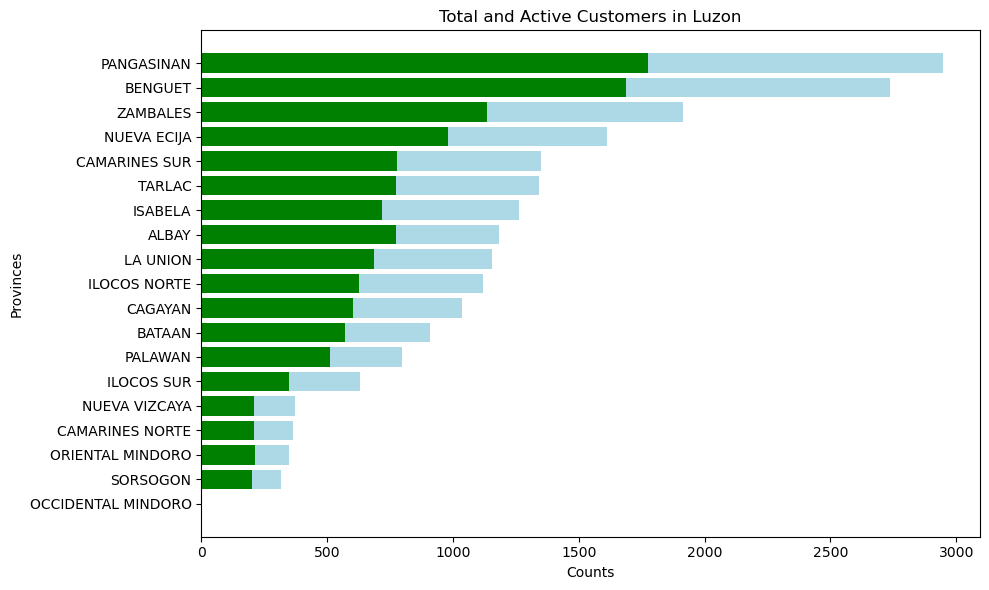

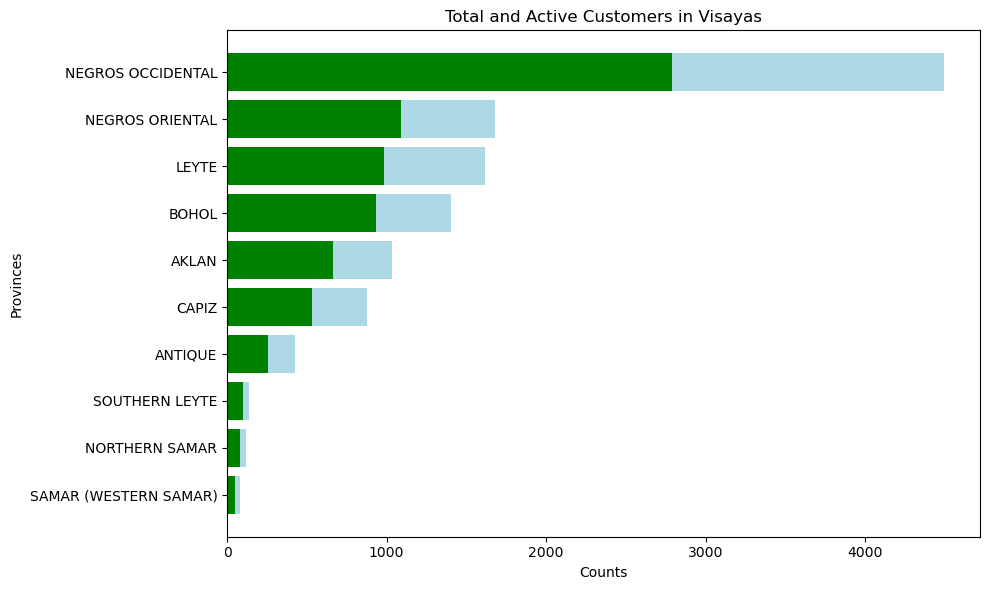

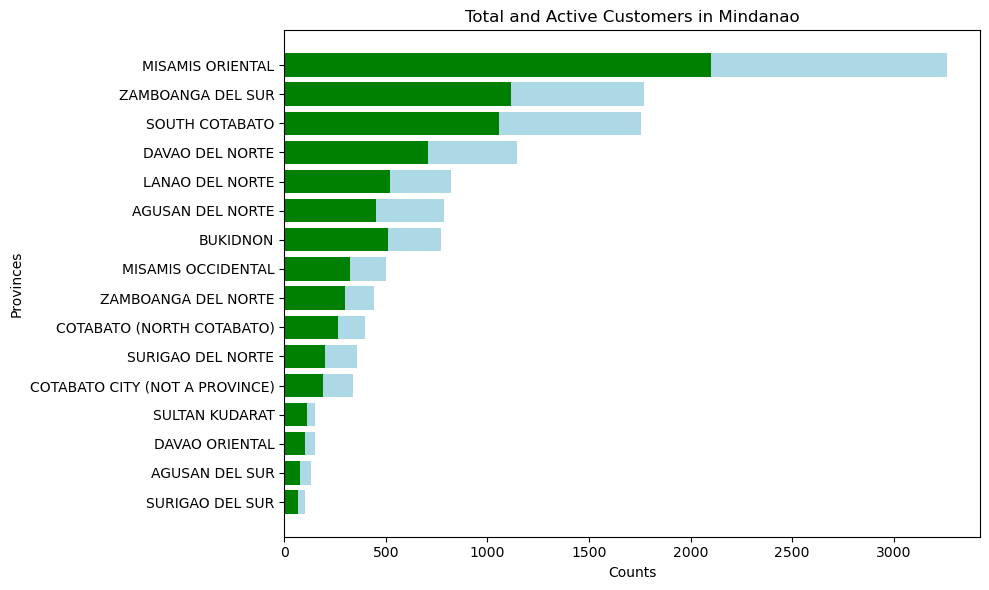

In [85]:
LuzViMin_names = ["Luzon", "Visayas", "Mindanao"]
for i in np.arange(0, len(LuzViMin_data)):
    fig, ax = plt.subplots(figsize=(10, 6))
    group_data = LuzViMin_data[i]

    ax.barh(group_data.index, group_data['Active'], label='Active', color='green')
    ax.barh(group_data.index, group_data['Total']-group_data['Active'], label='Inactive', color='lightblue', left=group_data['Active'])

    ax.set_ylabel('Provinces')
    ax.set_xlabel('Counts')
    ax.set_title('Total and Active Customers in ' + LuzViMin_names[i])
    ax.set_yticks(group_data.index)
    ax.set_yticklabels(group_data['PROVINCE'])

    plt.tight_layout()
    plt.show()

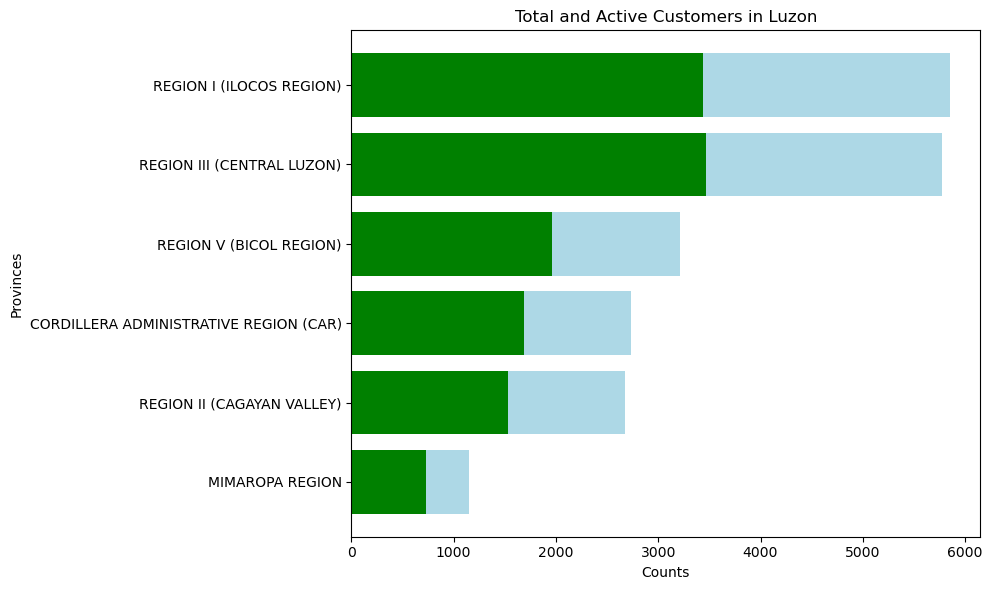

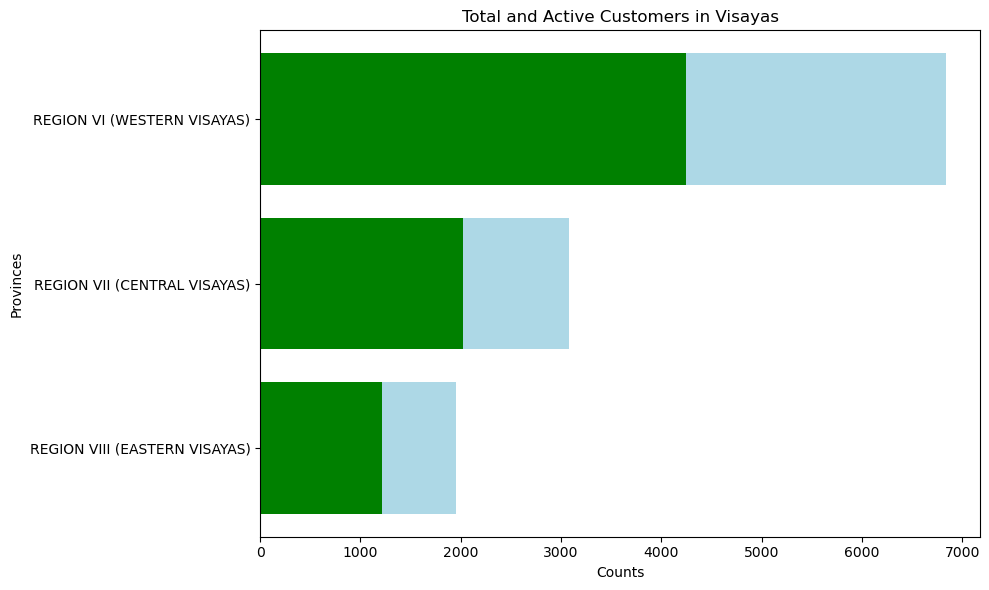

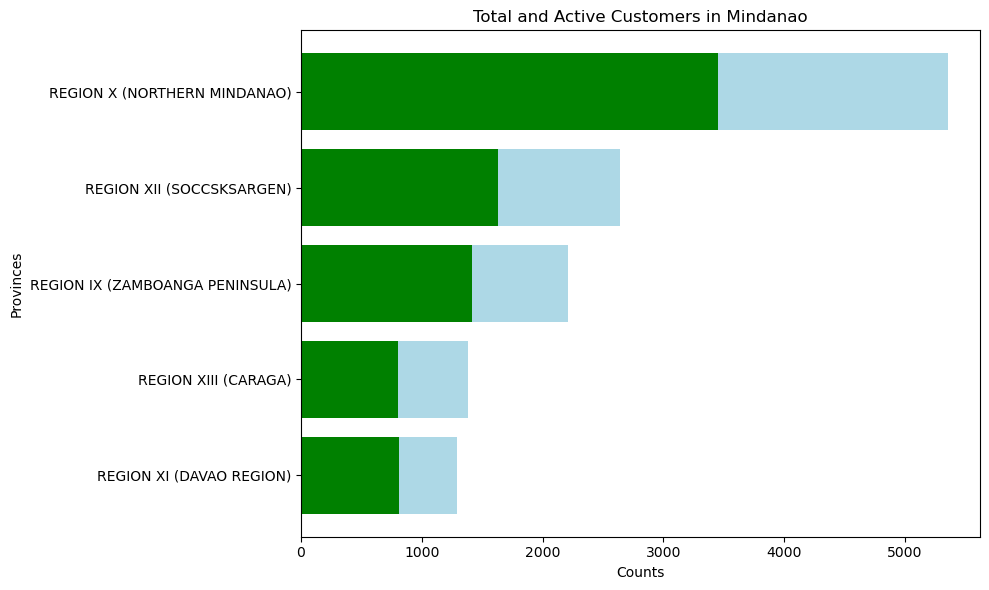

In [86]:
LuzViMin_names = ["Luzon", "Visayas", "Mindanao"]
for i in np.arange(0, len(LuzViMin_data)):
    fig, ax = plt.subplots(figsize=(10, 6))

    group_data = LuzViMin_data[i]

    region_data = group_data.groupby('REGION').sum().sort_values(by="Total")

    ax.barh(region_data.index, region_data['Active'], label='Active', color='green')
    ax.barh(region_data.index, region_data['Total']-region_data['Active'], label='Inactive', color='lightblue', left=region_data['Active'])

    ax.set_ylabel('Provinces')
    ax.set_xlabel('Counts')
    ax.set_title('Total and Active Customers in ' + LuzViMin_names[i])
    ax.set_yticks(region_data.index)

    plt.tight_layout()
    plt.show()

In [87]:
#percent_active.describe()

In [88]:
'''for region in regions:
    plt.figure()  # Create a new figure
    percent_active.loc[region].plot(kind="bar", ylim=(0,1))
    plt.title(f"{region} Region")
    plt.ylabel("")
    plt.show()'''

'for region in regions:\n    plt.figure()  # Create a new figure\n    percent_active.loc[region].plot(kind="bar", ylim=(0,1))\n    plt.title(f"{region} Region")\n    plt.ylabel("")\n    plt.show()'

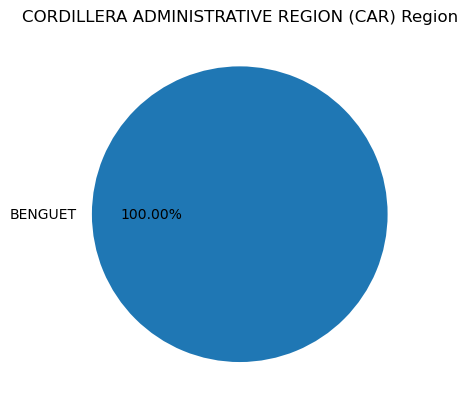

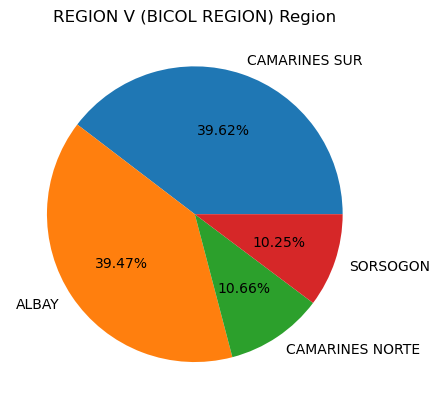

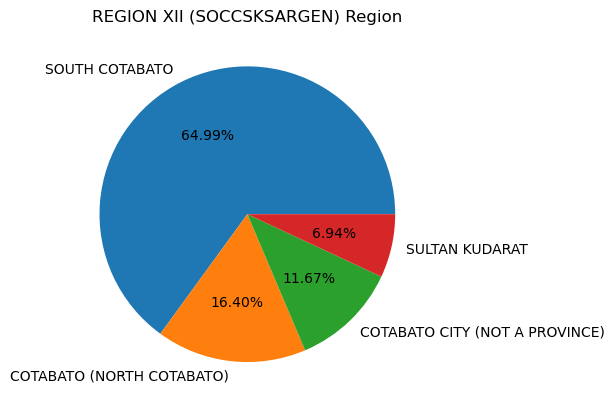

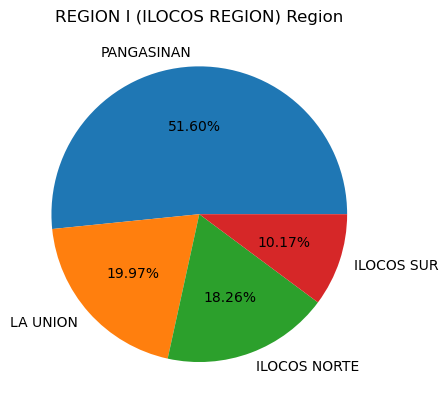

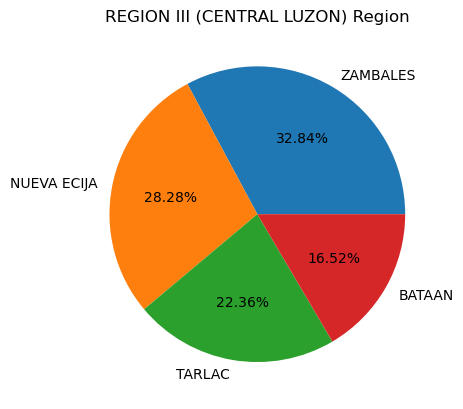

...

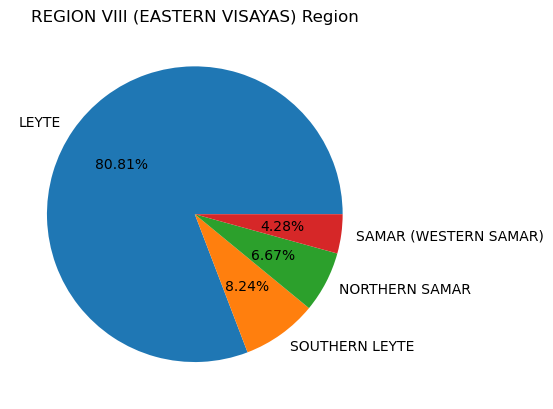

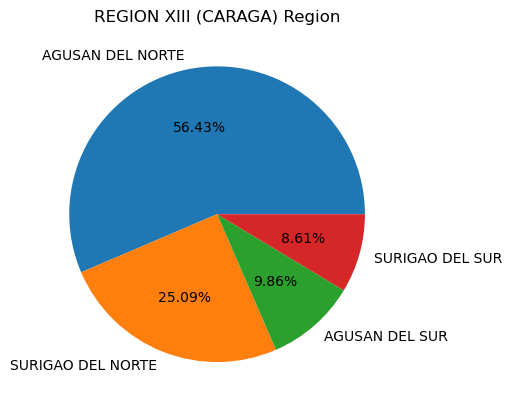

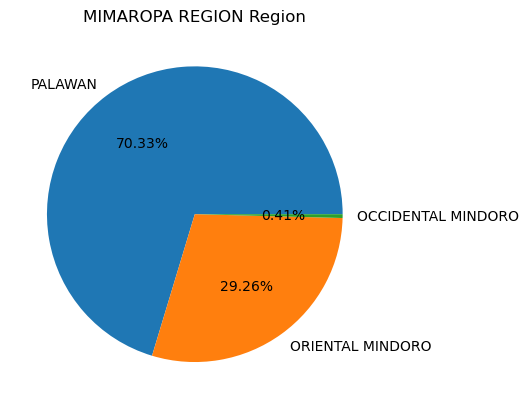

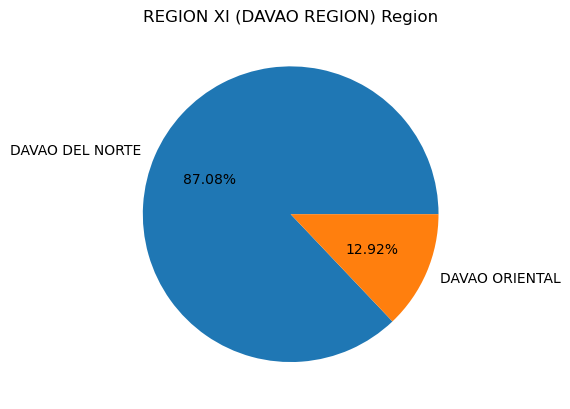

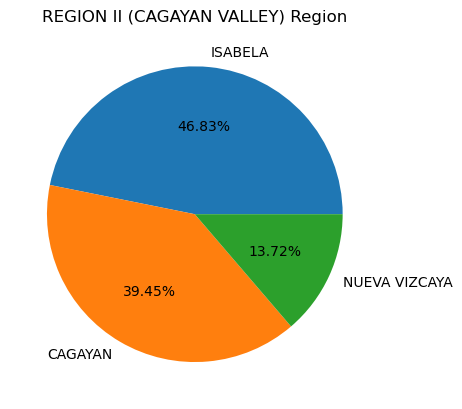

In [89]:
# Pie plot for every region, All active customers
regions = customer_info["REGION"].unique()

for region in regions:
    plt.figure()  # Create a new figure
    active_customer_sum.groupby("REGION")["PROVINCE"].value_counts()[region].plot.pie(autopct="%1.2f%%")
    plt.title(f"{region} Region")
    plt.ylabel("")
    plt.show()

In [90]:
regions = customer_info["REGION"].unique()
len(regions)

14

In [91]:
# for region in regions:
#     customer_info.groupby("REGION")["PROVINCE"].value_counts()[region].plot.pie(subplots=True)
df = customer_info.groupby("REGION")["PROVINCE"].value_counts()["MIMAROPA REGION"]
# pd.pivot_table(df.reset_index(), columns="REGION", values="0")
df

PROVINCE
PALAWAN               799
ORIENTAL MINDORO      348
OCCIDENTAL MINDORO      3
Name: PROVINCE, dtype: int64

In [92]:
customer_info.value_counts(["REGION", "PROVINCE"])

REGION                                  PROVINCE                      
REGION VI (WESTERN VISAYAS)             NEGROS OCCIDENTAL                 4496
REGION X (NORTHERN MINDANAO)            MISAMIS ORIENTAL                  3261
REGION I (ILOCOS REGION)                PANGASINAN                        2947
CORDILLERA ADMINISTRATIVE REGION (CAR)  BENGUET                           2738
REGION III (CENTRAL LUZON)              ZAMBALES                          1914
REGION IX (ZAMBOANGA PENINSULA)         ZAMBOANGA DEL SUR                 1770
REGION XII (SOCCSKSARGEN)               SOUTH COTABATO                    1754
REGION VII (CENTRAL VISAYAS)            NEGROS ORIENTAL                   1678
REGION VIII (EASTERN VISAYAS)           LEYTE                             1615
REGION III (CENTRAL LUZON)              NUEVA ECIJA                       1612
REGION VII (CENTRAL VISAYAS)            BOHOL                             1402
REGION V (BICOL REGION)                 CAMARINES SUR       

## Distribution of Transactions

### By Time

In [93]:
# Create dataset_count for each transaction dataset per customer
datasets_time_count = []
datasets_time_count_names = ["TIME", "C_TXNS", "D_TXNS", "DIG_TXNS", "IN_INSTA_TXNS", "OUT_INSTA_TXNS"]
for i in np.arange(2, len(datasets)):
    if i != 0:
        count = datasets[i].value_counts("TIME").reset_index()
        count.columns = ["TIME", datasets_time_count_names[i]]
        datasets_time_count.append(count)
    else:
        datasets_time_count.append(customer_info)

# Sample
datasets_time_count[0]

,TIME,D_TXNS
0,62652,24
1,63633,23
2,56737,22
3,55853,21
4,57011,21
...,...,...
67450,72668,1
67451,12037,1
67452,12036,1
67453,12033,1


In [94]:
from functools import reduce
merged_time = reduce(lambda  left,right: pd.merge(left,right,on=['TIME'], how='outer'), datasets_time_count)
merged_time = merged_time.sort_values(by="TIME").set_index("TIME")
merged_time

,D_TXNS,DIG_TXNS,IN_INSTA_TXNS,OUT_INSTA_TXNS
TIME,,,,
0,3.0,10.0,2.0,1.0
1,1.0,NaN,1.0,NaN
2,1.0,1.0,1.0,NaN
3,NaN,1.0,NaN,NaN
4,NaN,NaN,1.0,NaN
...,...,...,...,...
86393,NaN,1.0,NaN,NaN
86395,1.0,NaN,3.0,NaN
86397,1.0,NaN,NaN,NaN


<AxesSubplot:xlabel='TIME'>

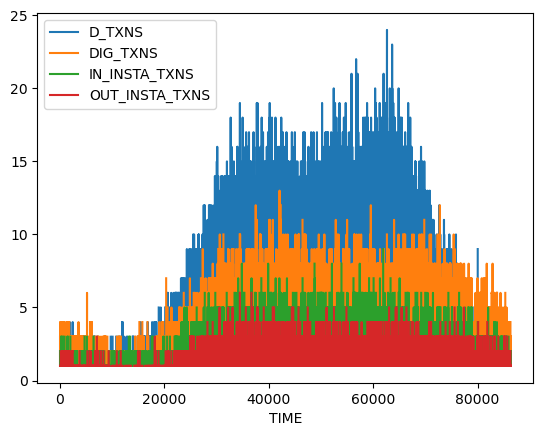

In [95]:
merged_time.plot()

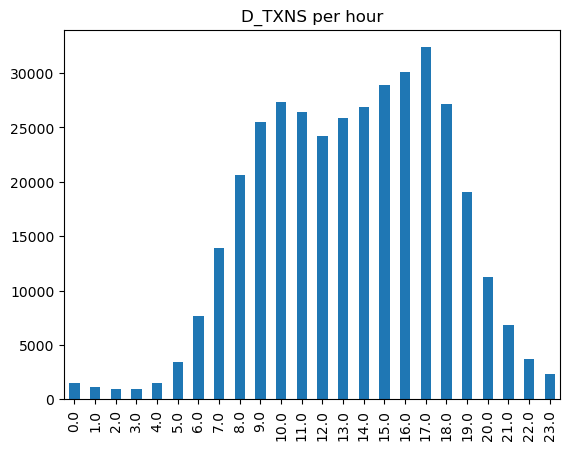

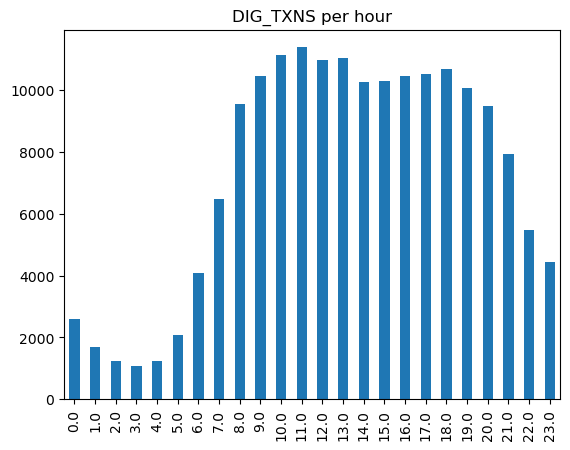

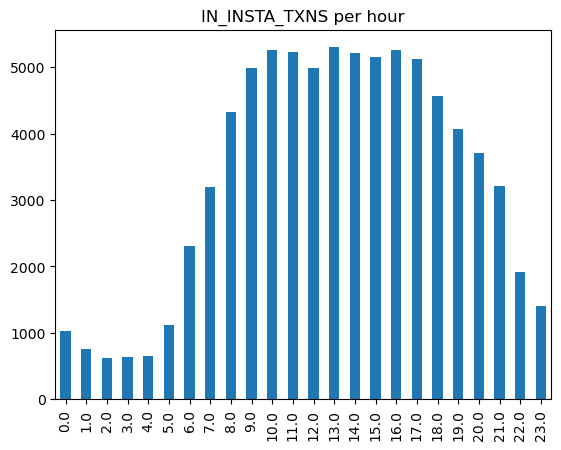

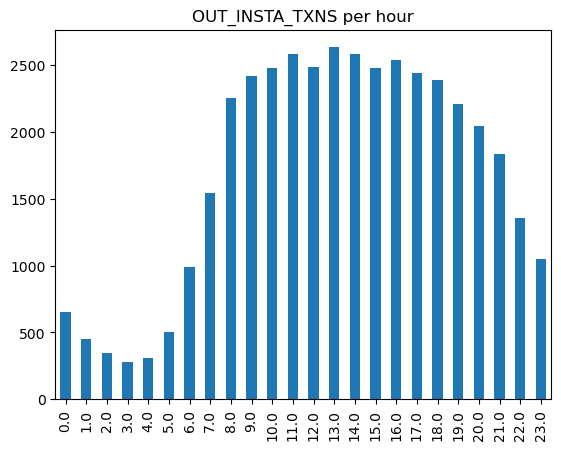

In [96]:
for col in datasets_time_count_names[2:]:
    list = []
    for i in np.arange(0, 60*60*24, 60*60):
        if i == 0:
            hour = i/3600
            count_per_hour = merged_time[merged_time.index<=60*60][col].sum()
            list.append([hour, count_per_hour])
        else:
            hour = i/3600
            count_per_hour = merged_time[(merged_time.index>i) & (merged_time.index<=i+60*60)][col].sum()
            list.append([hour, count_per_hour])

    data = np.array(list)
    x = data[:,0].tolist()
    y = data[:,1].tolist()

    pd.DataFrame(y, x).plot.bar(legend=False, title=f"{col} per hour")

### By Date

<AxesSubplot:xlabel='DATE'>

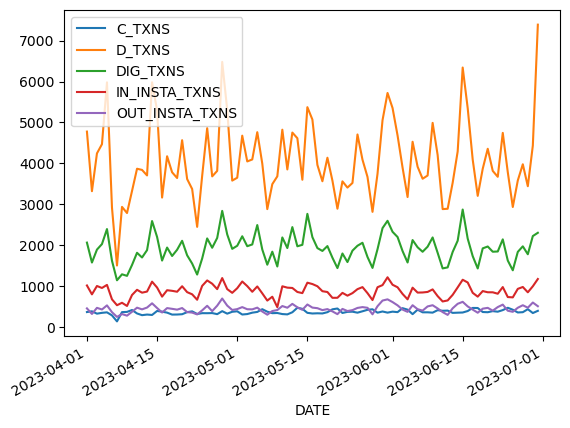

In [97]:
merged_count_date.set_index("DATE").plot()

<AxesSubplot:xlabel='DATE'>

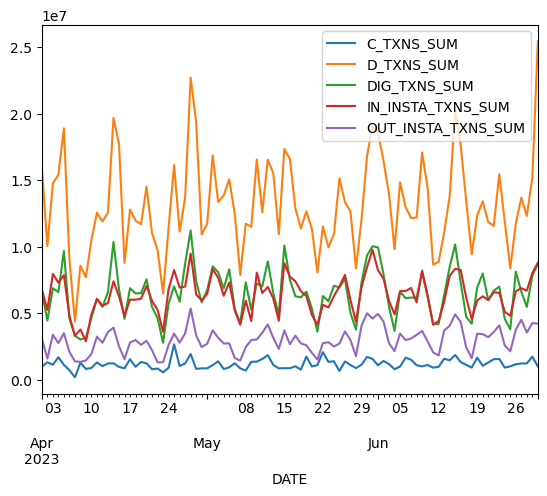

In [98]:
merged_sum_date.set_index("DATE").plot()

<AxesSubplot:xlabel='DATE'>

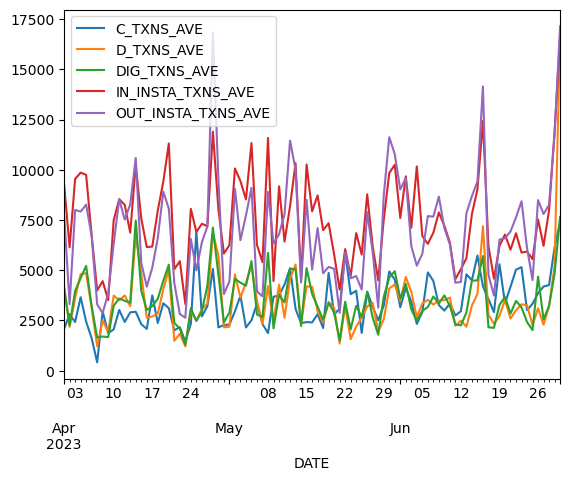

In [99]:
merged_ave_date.plot()

In [100]:
merged_sum_date

,DATE,C_TXNS_SUM,D_TXNS_SUM,DIG_TXNS_SUM,IN_INSTA_TXNS_SUM,OUT_INSTA_TXNS_SUM
0,2023-04-01,9.746271e+05,1.592374e+07,6.683733e+06,6.781972e+06,3.102494e+06
1,2023-04-02,1.317806e+06,1.005541e+07,4.451269e+06,5.250821e+06,1.589111e+06
2,2023-04-03,1.126838e+06,1.476091e+07,6.876218e+06,7.959203e+06,3.390179e+06
3,2023-04-04,1.691844e+06,1.539711e+07,6.591062e+06,7.304538e+06,2.755327e+06
4,2023-04-05,1.120454e+06,1.888949e+07,9.671110e+06,7.863949e+06,3.504510e+06
...,...,...,...,...,...,...
86,2023-06-26,1.163781e+06,1.174181e+07,8.126610e+06,6.649900e+06,3.761011e+06
87,2023-06-27,1.227395e+06,1.368766e+07,6.609170e+06,6.877190e+06,4.505389e+06
88,2023-06-28,1.227052e+06,1.230785e+07,5.473922e+06,6.691098e+06,3.549667e+06
89,2023-06-29,1.736688e+06,1.520087e+07,7.817619e+06,8.025567e+06,4.256745e+06


In [101]:
from datetime import datetime, timedelta
date_start = datetime.strptime('2023-04-01', "%Y-%m-%d")
date_end = datetime.strptime('2023-06-30', "%Y-%m-%d")
no_days = abs((date_end - date_start).days + 1)
no_days

91

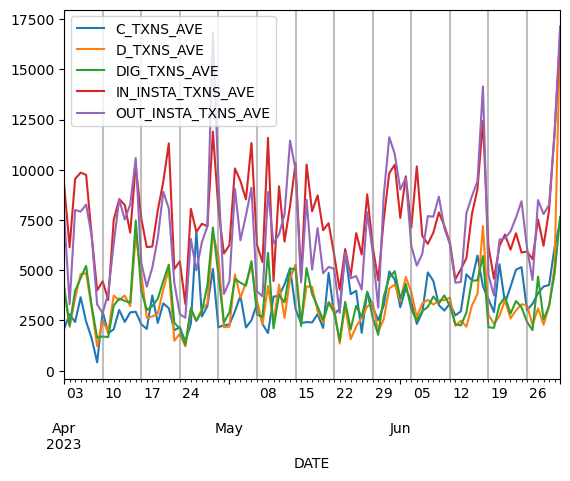

In [102]:
# Marking start of every week (Monday)

merged_ave_date.plot()

date_start_str = '2023-04-01'
date_start = datetime.strptime(date_start_str, "%Y-%m-%d")
date_end = datetime.strptime('2023-06-30', "%Y-%m-%d")

xcoords = [date_start_str]
while date_start < date_end:
    date = date_start + timedelta(days=0)
    date_str = date_start.strftime("%Y-%m-%d")
    xcoords.append(date_str)
    date_start = date_start + timedelta(days=7)

for xc in xcoords:
    plt.axvline(x=xc, color='gray', alpha=0.5)

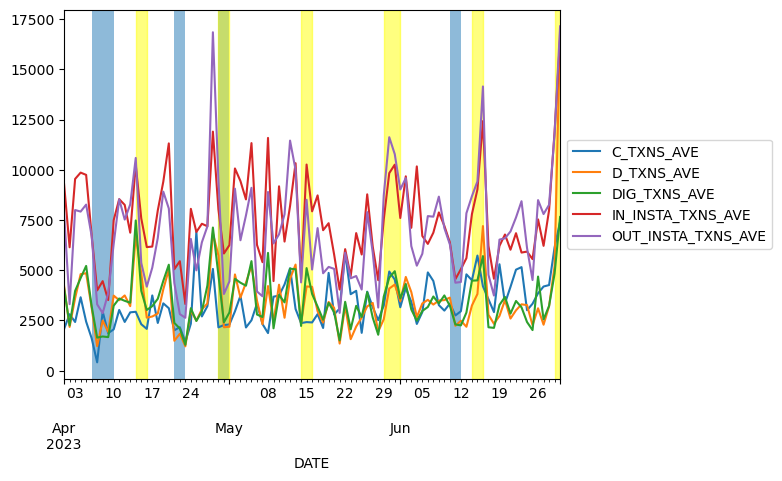

In [103]:
# Marking holidays and paydays

merged_ave_date.plot().legend(loc="center left", bbox_to_anchor=(1,0.5))

# HOLIDAYS
# Holy Week, Araw ng Kagitingan Long Weekend - April 6 - 10
# Eid'l Fitr Long Weekend - April 21 - 23
# Labor Day Long Weekend - April 29 - May 1
# Independence Day Long Weekend - June 10 - 12

plt.axvspan('2023-04-06', '2023-04-10', alpha=0.5)
plt.axvspan('2023-04-21', '2023-04-23', alpha=0.5)
plt.axvspan('2023-04-29', '2023-05-01', alpha=0.5)
plt.axvspan('2023-06-10', '2023-06-12', alpha=0.5)

# PAYDAYS
# Every 15th and 30th

plt.axvspan('2023-04-14', '2023-04-16', color="yellow", alpha=0.5)
plt.axvspan('2023-04-29', '2023-05-01', color="yellow", alpha=0.5)
plt.axvspan('2023-05-14', '2023-05-16', color="yellow", alpha=0.5)
plt.axvspan('2023-05-29', '2023-06-01', color="yellow", alpha=0.5)
plt.axvspan('2023-06-14', '2023-06-16', color="yellow", alpha=0.5)
plt.axvspan('2023-06-29', '2023-06-30', color="yellow", alpha=0.5)

# Bank usually advises before long weekend to clients that they will be down, can be reason why Holy Week Long weekend transactions go down. Also data is not close to payday.
# June 15/30 peak (especially debit transactions) can refer to semi-annual payments, end of school, tuition payments, graduation, or mid-year bonuses.

# Just Tables

## Customer_Info

In [104]:
merged_sum.groupby("PROVINCE").mean()

,CUST_NUM,AGE,TENURE,C_TXNS_SUM,D_TXNS_SUM,DIG_TXNS_SUM,IN_INSTA_TXNS_SUM,OUT_INSTA_TXNS_SUM
PROVINCE,,,,,,,,
AGUSAN DEL NORTE,9388.835479,41.205584,6.458756,43273.795750,52390.084395,53867.541242,44729.488918,36555.960208
AGUSAN DEL SUR,9546.531597,38.402985,4.619403,79392.633238,33887.882116,41517.197001,35109.594059,28175.811442
AKLAN,9403.227971,43.133591,7.219697,85030.649607,44398.323966,53045.414697,50339.174225,36886.025821
ALBAY,9433.748809,39.957699,6.003314,34742.680597,45060.475758,51001.637732,37736.808101,32758.802061
ANTIQUE,9379.790852,45.572430,7.923092,31392.929922,46272.702207,35805.263672,26346.829703,41409.960025
BATAAN,9416.497736,39.210121,6.050513,48071.476735,48630.720332,103743.311678,68972.179884,65331.300385
BENGUET,9410.114998,36.770636,6.370709,48096.146842,41577.373118,54429.439296,40732.930387,39935.530157
BOHOL,9402.480047,41.756795,7.390930,56708.702910,51442.401958,60152.596352,36046.685242,38867.449726
BUKIDNON,9382.801188,39.271669,5.927878,46844.819953,53875.595554,58676.215364,45342.892444,45515.758829


In [105]:
merged_sum.groupby("EDUCATION").mean()

,CUST_NUM,AGE,TENURE,C_TXNS_SUM,D_TXNS_SUM,DIG_TXNS_SUM,IN_INSTA_TXNS_SUM,OUT_INSTA_TXNS_SUM
EDUCATION,,,,,,,,
HIGH,9315.580768,51.267816,9.839272,53505.859868,46623.761873,65500.459650,47970.771730,49300.438147
LOW,9441.430975,43.196592,7.440294,42611.861836,38402.546954,43732.997263,36797.375314,28747.466673
MID,9449.147022,41.751136,8.195612,52083.827233,54658.385624,70012.686174,49154.858277,49022.670021
NO_DATA,9379.320499,34.706466,2.030889,41786.218931,41414.259176,44257.097228,41090.466952,40646.130004


In [106]:
merged_sum['AGE_GROUP'] = pd.cut(merged_sum['AGE'], bins=np.arange(0,130,10), labels=['0-10', '11-20', '21-30', '31-40', '41-50', '51-60', '61-70', '71-80', '81-90', '91-100', '100-110', '110-120'])

merged_sum.groupby('AGE_GROUP').mean()

,CUST_NUM,AGE,TENURE,C_TXNS_SUM,D_TXNS_SUM,DIG_TXNS_SUM,IN_INSTA_TXNS_SUM,OUT_INSTA_TXNS_SUM
AGE_GROUP,,,,,,,,
0-10,8917.367614,7.321429,3.839286,NaN,45020.064302,NaN,25215.709219,66348.749260
11-20,9359.086943,17.870782,2.902881,NaN,26087.315248,23678.634038,23118.253607,13494.081356
21-30,9411.230957,26.337089,3.762247,43977.845794,44031.398968,48060.149843,38858.504022,34049.548452
31-40,9468.541645,34.995864,5.902633,44737.940497,55560.364034,69795.929070,56014.159625,51556.421624
41-50,9411.297314,44.908540,7.710738,60061.619689,57710.257651,71237.742733,46758.031759,58163.306103
51-60,9346.779581,55.294953,8.405682,69883.711523,49614.067533,54429.900423,32778.312133,54460.138827
61-70,9401.083925,65.273863,8.412127,47608.363767,30389.880059,46402.935641,35627.283998,42817.175722
71-80,9524.390319,74.462570,11.568017,25533.806341,23098.619085,82944.659616,34980.877918,20701.419756
81-90,9515.271440,84.452340,15.614674,NaN,16824.790420,16050.883519,24155.020388,17790.710245


In [107]:
merged_sum['TENURE_GROUP'] = pd.cut(merged_sum['TENURE'], bins=np.arange(0,31))
merged_sum.groupby('TENURE_GROUP').mean()

,CUST_NUM,AGE,TENURE,C_TXNS_SUM,D_TXNS_SUM,DIG_TXNS_SUM,IN_INSTA_TXNS_SUM,OUT_INSTA_TXNS_SUM
TENURE_GROUP,,,,,,,,
"(0, 1]",9342.044005,33.859830,0.558520,54681.733589,37600.345361,42823.920213,41669.888210,42374.560780
"(1, 2]",9445.347510,34.743865,1.497426,38546.708783,47786.722509,46732.367558,41920.883732,43796.159654
"(2, 3]",9337.161884,35.228235,2.529489,32357.692891,44556.507122,40078.391529,37662.767323,32577.687075
"(3, 4]",9417.501682,35.907712,3.612418,36109.188029,44890.922429,45653.006598,38394.261966,36071.629491
"(4, 5]",9542.814520,37.827780,4.552284,46509.376197,46067.603357,61247.464076,44915.576655,36453.083146
"(5, 6]",9424.237094,37.756092,5.521463,57773.134953,47596.718825,59565.491505,43365.735691,42133.274838
"(6, 7]",9381.295258,38.835123,6.512476,40666.073180,50067.332078,61173.016394,44245.322982,44314.395837
"(7, 8]",9542.571360,41.363888,7.513697,51923.361833,45938.626691,60938.037655,47042.063286,43035.843992
"(8, 9]",9489.182409,42.511233,8.526502,44898.805666,48572.492834,78071.369382,53024.146252,51480.861753


In [108]:
merged_sum.groupby("BUSINESS_OWNER").mean()

,CUST_NUM,AGE,TENURE,C_TXNS_SUM,D_TXNS_SUM,DIG_TXNS_SUM,IN_INSTA_TXNS_SUM,OUT_INSTA_TXNS_SUM
BUSINESS_OWNER,,,,,,,,
N,9423.665329,39.806795,6.136836,47485.277346,46239.472431,55636.885963,43512.327143,42993.792689
Y,9446.170014,48.817153,9.024960,81618.351730,58396.002500,132539.388300,67656.854749,62029.364433


In [109]:
merged_sum.groupby("DIGITAL_FLAG").mean()

,CUST_NUM,AGE,TENURE,C_TXNS_SUM,D_TXNS_SUM,DIG_TXNS_SUM,IN_INSTA_TXNS_SUM,OUT_INSTA_TXNS_SUM
DIGITAL_FLAG,,,,,,,,
DIGITAL,9428.451466,32.776318,5.343154,49611.748626,52981.841141,68530.697428,53146.503590,49538.907919
NO_DATA,9432.296162,43.239016,7.649402,35517.407342,17956.495845,NaN,19423.821696,16504.165370
TRADITIONAL,9418.123861,42.028199,5.860028,54219.840157,47051.682199,22754.007449,36596.182832,28709.123910


In [110]:
merged_sum.groupby("INCOME_SOURCE").count()["CUST_NUM"]

INCOME_SOURCE
ALLOWANCE                                   6119
BUSINESS                                    2606
CAMPAIGN_FUND                                  1
COMMISSION                                   511
DONATION                                       7
ECONOMICALLY_INACTIVE                        100
INTEREST_SAVINGS_PLACEMENTS_INVESTMENTS       78
NO_DATA                                      610
OTHER_SOURCES_NOT_SPECIFIED                  727
PENSION                                     3685
REMITTANCE                                  3527
SALARY                                     28177
Name: CUST_NUM, dtype: int64

In [111]:
merged_sum.groupby("INCOME_SOURCE").mean()

,CUST_NUM,AGE,TENURE,C_TXNS_SUM,D_TXNS_SUM,DIG_TXNS_SUM,IN_INSTA_TXNS_SUM,OUT_INSTA_TXNS_SUM
INCOME_SOURCE,,,,,,,,
ALLOWANCE,9380.191533,31.605491,5.111252,48985.076314,42576.744125,46040.506683,41140.757845,36065.483811
BUSINESS,9430.167607,46.657713,7.478959,81788.239226,69035.513436,138005.908993,97305.714532,97475.121428
CAMPAIGN_FUND,7204.670985,28.000000,0.750000,NaN,NaN,192827.307669,26135.044940,15648.777978
COMMISSION,9666.058793,44.252446,6.114481,51961.393811,45412.013141,72161.719636,51297.790327,46856.229005
DONATION,8993.119457,51.428571,7.666667,NaN,39198.820762,50181.296474,31873.106276,52792.897944
ECONOMICALLY_INACTIVE,10029.463253,42.360000,4.838333,32118.778672,58091.858796,29124.201061,43333.018455,21336.327032
INTEREST_SAVINGS_PLACEMENTS_INVESTMENTS,8548.391277,45.615385,6.428419,30111.439353,40508.877825,82476.944309,59737.336504,47335.991940
NO_DATA,9632.328738,60.511905,16.700137,65399.446894,37200.535769,84832.061383,34050.634419,50242.134604
OTHER_SOURCES_NOT_SPECIFIED,9425.699886,46.353508,11.030032,37279.741075,43892.755726,60711.382522,46211.488368,61022.247902


In [112]:
merged_sum.groupby("INCOME_SOURCE").describe()

CUST_NUM                             \
                                           count          mean          std   
INCOME_SOURCE                                                                 
ALLOWANCE                                 6119.0   9380.191533  3331.741403   
BUSINESS                                  2606.0   9430.167607  3364.694307   
CAMPAIGN_FUND                                1.0   7204.670985          NaN   
COMMISSION                                 511.0   9666.058793  3224.408280   
DONATION                                     7.0   8993.119457  2452.650844   
ECONOMICALLY_INACTIVE                      100.0  10029.463253  3353.898903   
INTEREST_SAVINGS_PLACEMENTS_INVESTMENTS     78.0   8548.391277  3740.738819   
NO_DATA                                    610.0   9632.328738  3190.151517   
OTHER_SOURCES_NOT_SPECIFIED                727.0   9425.699886  3347.950794   
PENSION                                   3685.0   9440.401519  3340.064586   
REMITTANCE                                3527.0   9412.038251  3337.090728   
SALARY                                   28177.0   9425.099046  3338.929668   

                                                                   \
                                                 min          25%   
INCOME_SOURCE                                                       
ALLOWANCE                                 234.955315  7064.446325   
BUSINESS                                  169.127171  7018.163467   
CAMPAIGN_FUND                            7204.670985  7204.670985   
COMMISSION                               1092.822950  7508.471823   
DONATION                                 5554.803687  7426.361971   
ECONOMICALLY_INACTIVE                    1315.676252  7873.359639   
INTEREST_SAVINGS_PLACEMENTS_INVESTMENTS   844.523534  5385.594504   
NO_DATA                                   808.097766  7312.326684   
OTHER_SOURCES_NOT_SPECIFIED               617.449593  7069.474184   
PENSION                                   201.156655  7111.309303   
REMITTANCE                                 85.229103  7020.468524   
SALARY                                     96.457244  7058.916631   

                                                                     \
                                                  50%           75%   
INCOME_SOURCE                                                         
ALLOWANCE                                 9891.151702  12219.173982   
BUSINESS                                 10033.544318  12248.913574   
CAMPAIGN_FUND                             7204.670985   7204.670985   
COMMISSION                               10466.796167  12182.806524   
DONATION                                  9253.207228  10101.981234   
ECONOMICALLY_INACTIVE                    11100.699074  12775.999589   
INTEREST_SAVINGS_PLACEMENTS_INVESTMENTS   8787.503994  11836.087753   
NO_DATA                                  10287.213299  12265.392667   
OTHER_SOURCES_NOT_SPECIFIED              10020.393306  12295.075832   
PENSION                                   9993.560126  12324.674438   
REMITTANCE                               10000.848064  12205.479929   
SALARY                                   10004.543068  12245.234175   

                                                           AGE             \
                                                  max    count       mean   
INCOME_SOURCE                                                               
ALLOWANCE                                14140.656350   6119.0  31.605491   
BUSINESS                                 14140.050354   2606.0  46.657713   
CAMPAIGN_FUND                             7204.670985      1.0  28.000000   
COMMISSION                               14114.088139    511.0  44.252446   
DONATION                                 13087.138878      7.0  51.428571   
ECONOMICALLY_INACTIVE                    14125.608801    100.0  42.360000   
INTEREST_SAVINGS_PLACEMENTS_INVESTMENTS  14063.707975     7

In [113]:
merged_sum.groupby("GENDER").mean()

,CUST_NUM,AGE,TENURE,C_TXNS_SUM,D_TXNS_SUM,DIG_TXNS_SUM,IN_INSTA_TXNS_SUM,OUT_INSTA_TXNS_SUM
GENDER,,,,,,,,
FEMALE,9454.550979,40.226180,6.278189,49138.648572,47000.926527,58746.428959,45034.551503,43306.547347
MALE,9379.205879,40.323380,6.282313,51839.098296,46352.384370,57684.014747,44682.306523,44486.613610
OTHERS,9473.263355,39.747014,6.315889,40364.146625,47153.280191,48456.306638,34864.959267,39840.500563


In [114]:
merged_sum.groupby("MARITAL_STATUS").mean()

,CUST_NUM,AGE,TENURE,C_TXNS_SUM,D_TXNS_SUM,DIG_TXNS_SUM,IN_INSTA_TXNS_SUM,OUT_INSTA_TXNS_SUM
MARITAL_STATUS,,,,,,,,
DIVORCED,9486.092644,42.614301,6.600397,47186.657435,49660.492754,62270.152635,42664.823719,46263.480787
MARRIED,9434.758093,41.969603,6.584566,48816.643348,47812.258062,59633.207749,44430.714411,46276.796060
OTHERS,9461.541559,41.471366,6.325624,32165.530959,43834.646414,45117.410041,41081.711822,32670.824380
SEPARATED,9510.227188,42.264516,6.695699,48652.190137,51812.503462,72790.573884,46944.522568,60634.261439
SINGLE,9410.419357,39.026432,6.055694,52461.525762,45769.637287,56948.447912,45070.928049,41466.734121
WIDOWED,9504.676921,41.357195,6.715715,33267.527964,50753.057451,61359.575415,42806.549466,54829.089919


## Credit Card Txns

In [115]:
credit_card_txns.groupby("MERCH_NAME").sum().sort_values(by="AMOUNT")

,CUST_NUM,AMOUNT
MERCH_NAME,,
MERCHANT 2957,4.684259e+03,2.135607e+01
MERCHANT 2661,5.136793e+03,3.431476e+01
MERCHANT 2048,4.160447e+03,4.596761e+01
MERCHANT 2446,3.505818e+03,4.941136e+01
MERCHANT 830,1.039645e+04,5.021275e+01
...,...,...
MERCHANT 546,1.503321e+05,2.296790e+06
MERCHANT 22,9.998361e+06,2.398407e+06
MERCHANT 14,4.506585e+06,2.671432e+06


In [116]:
credit_card_txns.groupby("MERCH_NAME").mean().sort_values(by="AMOUNT")

,CUST_NUM,AMOUNT
MERCH_NAME,,
MERCHANT 2957,4684.259173,21.356066
MERCHANT 2661,5136.793163,34.314761
MERCHANT 2048,4160.447332,45.967608
MERCHANT 2446,3505.818022,49.411361
MERCHANT 830,10396.451510,50.212755
...,...,...
MERCHANT 1909,8698.142560,129521.810888
MERCHANT 1394,6227.394479,150071.405507
MERCHANT 2343,10601.938064,175757.007680


In [117]:
credit_card_txns.groupby("MERCH_GROUP").mean().sort_values(by="AMOUNT")

,CUST_NUM,AMOUNT
MERCH_GROUP,,
Transportation Services,9936.399081,1075.632246
Agricultural Services,8693.982023,1584.485037
Business Services,9560.001677,1933.966751
Retail Outlet Services,9579.177267,2419.547313
Clothing Stores,9671.715812,2427.338741
Government Services,9124.651187,2792.756498
Miscellaneous Stores,9663.286274,4138.228261
Contracted Services,10362.002449,4302.801128
Lodging,9319.967241,5275.842593


In [118]:
credit_card_txns.groupby("COUNTRY").sum().sort_values(by="AMOUNT")

,CUST_NUM,AMOUNT
COUNTRY,,
COUNTRY 19,8.248456e+03,8.867762e+01
COUNTRY 29,1.164235e+04,4.394535e+02
COUNTRY 27,1.064014e+04,9.358868e+02
COUNTRY 28,1.836113e+04,1.113505e+03
COUNTRY 36,5.710811e+03,1.726015e+03
COUNTRY 40,1.235105e+04,2.962816e+03
COUNTRY 30,5.265199e+04,3.528416e+03
COUNTRY 37,1.185960e+04,4.332489e+03
COUNTRY 22,9.222271e+04,9.659106e+03


In [119]:
credit_card_txns.groupby("COUNTRY").mean().sort_values(by="AMOUNT")

,CUST_NUM,AMOUNT
COUNTRY,,
COUNTRY 19,8248.455734,88.677624
COUNTRY 7,9879.622904,315.839031
COUNTRY 29,11642.354745,439.453503
COUNTRY 28,9180.564253,556.752417
COUNTRY 4,9257.962512,679.546375
COUNTRY 23,7546.652370,803.748609
COUNTRY 22,8383.882431,878.100532
COUNTRY 30,13162.996771,882.103963
COUNTRY 27,10640.142010,935.886763


In [120]:
credit_card_txns.groupby("CHANNEL").mean().sort_values(by="AMOUNT")

,CUST_NUM,AMOUNT
CHANNEL,,
ONLINE-RETAIL PURCHASE,9795.384155,1957.095055
POS-RETAIL PURCHASE,9563.949823,2230.541564
SIP-RETAIL PURCHASE,9205.997625,41132.868747


## Debit Purchase Txns

In [121]:
debit_purchase_txns.groupby("CHANNEL").sum().sort_values(by="AMOUNT")

,CUST_NUM,TIME,AMOUNT
CHANNEL,,,
ECOMMERCE,1.230302e+08,600301670,9.214224e+06
POS,3.361942e+09,17902351366,1.188235e+09


In [122]:
debit_purchase_txns.groupby("CHANNEL").mean().sort_values(by="AMOUNT")

,CUST_NUM,TIME,AMOUNT
CHANNEL,,,
ECOMMERCE,9591.501783,46799.849536,718.345986
POS,9423.354436,50179.392618,3330.561691


## Financial Digital Txns

In [123]:
financial_digital_txns.groupby("CHANNEL").sum().sort_values(by="AMOUNT")

,CUST_NUM,AMOUNT,TIME
CHANNEL,,,
BEAMS,2.739727e+05,4.821572e+05,4046790
OPEN BANKING,1.295610e+08,4.062128e+07,688722222
WEB,9.033511e+08,2.112463e+08,4839973418
MOBILE,6.222059e+08,3.384527e+08,3355434198


In [124]:
financial_digital_txns.groupby("CHANNEL").mean().sort_values(by="AMOUNT")

,CUST_NUM,AMOUNT,TIME
CHANNEL,,,
WEB,9509.559365,2223.785604,50950.306525
OPEN BANKING,9514.650292,2983.130202,50578.117206
MOBILE,9437.370867,5133.515264,50893.890460
BEAMS,3805.176017,6696.627672,56205.416667


In [125]:
financial_digital_txns.groupby("TRAN_TYPE").mean().sort_values(by="AMOUNT")

,CUST_NUM,AMOUNT,TIME
TRAN_TYPE,,,
E-WALLET,9453.377238,2315.993690,50977.702080
BILLS PAYMENT,9531.013332,7464.451645,49712.556071
INTERNAL FUNDS TRANSFER,9607.618988,7696.971546,50911.067149


## Incoming Instapay Txns

In [126]:
incoming_instapay_txns.groupby("BPI_ACCT_TYPE").sum().sort_values(by="AMOUNT")

,CUST_NUM,TIME,AMOUNT
BPI_ACCT_TYPE,,,
CA,8.141825e+06,40686928,8.752368e+06
SA,7.546217e+08,3934678620,5.693676e+08


In [127]:
incoming_instapay_txns.groupby("BPI_ACCT_TYPE").mean().sort_values(by="AMOUNT")

,CUST_NUM,TIME,AMOUNT
BPI_ACCT_TYPE,,,
SA,9522.280223,49650.194579,7184.630342
CA,10254.188177,51242.982368,11023.133600


In [128]:
incoming_instapay_txns.groupby("SRC_BANK_NAME").sum().sort_values(by="AMOUNT")

,CUST_NUM,TIME,AMOUNT
SRC_BANK_NAME,,,
COUGAR,5.529060e+03,36666,4.999336e+03
IBEX,4.802625e+03,70140,6.999456e+03
CAMEL,1.785689e+03,34780,8.604975e+03
LYNX,2.464038e+04,229528,2.299557e+04
SHREW,1.707376e+04,100614,2.322826e+04
TAPIR,3.612476e+04,150338,5.407690e+04
BOBCAT,9.313617e+04,426206,6.327782e+04
BADGER,5.551068e+04,234508,7.299571e+04
DOLPHIN,5.893471e+05,2701094,1.956086e+05


In [129]:
incoming_instapay_txns.groupby("SRC_BANK_NAME").mean().sort_values(by="AMOUNT")

,CUST_NUM,TIME,AMOUNT
SRC_BANK_NAME,,,
DOLPHIN,9661.427948,44280.229508,3206.698244
ZEBRA,10028.680102,48693.888889,3323.879773
SQUIRREL,9756.359603,50468.407407,4496.480239
OTTER,9455.038321,50422.458333,4624.987952
SEAL,10220.138518,48396.040590,4990.809582
COUGAR,5529.059595,36666.000000,4999.336422
EMU,9325.006668,54208.292683,5039.174536
HUMAN,9568.211259,50173.551710,5269.575726
MEERKAT,9442.776836,47429.137681,5352.909505


## Outgoing Instapay Txns

In [130]:
outgoing_instapay_txns.groupby("CHANNEL").sum().sort_values(by="AMOUNT")

,CUST_NUM,TIME,AMOUNT
CHANNEL,,,
ONLINE,3.741081e+06,19051477,3.397658e+06
MOBILE,3.842783e+08,2045220204,2.690412e+08


In [131]:
outgoing_instapay_txns.groupby("CHANNEL").mean().sort_values(by="AMOUNT")

,CUST_NUM,TIME,AMOUNT
CHANNEL,,,
MOBILE,9503.371632,50579.191908,6653.507849
ONLINE,9519.290938,48477.040712,8645.439842


In [132]:
outgoing_instapay_txns.groupby("RCV_BANK_NAME").sum().sort_values(by="AMOUNT")

,CUST_NUM,TIME,AMOUNT
RCV_BANK_NAME,,,
RAT,8.445244e+03,68731,2.255821e+03
HAMSTER,2.710565e+03,58230,4.959651e+03
SHREW,1.078503e+04,67485,5.000257e+03
MARMOSET,9.787496e+03,46105,1.060375e+04
FERRET,4.963053e+04,176355,1.065525e+04
SKUNK,5.380169e+04,303388,1.189651e+04
LYNX,1.384619e+04,64248,1.399978e+04
JACKAL,7.172606e+04,292999,2.091486e+04
HYENA,4.659368e+04,365853,2.279747e+04


In [133]:
outgoing_instapay_txns.groupby("RCV_BANK_NAME").mean().sort_values(by="AMOUNT")

,CUST_NUM,TIME,AMOUNT
RCV_BANK_NAME,,,
DOLPHIN,8087.410374,49732.192593,1003.133120
SKUNK,6725.211075,37923.500000,1487.063404
FERRET,8271.755794,29392.500000,1775.875778
RAT,8445.243750,68731.000000,2255.821075
HYENA,5824.210140,45731.625000,2849.684084
HUMAN,9507.911794,50903.150925,3388.914671
JACKAL,11954.343340,48833.166667,3485.809394
SQUIRREL,9764.007550,50650.146667,3563.160669
HAMSTER,2710.564886,58230.000000,4959.650904


In [134]:
customer_info["PROVINCE"].unique()

array(['BENGUET', 'CAMARINES NORTE', 'COTABATO CITY (NOT A PROVINCE)',
       'ILOCOS NORTE', 'ZAMBALES', 'BOHOL', 'MISAMIS ORIENTAL',
       'ZAMBOANGA DEL SUR', 'CAPIZ', 'BATAAN', 'PANGASINAN',
       'CAMARINES SUR', 'NEGROS OCCIDENTAL', 'SOUTHERN LEYTE',
       'AGUSAN DEL NORTE', 'LANAO DEL NORTE', 'ALBAY', 'PALAWAN',
       'NUEVA ECIJA', 'NEGROS ORIENTAL', 'LA UNION', 'DAVAO DEL NORTE',
       'BUKIDNON', 'TARLAC', 'LEYTE', 'SORSOGON', 'ILOCOS SUR',
       'MISAMIS OCCIDENTAL', 'SOUTH COTABATO', 'AKLAN',
       'ZAMBOANGA DEL NORTE', 'AGUSAN DEL SUR', 'CAGAYAN',
       'SURIGAO DEL SUR', 'SURIGAO DEL NORTE', 'NORTHERN SAMAR',
       'ISABELA', 'COTABATO (NORTH COTABATO)', 'ORIENTAL MINDORO',
       'DAVAO ORIENTAL', 'NUEVA VIZCAYA', 'ANTIQUE',
       'SAMAR (WESTERN SAMAR)', 'SULTAN KUDARAT', 'OCCIDENTAL MINDORO'],
      dtype=object)

<AxesSubplot:>

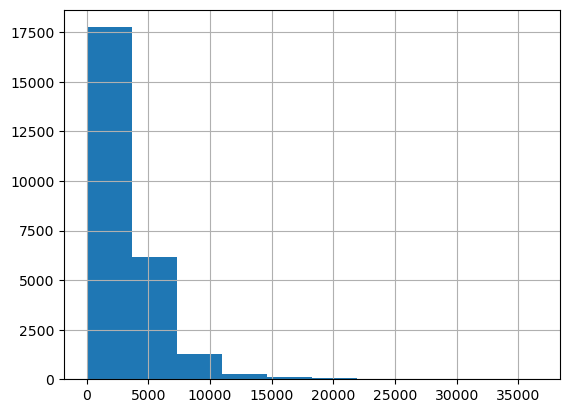

In [135]:
merged_ave["D_TXNS_AVE"].hist()

In [136]:
merged_ave[merged_ave["D_TXNS_AVE"]<5000]

,C_TXNS_AVE,D_TXNS_AVE,DIG_TXNS_AVE,IN_INSTA_TXNS_AVE,OUT_INSTA_TXNS_AVE
CUST_NUM,,,,,
11712.654012,NaN,497.323374,5909.463166,2619.191451,1626.116225
921.989154,NaN,3589.183196,643.365502,3349.209339,NaN
1119.634762,NaN,1.462774,NaN,NaN,NaN
1709.755538,NaN,1739.843225,1155.643162,3886.745466,NaN
1964.683690,NaN,1339.162934,NaN,1865.852125,NaN
...,...,...,...,...,...
13769.613066,NaN,731.775585,NaN,NaN,NaN
13806.610156,NaN,1726.241449,149.666194,NaN,NaN
13858.741068,NaN,2843.521992,1700.227773,1989.958481,NaN


<AxesSubplot:>

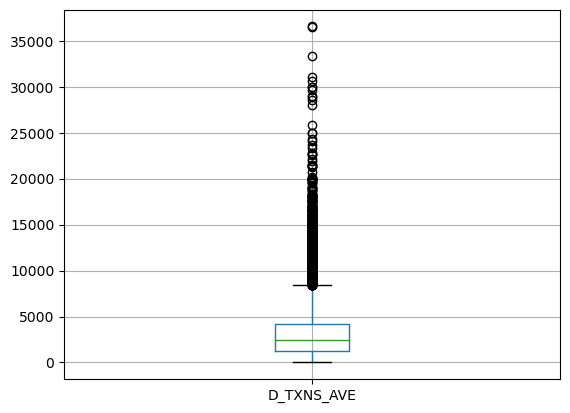

In [137]:
merged_ave[["D_TXNS_AVE"]].boxplot()

In [138]:
merged_ave_filtered = merged_ave.copy()
outlier_customers=[]

for col_name in merged_ave.columns:
    Q1 = merged_ave[col_name].quantile(0.25)
    Q3 = merged_ave[col_name].quantile(0.75)
    IQR = Q3 - Q1

    lower_bound = Q1 - 1.5*IQR
    upper_bound = Q3 + 1.5*IQR

    outlier_customers.extend(merged_ave_filtered[(merged_ave_filtered[col_name] <= lower_bound) | (merged_ave_filtered[col_name] >= upper_bound)].index.tolist())

outlier_customers

[7753.85349358627,
 1550.477345851915,
 2809.024741792069,
 11810.07027921511,
 14071.97647809291,
 9446.4904594246,
 5477.526996738583,
 6283.301679849536,
 8886.39195624411,
 9459.689318365588,
 9773.060114416568,
 9943.695691240757,
 11077.7506742118,
 12745.0635149457,
 13002.04530064405,
 13607.67290906127,
 8540.346597182108,
 12351.05258672312,
 9082.735380930131,
 12387.30729416204,
 9363.380799689821,
 7724.163514582016,
 10391.07126334913,
 11899.80260340481,
 12982.18171186954,
 2501.583498506496,
 13358.61534740783,
 5466.322712756722,
 6693.020394410883,
 9572.494136848556,
 10524.61410218921,
 10937.76503678882,
 12417.78732302982,
 12925.82771044083,
 10517.48829331414,
 5705.15205757042,
 12996.55354315135,
 8698.14256034011,
 9746.80870849531,
 10056.18923847399,
 10486.58104436331,
 11184.92834129929,
 11773.01923892083,
 9876.694791275066,
 13143.99566341986,
 7888.547521565678,
 8585.822034027959,
 2047.960448836842,
 3255.570610507473,
 6412.938639968419,
 7162.447

In [139]:
merged_ave_filtered[merged_ave_filtered.index.isin(outlier_customers)]

,C_TXNS_AVE,D_TXNS_AVE,DIG_TXNS_AVE,IN_INSTA_TXNS_AVE,OUT_INSTA_TXNS_AVE
CUST_NUM,,,,,
8280.194684,NaN,2322.201820,3340.320464,2999.233828,24999.713152
8393.631157,NaN,5555.475584,3917.043369,20099.607492,7499.610566
8714.853068,NaN,3206.182014,25000.858898,5249.294560,3010.596083
11139.303569,NaN,3108.120803,NaN,19565.969249,199.797221
12461.167843,NaN,NaN,NaN,39998.781767,39999.615526
...,...,...,...,...,...
7819.021934,NaN,651.702409,NaN,NaN,25374.546449
8519.239637,NaN,9001.310072,NaN,NaN,NaN
10383.788422,NaN,8645.302472,6000.498332,1911.867691,3810.674759


In [140]:
merged_ave_filtered[np.logical_not(merged_ave_filtered.index.isin(outlier_customers))]

,C_TXNS_AVE,D_TXNS_AVE,DIG_TXNS_AVE,IN_INSTA_TXNS_AVE,OUT_INSTA_TXNS_AVE
CUST_NUM,,,,,
11712.654012,NaN,497.323374,5909.463166,2619.191451,1626.116225
436.605085,NaN,NaN,NaN,NaN,NaN
921.989154,NaN,3589.183196,643.365502,3349.209339,NaN
1119.634762,NaN,1.462774,NaN,NaN,NaN
1709.755538,NaN,1739.843225,1155.643162,3886.745466,NaN
...,...,...,...,...,...
14060.827927,NaN,NaN,NaN,4199.578771,NaN
14101.987945,NaN,NaN,NaN,NaN,NaN
11266.634103,NaN,NaN,9799.940690,NaN,8007.010094


In [141]:
merged_ave_filtered[np.logical_not(merged_ave_filtered.index.isin(outlier_customers))].dropna(how='all')

,C_TXNS_AVE,D_TXNS_AVE,DIG_TXNS_AVE,IN_INSTA_TXNS_AVE,OUT_INSTA_TXNS_AVE
CUST_NUM,,,,,
11712.654012,NaN,497.323374,5909.463166,2619.191451,1626.116225
921.989154,NaN,3589.183196,643.365502,3349.209339,NaN
1119.634762,NaN,1.462774,NaN,NaN,NaN
1709.755538,NaN,1739.843225,1155.643162,3886.745466,NaN
1964.683690,NaN,1339.162934,NaN,1865.852125,NaN
...,...,...,...,...,...
13908.768601,NaN,2967.417641,NaN,5664.571706,NaN
14060.827927,NaN,NaN,NaN,4199.578771,NaN
11266.634103,NaN,NaN,9799.940690,NaN,8007.010094


# Clustering Data Preprocessing

In [142]:
merged_sum.set_index('CUST_NUM', inplace=True)

In [143]:
merged_sum = merged_sum.drop(columns=["REGION","PROVINCE"])

In [144]:
merged_sum_copy = merged_sum.copy(deep=True)

In [145]:
merged_sum_copy = merged_sum_copy.drop(columns=["C_TXNS_SUM","D_TXNS_SUM","DIG_TXNS_SUM","IN_INSTA_TXNS_SUM","OUT_INSTA_TXNS_SUM","AGE_GROUP","TENURE_GROUP"])

In [146]:
merged_sum_copy

,EDUCATION,AGE,TENURE,BUSINESS_OWNER,DIGITAL_FLAG,INCOME_SOURCE,GENDER,MARITAL_STATUS
CUST_NUM,,,,,,,,
11712.654012,NO_DATA,20.0,1.833333,N,DIGITAL,ALLOWANCE,MALE,SINGLE
436.605085,NO_DATA,21.0,4.250000,N,NO_DATA,SALARY,FEMALE,SINGLE
921.989154,NO_DATA,23.0,2.000000,N,TRADITIONAL,ALLOWANCE,MALE,SINGLE
1119.634762,LOW,13.0,5.583333,N,TRADITIONAL,ALLOWANCE,MALE,SINGLE
1709.755538,NO_DATA,20.0,1.250000,N,DIGITAL,SALARY,FEMALE,SINGLE
...,...,...,...,...,...,...,...,...
14060.827927,MID,34.0,9.916667,N,TRADITIONAL,SALARY,MALE,SINGLE
14101.987945,NO_DATA,25.0,2.000000,N,DIGITAL,SALARY,MALE,MARRIED
11266.634103,NO_DATA,30.0,2.750000,N,DIGITAL,SALARY,FEMALE,MARRIED


In [147]:
merged_sum = merged_sum[['C_TXNS_SUM','D_TXNS_SUM','DIG_TXNS_SUM','IN_INSTA_TXNS_SUM','OUT_INSTA_TXNS_SUM']]
merged_sum

,C_TXNS_SUM,D_TXNS_SUM,DIG_TXNS_SUM,IN_INSTA_TXNS_SUM,OUT_INSTA_TXNS_SUM
CUST_NUM,,,,,
11712.654012,NaN,20390.258341,76823.021158,13095.957256,27643.975823
436.605085,NaN,NaN,NaN,NaN,NaN
921.989154,NaN,32302.648762,5146.924018,13396.837358,NaN
1119.634762,NaN,2.925549,NaN,NaN,NaN
1709.755538,NaN,12178.902578,3466.929487,15546.981865,NaN
...,...,...,...,...,...
14060.827927,NaN,NaN,NaN,8399.157542,NaN
14101.987945,NaN,NaN,NaN,NaN,NaN
11266.634103,NaN,NaN,9799.940690,NaN,168147.211967


In [148]:
merged_sum = merged_sum.dropna(how="all").fillna(0.)
merged_sum

,C_TXNS_SUM,D_TXNS_SUM,DIG_TXNS_SUM,IN_INSTA_TXNS_SUM,OUT_INSTA_TXNS_SUM
CUST_NUM,,,,,
11712.654012,0.0,20390.258341,76823.021158,13095.957256,27643.975823
921.989154,0.0,32302.648762,5146.924018,13396.837358,0.000000
1119.634762,0.0,2.925549,0.000000,0.000000,0.000000
1709.755538,0.0,12178.902578,3466.929487,15546.981865,0.000000
1964.683690,0.0,10713.303471,0.000000,11195.112750,0.000000
...,...,...,...,...,...
13908.768601,0.0,41543.846981,0.000000,16993.715118,0.000000
14060.827927,0.0,0.000000,0.000000,8399.157542,0.000000
11266.634103,0.0,0.000000,9799.940690,0.000000,168147.211967


In [149]:
def remove_rows_with_outliers(df, columns):
    """
    Remove rows from the dataframe that have outlier values in any of the specified columns.
    
    Parameters:
    - df: DataFrame
    - columns: list of column names to check for outliers
    
    Returns:
    - Filtered DataFrame without rows containing outliers
    """
    filtered_df = df.copy()
    
    for col in columns:
        Q1 = df[col].quantile(0.25)
        Q3 = df[col].quantile(0.75)
        IQR = Q3 - Q1

        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR
        
        # Keep only rows where the column value is not an outlier
        filtered_df = filtered_df[(filtered_df[col] >= lower_bound) & (filtered_df[col] <= upper_bound)]
    
    return filtered_df

# List of columns to check for outliers
columns_to_check = ['C_TXNS_SUM', 'D_TXNS_SUM', 'DIG_TXNS_SUM', 'IN_INSTA_TXNS_SUM', 'OUT_INSTA_TXNS_SUM']

# Apply the function to the merged_sum DataFrame
merged_sum_no_outliers = remove_rows_with_outliers(merged_sum, columns_to_check)
merged_sum_no_outliers

,C_TXNS_SUM,D_TXNS_SUM,DIG_TXNS_SUM,IN_INSTA_TXNS_SUM,OUT_INSTA_TXNS_SUM
CUST_NUM,,,,,
921.989154,0.0,32302.648762,5146.924018,13396.837358,0.0
1119.634762,0.0,2.925549,0.000000,0.000000,0.0
1709.755538,0.0,12178.902578,3466.929487,15546.981865,0.0
1964.683690,0.0,10713.303471,0.000000,11195.112750,0.0
2144.071827,0.0,93.694941,4001.032213,398.853299,0.0
...,...,...,...,...,...
13806.610156,0.0,29346.104638,897.997165,0.000000,0.0
13858.741068,0.0,28435.219921,1700.227773,13929.709370,0.0
13908.768601,0.0,41543.846981,0.000000,16993.715118,0.0


In [150]:
merged_result_outliers = merged_sum.join(merged_sum_copy, how = "inner")
merged_result_outliers

,C_TXNS_SUM,D_TXNS_SUM,DIG_TXNS_SUM,IN_INSTA_TXNS_SUM,OUT_INSTA_TXNS_SUM,EDUCATION,AGE,TENURE,BUSINESS_OWNER,DIGITAL_FLAG,INCOME_SOURCE,GENDER,MARITAL_STATUS
CUST_NUM,,,,,,,,,,,,,
11712.654012,0.0,20390.258341,76823.021158,13095.957256,27643.975823,NO_DATA,20.0,1.833333,N,DIGITAL,ALLOWANCE,MALE,SINGLE
921.989154,0.0,32302.648762,5146.924018,13396.837358,0.000000,NO_DATA,23.0,2.000000,N,TRADITIONAL,ALLOWANCE,MALE,SINGLE
1119.634762,0.0,2.925549,0.000000,0.000000,0.000000,LOW,13.0,5.583333,N,TRADITIONAL,ALLOWANCE,MALE,SINGLE
1709.755538,0.0,12178.902578,3466.929487,15546.981865,0.000000,NO_DATA,20.0,1.250000,N,DIGITAL,SALARY,FEMALE,SINGLE
1964.683690,0.0,10713.303471,0.000000,11195.112750,0.000000,LOW,22.0,5.333333,N,TRADITIONAL,ALLOWANCE,MALE,SINGLE
...,...,...,...,...,...,...,...,...,...,...,...,...,...
13908.768601,0.0,41543.846981,0.000000,16993.715118,0.000000,NO_DATA,54.0,2.083333,N,TRADITIONAL,SALARY,FEMALE,MARRIED
14060.827927,0.0,0.000000,0.000000,8399.157542,0.000000,MID,34.0,9.916667,N,TRADITIONAL,SALARY,MALE,SINGLE
11266.634103,0.0,0.000000,9799.940690,0.000000,168147.211967,NO_DATA,30.0,2.750000,N,DIGITAL,SALARY,FEMALE,MARRIED


In [151]:
merged_result_no_outliers = merged_sum_no_outliers.join(merged_sum_copy, how = "inner")
merged_result_no_outliers

,C_TXNS_SUM,D_TXNS_SUM,DIG_TXNS_SUM,IN_INSTA_TXNS_SUM,OUT_INSTA_TXNS_SUM,EDUCATION,AGE,TENURE,BUSINESS_OWNER,DIGITAL_FLAG,INCOME_SOURCE,GENDER,MARITAL_STATUS
CUST_NUM,,,,,,,,,,,,,
921.989154,0.0,32302.648762,5146.924018,13396.837358,0.0,NO_DATA,23.0,2.000000,N,TRADITIONAL,ALLOWANCE,MALE,SINGLE
1119.634762,0.0,2.925549,0.000000,0.000000,0.0,LOW,13.0,5.583333,N,TRADITIONAL,ALLOWANCE,MALE,SINGLE
1709.755538,0.0,12178.902578,3466.929487,15546.981865,0.0,NO_DATA,20.0,1.250000,N,DIGITAL,SALARY,FEMALE,SINGLE
1964.683690,0.0,10713.303471,0.000000,11195.112750,0.0,LOW,22.0,5.333333,N,TRADITIONAL,ALLOWANCE,MALE,SINGLE
2144.071827,0.0,93.694941,4001.032213,398.853299,0.0,LOW,22.0,2.750000,N,TRADITIONAL,ALLOWANCE,MALE,SINGLE
...,...,...,...,...,...,...,...,...,...,...,...,...,...
13806.610156,0.0,29346.104638,897.997165,0.000000,0.0,NO_DATA,36.0,0.916667,N,DIGITAL,SALARY,MALE,SINGLE
13858.741068,0.0,28435.219921,1700.227773,13929.709370,0.0,NO_DATA,39.0,0.333333,N,TRADITIONAL,BUSINESS,FEMALE,SINGLE
13908.768601,0.0,41543.846981,0.000000,16993.715118,0.0,NO_DATA,54.0,2.083333,N,TRADITIONAL,SALARY,FEMALE,MARRIED


In [152]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()

columns_to_scale = ['C_TXNS_SUM','D_TXNS_SUM','DIG_TXNS_SUM','IN_INSTA_TXNS_SUM','OUT_INSTA_TXNS_SUM','AGE','TENURE']

merged_result_outliers = merged_result_outliers.fillna(merged_result_outliers.mean())
merged_result_no_outliers = merged_result_no_outliers.fillna(merged_result_no_outliers.mean())

merged_result_outliers[columns_to_scale] = scaler.fit_transform(merged_result_outliers[columns_to_scale])
merged_result_outliers

C:\Users\euric\AppData\Local\Temp\ipykernel_10384\2371456531.py:6: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  merged_result_outliers = merged_result_outliers.fillna(merged_result_outliers.mean())
C:\Users\euric\AppData\Local\Temp\ipykernel_10384\2371456531.py:7: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  merged_result_no_outliers = merged_result_no_outliers.fillna(merged_result_no_outliers.mean())


,C_TXNS_SUM,D_TXNS_SUM,DIG_TXNS_SUM,IN_INSTA_TXNS_SUM,OUT_INSTA_TXNS_SUM,EDUCATION,AGE,TENURE,BUSINESS_OWNER,DIGITAL_FLAG,INCOME_SOURCE,GENDER,MARITAL_STATUS
CUST_NUM,,,,,,,,,,,,,
11712.654012,-0.143597,-0.280033,0.573773,-0.077017,0.352124,NO_DATA,-1.298492,-0.798373,N,DIGITAL,ALLOWANCE,MALE,SINGLE
921.989154,-0.143597,-0.126825,-0.160353,-0.073825,-0.187130,NO_DATA,-1.102641,-0.766519,N,TRADITIONAL,ALLOWANCE,MALE,SINGLE
1119.634762,-0.143597,-0.542238,-0.213069,-0.215936,-0.187130,LOW,-1.755478,-0.081649,N,TRADITIONAL,ALLOWANCE,MALE,SINGLE
1709.755538,-0.143597,-0.385641,-0.177560,-0.051017,-0.187130,NO_DATA,-1.298492,-0.909864,N,DIGITAL,SALARY,FEMALE,SINGLE
1964.683690,-0.143597,-0.404490,-0.213069,-0.097180,-0.187130,LOW,-1.167924,-0.129430,N,TRADITIONAL,ALLOWANCE,MALE,SINGLE
...,...,...,...,...,...,...,...,...,...,...,...,...,...
13908.768601,-0.143597,-0.007972,-0.213069,-0.035670,-0.187130,NO_DATA,0.921154,-0.750592,N,TRADITIONAL,SALARY,FEMALE,MARRIED
14060.827927,-0.143597,-0.542276,-0.213069,-0.126839,-0.187130,MID,-0.384520,0.746566,N,TRADITIONAL,SALARY,MALE,SINGLE
11266.634103,-0.143597,-0.542276,-0.112695,-0.215936,3.092933,NO_DATA,-0.645655,-0.623174,N,DIGITAL,SALARY,FEMALE,MARRIED


In [153]:
merged_result_no_outliers[columns_to_scale] = scaler.fit_transform(merged_result_no_outliers[columns_to_scale])
merged_result_no_outliers

,C_TXNS_SUM,D_TXNS_SUM,DIG_TXNS_SUM,IN_INSTA_TXNS_SUM,OUT_INSTA_TXNS_SUM,EDUCATION,AGE,TENURE,BUSINESS_OWNER,DIGITAL_FLAG,INCOME_SOURCE,GENDER,MARITAL_STATUS
CUST_NUM,,,,,,,,,,,,,
921.989154,0.0,0.239921,1.017500,1.515294,0.0,NO_DATA,-1.174390,-0.739983,N,TRADITIONAL,ALLOWANCE,MALE,SINGLE
1119.634762,0.0,-0.964189,-0.318861,-0.422247,0.0,LOW,-1.756948,-0.084736,N,TRADITIONAL,ALLOWANCE,MALE,SINGLE
1709.755538,0.0,-0.510277,0.581301,1.826263,0.0,NO_DATA,-1.349158,-0.877128,N,DIGITAL,SALARY,FEMALE,SINGLE
1964.683690,0.0,-0.564914,-0.318861,1.196866,0.0,LOW,-1.232646,-0.130451,N,TRADITIONAL,ALLOWANCE,MALE,SINGLE
2144.071827,0.0,-0.960805,0.719977,-0.364562,0.0,LOW,-1.232646,-0.602839,N,TRADITIONAL,ALLOWANCE,MALE,SINGLE
...,...,...,...,...,...,...,...,...,...,...,...,...,...
13806.610156,0.0,0.129703,-0.085703,-0.422247,0.0,NO_DATA,-0.417066,-0.938082,N,DIGITAL,SALARY,MALE,SINGLE
13858.741068,0.0,0.095746,0.122590,1.592362,0.0,NO_DATA,-0.242299,-1.044750,N,TRADITIONAL,BUSINESS,FEMALE,SINGLE
13908.768601,0.0,0.584426,-0.318861,2.035499,0.0,NO_DATA,0.631537,-0.724745,N,TRADITIONAL,SALARY,FEMALE,MARRIED


In [154]:
category_columns = ['EDUCATION','BUSINESS_OWNER','DIGITAL_FLAG','INCOME_SOURCE','GENDER','MARITAL_STATUS']

In [155]:
merged_result_outliers_encoded = pd.get_dummies(merged_result_outliers, columns = category_columns)
merged_result_outliers_encoded

,C_TXNS_SUM,D_TXNS_SUM,DIG_TXNS_SUM,IN_INSTA_TXNS_SUM,OUT_INSTA_TXNS_SUM,AGE,TENURE,EDUCATION_HIGH,EDUCATION_LOW,EDUCATION_MID,...,INCOME_SOURCE_SALARY,GENDER_FEMALE,GENDER_MALE,GENDER_OTHERS,MARITAL_STATUS_DIVORCED,MARITAL_STATUS_MARRIED,MARITAL_STATUS_OTHERS,MARITAL_STATUS_SEPARATED,MARITAL_STATUS_SINGLE,MARITAL_STATUS_WIDOWED
CUST_NUM,,,,,,,,,,,,,,,,,,,,,
11712.654012,-0.143597,-0.280033,0.573773,-0.077017,0.352124,-1.298492,-0.798373,0,0,0,...,0,0,1,0,0,0,0,0,1,0
921.989154,-0.143597,-0.126825,-0.160353,-0.073825,-0.187130,-1.102641,-0.766519,0,0,0,...,0,0,1,0,0,0,0,0,1,0
1119.634762,-0.143597,-0.542238,-0.213069,-0.215936,-0.187130,-1.755478,-0.081649,0,1,0,...,0,0,1,0,0,0,0,0,1,0
1709.755538,-0.143597,-0.385641,-0.177560,-0.051017,-0.187130,-1.298492,-0.909864,0,0,0,...,1,1,0,0,0,0,0,0,1,0
1964.683690,-0.143597,-0.404490,-0.213069,-0.097180,-0.187130,-1.167924,-0.129430,0,1,0,...,0,0,1,0,0,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13908.768601,-0.143597,-0.007972,-0.213069,-0.035670,-0.187130,0.921154,-0.750592,0,0,0,...,1,1,0,0,0,1,0,0,0,0
14060.827927,-0.143597,-0.542276,-0.213069,-0.126839,-0.187130,-0.384520,0.746566,0,0,1,...,1,0,1,0,0,0,0,0,1,0
11266.634103,-0.143597,-0.542276,-0.112695,-0.215936,3.092933,-0.645655,-0.623174,0,0,0,...,1,1,0,0,0,1,0,0,0,0


In [156]:
merged_result_no_outliers_encoded = pd.get_dummies(merged_result_no_outliers, columns = category_columns)
merged_result_no_outliers_encoded

,C_TXNS_SUM,D_TXNS_SUM,DIG_TXNS_SUM,IN_INSTA_TXNS_SUM,OUT_INSTA_TXNS_SUM,AGE,TENURE,EDUCATION_HIGH,EDUCATION_LOW,EDUCATION_MID,...,INCOME_SOURCE_SALARY,GENDER_FEMALE,GENDER_MALE,GENDER_OTHERS,MARITAL_STATUS_DIVORCED,MARITAL_STATUS_MARRIED,MARITAL_STATUS_OTHERS,MARITAL_STATUS_SEPARATED,MARITAL_STATUS_SINGLE,MARITAL_STATUS_WIDOWED
CUST_NUM,,,,,,,,,,,,,,,,,,,,,
921.989154,0.0,0.239921,1.017500,1.515294,0.0,-1.174390,-0.739983,0,0,0,...,0,0,1,0,0,0,0,0,1,0
1119.634762,0.0,-0.964189,-0.318861,-0.422247,0.0,-1.756948,-0.084736,0,1,0,...,0,0,1,0,0,0,0,0,1,0
1709.755538,0.0,-0.510277,0.581301,1.826263,0.0,-1.349158,-0.877128,0,0,0,...,1,1,0,0,0,0,0,0,1,0
1964.683690,0.0,-0.564914,-0.318861,1.196866,0.0,-1.232646,-0.130451,0,1,0,...,0,0,1,0,0,0,0,0,1,0
2144.071827,0.0,-0.960805,0.719977,-0.364562,0.0,-1.232646,-0.602839,0,1,0,...,0,0,1,0,0,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13806.610156,0.0,0.129703,-0.085703,-0.422247,0.0,-0.417066,-0.938082,0,0,0,...,1,0,1,0,0,0,0,0,1,0
13858.741068,0.0,0.095746,0.122590,1.592362,0.0,-0.242299,-1.044750,0,0,0,...,0,1,0,0,0,0,0,0,1,0
13908.768601,0.0,0.584426,-0.318861,2.035499,0.0,0.631537,-0.724745,0,0,0,...,1,1,0,0,0,1,0,0,0,0


In [157]:
category_indexes1 = merged_result_outliers_encoded.columns.tolist()
category_indexes1 = [item for item in category_indexes1 if item not in columns_to_scale]

category_indexes2 = merged_result_no_outliers_encoded.columns.tolist()
category_indexes2 = [item for item in category_indexes2 if item not in columns_to_scale]

## With Outliers

In [158]:
#REDO OF K-MEANS
from sklearn.decomposition import PCA

# We'll still use PCA to reduce dimensionality, but not too aggressively
# Let's say we reduce to 30 components
n_components_pca = 30
pca = PCA(n_components=n_components_pca)
pca_result = pca.fit_transform(merged_result_outliers_encoded)

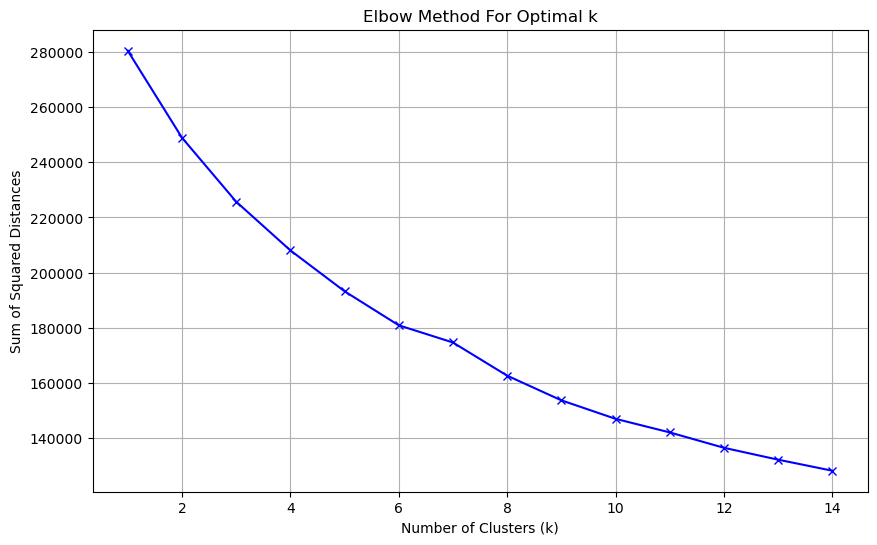

In [159]:
from sklearn.cluster import KMeans

ssd = []
K = range(1, 15)  # assuming we check for up to 15 clusters

for k in K:
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans = kmeans.fit(pca_result)
    ssd.append(kmeans.inertia_)

plt.figure(figsize=(10, 6))
plt.plot(K, ssd, 'bx-')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('Sum of Squared Distances')
plt.title('Elbow Method For Optimal k')
plt.grid(True)
plt.show()

In [160]:
n_clusters = 12  # Based on your code, you chose 12. But adjust this based on the elbow method results

kmeans = KMeans(n_clusters=n_clusters, random_state=42)
clusters = kmeans.fit_predict(pca_result)

C:\Users\euric\anaconda3\lib\site-packages\sklearn\manifold\_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
C:\Users\euric\anaconda3\lib\site-packages\sklearn\manifold\_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


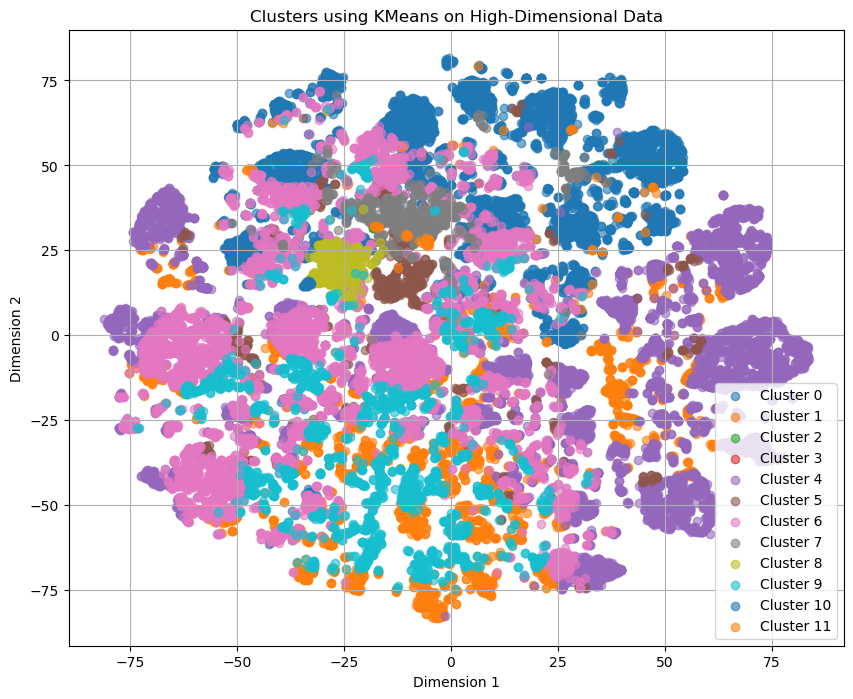

In [161]:
from sklearn.manifold import TSNE

# Now we'll use t-SNE to visualize the high-dimensional clustering results in 2D
tsne = TSNE(n_components=2, random_state=42)
tsne_result = tsne.fit_transform(pca_result)

tsne_result_df = pd.DataFrame(tsne_result, columns=["Dimension 1", "Dimension 2"])
tsne_result_df["Cluster"] = clusters

plt.figure(figsize=(10, 8))
for cluster_num in range(n_clusters):
    subset = tsne_result_df[tsne_result_df["Cluster"] == cluster_num]
    plt.scatter(subset["Dimension 1"], subset["Dimension 2"], label=f"Cluster {cluster_num}", alpha=0.6)

plt.xlabel("Dimension 1")
plt.ylabel("Dimension 2")
plt.title("Clusters using KMeans on High-Dimensional Data")
plt.grid(True)
plt.legend()
plt.show()

In [162]:
from sklearn.metrics import silhouette_score

score = silhouette_score(pca_result, clusters)

print(score)

0.11936547373582385


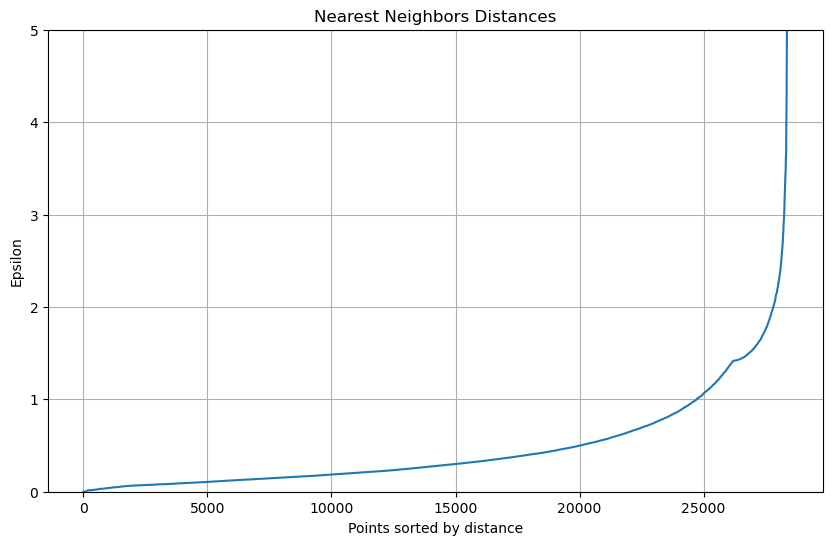

In [163]:
from sklearn.neighbors import NearestNeighbors

nearest_neighbors = NearestNeighbors(n_neighbors=2)
neighbors = nearest_neighbors.fit(merged_result_outliers_encoded)
distances, indices = neighbors.kneighbors(merged_result_outliers_encoded)
distances = np.sort(distances, axis=0)
distances = distances[:, 1]
plt.figure(figsize=(10, 6))
plt.plot(distances)
plt.ylim(0,5)
plt.xlabel('Points sorted by distance')
plt.ylabel('Epsilon')
plt.title('Nearest Neighbors Distances')
plt.grid(True)
plt.show()

In [164]:
from sklearn.cluster import DBSCAN

# Using DBSCAN on the original high-dimensional data
dbscan = DBSCAN(eps=1.4, min_samples=10)
dbscan_clusters = dbscan.fit_predict(merged_result_outliers_encoded)

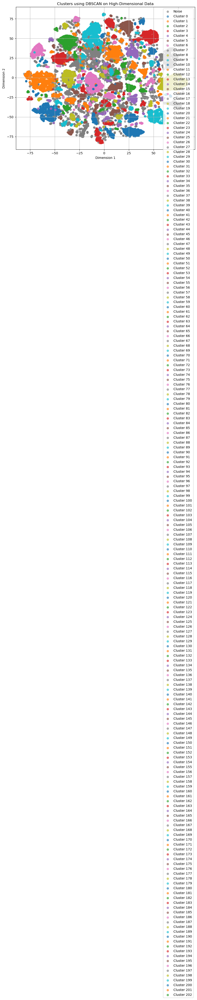

In [165]:
tsne_result_df["DBSCAN_Cluster"] = dbscan_clusters

plt.figure(figsize=(10, 8))
unique_clusters = np.unique(dbscan_clusters)

for cluster_num in unique_clusters:
    subset = tsne_result_df[tsne_result_df["DBSCAN_Cluster"] == cluster_num]
    if cluster_num == -1:
        # Noise points are usually represented with -1 in DBSCAN's output
        plt.scatter(subset["Dimension 1"], subset["Dimension 2"], label="Noise", alpha=0.6, color="gray")
    else:
        plt.scatter(subset["Dimension 1"], subset["Dimension 2"], label=f"Cluster {cluster_num}", alpha=0.6)

plt.xlabel("Dimension 1")
plt.ylabel("Dimension 2")
plt.title("Clusters using DBSCAN on High-Dimensional Data")
plt.grid(True)
plt.legend()
plt.show()

In [166]:
from sklearn.metrics import silhouette_score

# Since we've already computed the clustering above, no need to fit again
score = silhouette_score(merged_result_outliers_encoded, dbscan_clusters)

print(score)

0.11269611143943856


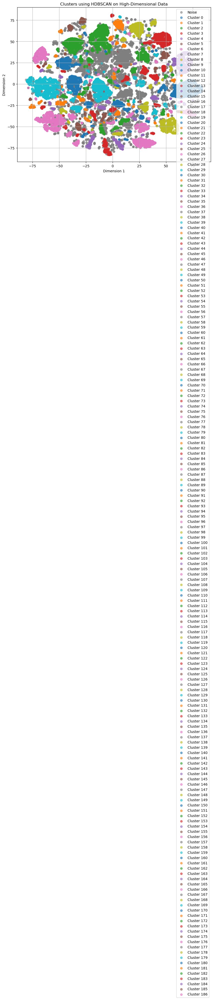

In [167]:
#!pip install hdbscan

# Importing the HDBSCAN library
import hdbscan

# Using HDBSCAN on the original high-dimensional data
# You've already specified min_samples. You might also consider adjusting min_cluster_size based on your data.
clusterer = hdbscan.HDBSCAN(min_samples=5, min_cluster_size=12, gen_min_span_tree=True)
hdbscan_clusters = clusterer.fit_predict(merged_result_outliers_encoded)

# Adding cluster information to our t-SNE result dataframe
tsne_result_df["HDBSCAN_Cluster"] = hdbscan_clusters

plt.figure(figsize=(10, 8))
unique_clusters = np.unique(hdbscan_clusters)

for cluster_num in unique_clusters:
    subset = tsne_result_df[tsne_result_df["HDBSCAN_Cluster"] == cluster_num]
    if cluster_num == -1:
        # Noise points are usually represented with -1 in HDBSCAN's output
        plt.scatter(subset["Dimension 1"], subset["Dimension 2"], label="Noise", alpha=0.6, color="gray")
    else:
        plt.scatter(subset["Dimension 1"], subset["Dimension 2"], label=f"Cluster {cluster_num}", alpha=0.6)

plt.xlabel("Dimension 1")
plt.ylabel("Dimension 2")
plt.title("Clusters using HDBSCAN on High-Dimensional Data")
plt.grid(True)
plt.legend()
plt.show()

In [168]:
from sklearn.metrics import silhouette_score

# Since we've already computed the clustering above, no need to fit again
score = silhouette_score(merged_result_outliers_encoded, hdbscan_clusters)

print(score)

0.09683903391928446


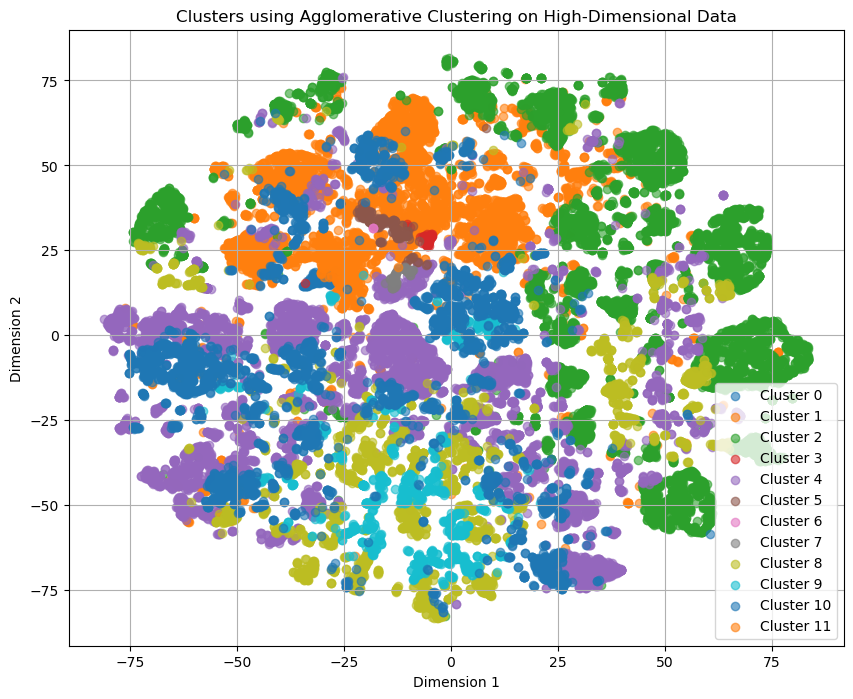

In [169]:
from sklearn.cluster import AgglomerativeClustering

# Using Agglomerative Clustering on the original high-dimensional data
agglo = AgglomerativeClustering(n_clusters=12)
agglo_clusters = agglo.fit_predict(merged_result_outliers_encoded)

# Adding cluster information to your t-SNE result dataframe
tsne_result_df["Agglo_Cluster"] = agglo_clusters

plt.figure(figsize=(10, 8))
unique_clusters = np.unique(agglo_clusters)

for cluster_num in unique_clusters:
    subset = tsne_result_df[tsne_result_df["Agglo_Cluster"] == cluster_num]
    plt.scatter(subset["Dimension 1"], subset["Dimension 2"], label=f"Cluster {cluster_num}", alpha=0.6)

plt.xlabel("Dimension 1")
plt.ylabel("Dimension 2")
plt.title("Clusters using Agglomerative Clustering on High-Dimensional Data")
plt.grid(True)
plt.legend()
plt.show()

In [170]:
from sklearn.metrics import silhouette_score

# Since we've already computed the clustering above, no need to fit again
score = silhouette_score(merged_result_outliers_encoded, agglo_clusters)

print(score)

0.072229419266808


## No Outliers

In [214]:
#REDO OF K-MEANS
from sklearn.decomposition import PCA

# We'll still use PCA to reduce dimensionality, but not too aggressively
# Let's say we reduce to 30 components
n_components_pca = 30
pca = PCA(n_components=n_components_pca)
pca_result = pca.fit_transform(merged_result_no_outliers_encoded)

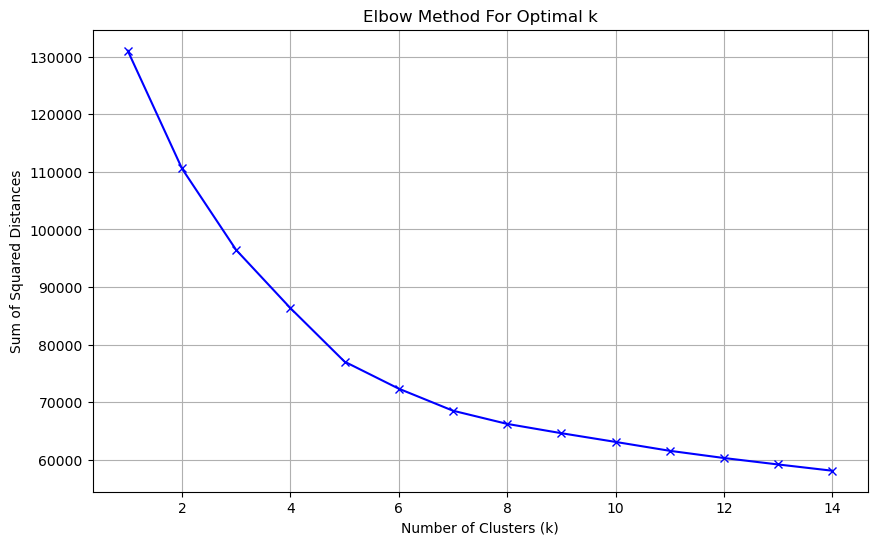

In [205]:
from sklearn.cluster import KMeans

ssd = []
K = range(1, 15)  # assuming we check for up to 15 clusters

for k in K:
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans = kmeans.fit(pca_result)
    ssd.append(kmeans.inertia_)

plt.figure(figsize=(10, 6))
plt.plot(K, ssd, 'bx-')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('Sum of Squared Distances')
plt.title('Elbow Method For Optimal k')
plt.grid(True)
plt.show()

In [215]:
n_clusters = 8

kmeans = KMeans(n_clusters=n_clusters, random_state=42)
clusters = kmeans.fit_predict(pca_result)

merged_result_no_outliers_encoded_kmeans = merged_result_no_outliers_encoded.copy(deep=True)
merged_result_no_outliers_encoded_kmeans["Cluster"] = clusters

merged_result_no_outliers_encoded_kmeans["Cluster"].nunique()

8

C:\Users\euric\anaconda3\lib\site-packages\sklearn\manifold\_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
C:\Users\euric\anaconda3\lib\site-packages\sklearn\manifold\_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


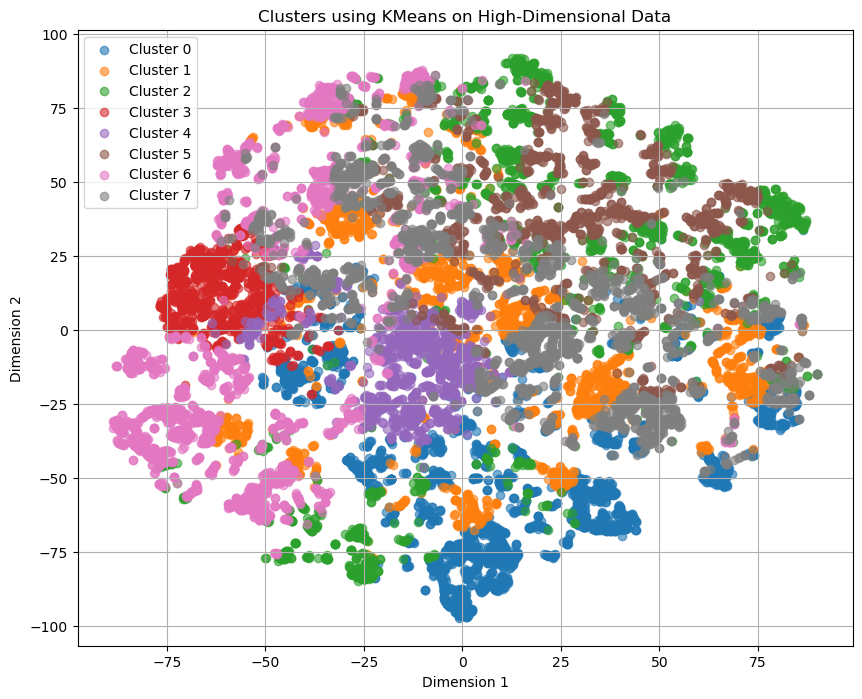

In [202]:
from sklearn.manifold import TSNE

# Now we'll use t-SNE to visualize the high-dimensional clustering results in 2D
tsne = TSNE(n_components=2, random_state=42)
tsne_result = tsne.fit_transform(pca_result)

tsne_result_df = pd.DataFrame(tsne_result, columns=["Dimension 1", "Dimension 2"])
tsne_result_df["Cluster"] = clusters

plt.figure(figsize=(10, 8))
for cluster_num in range(n_clusters):
    subset = tsne_result_df[tsne_result_df["Cluster"] == cluster_num]
    plt.scatter(subset["Dimension 1"], subset["Dimension 2"], label=f"Cluster {cluster_num}", alpha=0.6)

plt.xlabel("Dimension 1")
plt.ylabel("Dimension 2")
plt.title("Clusters using KMeans on High-Dimensional Data")
plt.grid(True)
plt.legend()
plt.show()

In [203]:
from sklearn.metrics import silhouette_score

score = silhouette_score(pca_result, clusters)

print(score)

0.13641049257910634


In [180]:
from sklearn.cluster import DBSCAN

# Using DBSCAN on the original high-dimensional data
dbscan = DBSCAN(eps=1.4, min_samples=10)
dbscan_clusters = dbscan.fit_predict(merged_result_no_outliers_encoded)

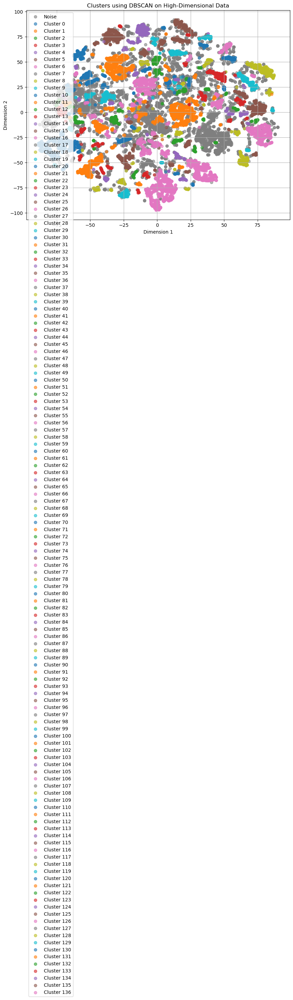

In [181]:
tsne_result_df["DBSCAN_Cluster"] = dbscan_clusters

plt.figure(figsize=(10, 8))
unique_clusters = np.unique(dbscan_clusters)

for cluster_num in unique_clusters:
    subset = tsne_result_df[tsne_result_df["DBSCAN_Cluster"] == cluster_num]
    if cluster_num == -1:
        # Noise points are usually represented with -1 in DBSCAN's output
        plt.scatter(subset["Dimension 1"], subset["Dimension 2"], label="Noise", alpha=0.6, color="gray")
    else:
        plt.scatter(subset["Dimension 1"], subset["Dimension 2"], label=f"Cluster {cluster_num}", alpha=0.6)

plt.xlabel("Dimension 1")
plt.ylabel("Dimension 2")
plt.title("Clusters using DBSCAN on High-Dimensional Data")
plt.grid(True)
plt.legend()
plt.show()

In [182]:
from sklearn.metrics import silhouette_score

# Since we've already computed the clustering above, no need to fit again
score = silhouette_score(merged_result_no_outliers_encoded, dbscan_clusters)

print(score)

-0.005447993987593969


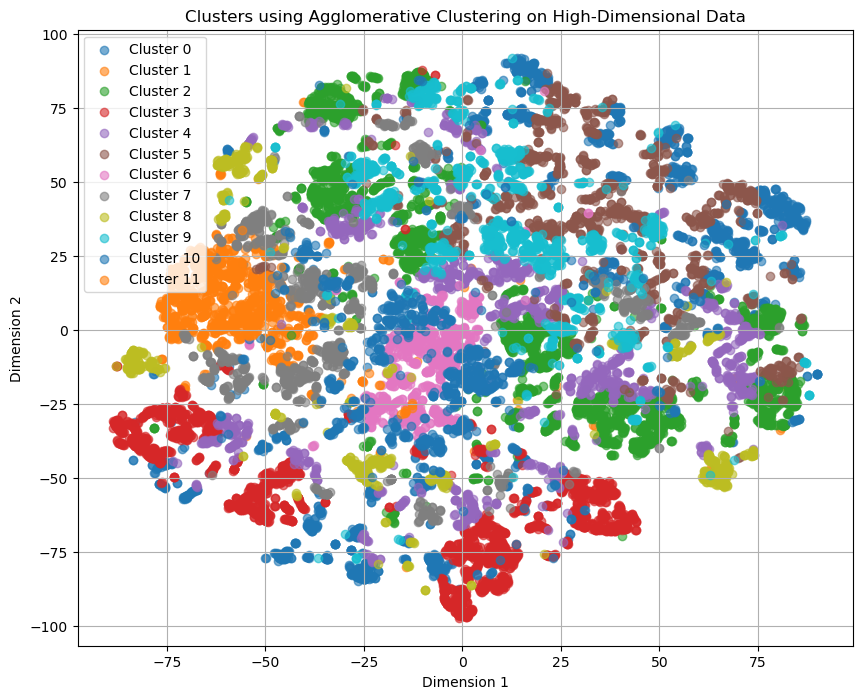

In [183]:
from sklearn.cluster import AgglomerativeClustering

# Using Agglomerative Clustering on the original high-dimensional data
agglo = AgglomerativeClustering(n_clusters=12)
agglo_clusters = agglo.fit_predict(merged_result_no_outliers_encoded)

# Adding cluster information to your t-SNE result dataframe
tsne_result_df["Agglo_Cluster"] = agglo_clusters

plt.figure(figsize=(10, 8))
unique_clusters = np.unique(agglo_clusters)

for cluster_num in unique_clusters:
    subset = tsne_result_df[tsne_result_df["Agglo_Cluster"] == cluster_num]
    plt.scatter(subset["Dimension 1"], subset["Dimension 2"], label=f"Cluster {cluster_num}", alpha=0.6)

plt.xlabel("Dimension 1")
plt.ylabel("Dimension 2")
plt.title("Clusters using Agglomerative Clustering on High-Dimensional Data")
plt.grid(True)
plt.legend()
plt.show()

In [184]:
from sklearn.metrics import silhouette_score

# Since we've already computed the clustering above, no need to fit again
score = silhouette_score(merged_result_no_outliers_encoded, agglo_clusters)

print(score)

0.07455004351674485


## Outliers ONLY

In [185]:
merged_result_outliers_only_encoded = merged_result_outliers_encoded.drop(index=merged_result_no_outliers_encoded.index, errors='ignore')

# Removing columns that only contain 0 as all values
cols_to_drop = merged_result_outliers_only_encoded.columns[(merged_result_outliers_only_encoded == 0).all()]
merged_result_outliers_only_encoded = merged_result_outliers_only_encoded.drop(columns=cols_to_drop)
merged_result_outliers_only_encoded

,C_TXNS_SUM,D_TXNS_SUM,DIG_TXNS_SUM,IN_INSTA_TXNS_SUM,OUT_INSTA_TXNS_SUM,AGE,TENURE,EDUCATION_HIGH,EDUCATION_LOW,EDUCATION_MID,...,INCOME_SOURCE_SALARY,GENDER_FEMALE,GENDER_MALE,GENDER_OTHERS,MARITAL_STATUS_DIVORCED,MARITAL_STATUS_MARRIED,MARITAL_STATUS_OTHERS,MARITAL_STATUS_SEPARATED,MARITAL_STATUS_SINGLE,MARITAL_STATUS_WIDOWED
CUST_NUM,,,,,,,,,,,,,,,,,,,,,
11712.654012,-0.143597,-0.280033,0.573773,-0.077017,0.352124,-1.298492,-0.798373,0,0,0,...,0,0,1,0,0,0,0,0,1,0
2416.837603,-0.143597,-0.542276,-0.213069,-0.215936,0.374608,-1.102641,-1.116918,0,0,0,...,1,1,0,0,0,0,0,0,1,0
3014.807457,-0.143597,0.104331,0.036864,0.035106,-0.064248,-1.102641,-0.893937,0,0,0,...,1,1,0,0,0,0,0,0,1,0
4847.993812,-0.143597,-0.284001,-0.120884,0.001509,0.401903,-1.167924,-0.607247,0,0,0,...,0,1,0,0,0,0,0,0,1,0
5139.472930,-0.143597,-0.343802,0.626986,-0.077272,-0.187130,-1.167924,0.029842,0,1,0,...,1,1,0,0,0,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12538.757674,-0.143597,-0.302721,-0.213069,-0.200032,-0.089604,-0.841506,-0.495756,0,0,0,...,1,1,0,0,0,1,0,0,0,0
12779.612044,-0.143597,1.744438,-0.213069,0.240160,-0.187130,0.203034,-0.973573,0,0,0,...,1,1,0,0,0,0,0,0,1,0
13671.029369,0.306182,0.779553,1.271012,0.473206,0.515068,-0.384520,-0.623174,0,0,0,...,1,1,0,0,0,1,0,0,0,0


In [207]:
#REDO OF K-MEANS
from sklearn.decomposition import PCA

# We'll still use PCA to reduce dimensionality, but not too aggressively
# Let's say we reduce to 30 components
n_components_pca = 30
pca = PCA(n_components=n_components_pca)
pca_result = pca.fit_transform(merged_result_outliers_only_encoded)

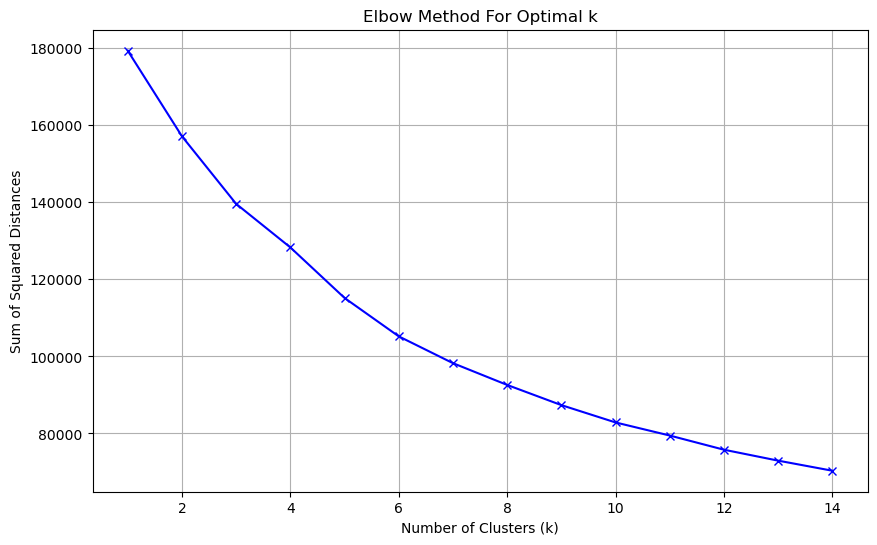

In [195]:
from sklearn.cluster import KMeans

ssd = []
K = range(1, 15)  # assuming we check for up to 15 clusters

for k in K:
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans = kmeans.fit(pca_result)
    ssd.append(kmeans.inertia_)

plt.figure(figsize=(10, 6))
plt.plot(K, ssd, 'bx-')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('Sum of Squared Distances')
plt.title('Elbow Method For Optimal k')
plt.grid(True)
plt.show()

In [212]:
n_clusters = 10

kmeans = KMeans(n_clusters=n_clusters, random_state=42)
clusters = kmeans.fit_predict(pca_result)

merged_result_outliers_only_encoded_kmeans = merged_result_outliers_only_encoded.copy(deep=True)
merged_result_outliers_only_encoded_kmeans["Cluster"] = clusters

merged_result_outliers_only_encoded_kmeans["Cluster"].nunique()

10

C:\Users\euric\anaconda3\lib\site-packages\sklearn\manifold\_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
C:\Users\euric\anaconda3\lib\site-packages\sklearn\manifold\_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


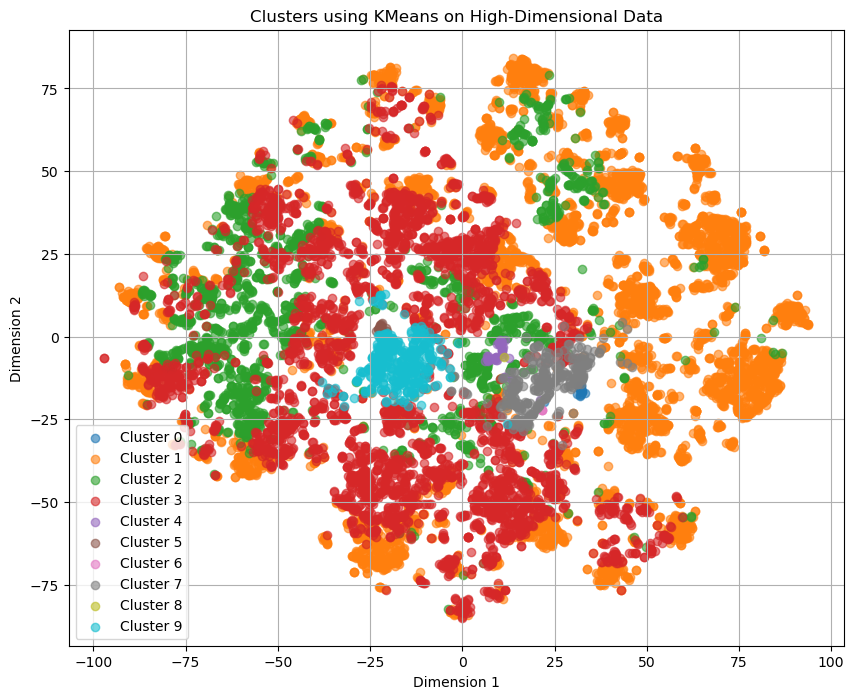

In [197]:
from sklearn.manifold import TSNE

# Now we'll use t-SNE to visualize the high-dimensional clustering results in 2D
tsne = TSNE(n_components=2, random_state=42)
tsne_result = tsne.fit_transform(pca_result)

tsne_result_df = pd.DataFrame(tsne_result, columns=["Dimension 1", "Dimension 2"])
tsne_result_df["Cluster"] = clusters

plt.figure(figsize=(10, 8))
for cluster_num in range(n_clusters):
    subset = tsne_result_df[tsne_result_df["Cluster"] == cluster_num]
    plt.scatter(subset["Dimension 1"], subset["Dimension 2"], label=f"Cluster {cluster_num}", alpha=0.6)

plt.xlabel("Dimension 1")
plt.ylabel("Dimension 2")
plt.title("Clusters using KMeans on High-Dimensional Data")
plt.grid(True)
plt.legend()
plt.show()

In [198]:
from sklearn.metrics import silhouette_score

score = silhouette_score(pca_result, clusters)

print(score)

0.12638737678462156


In [190]:
from sklearn.cluster import DBSCAN

# Using DBSCAN on the original high-dimensional data
dbscan = DBSCAN(eps=1.4, min_samples=10)
dbscan_clusters = dbscan.fit_predict(merged_result_outliers_only_encoded)

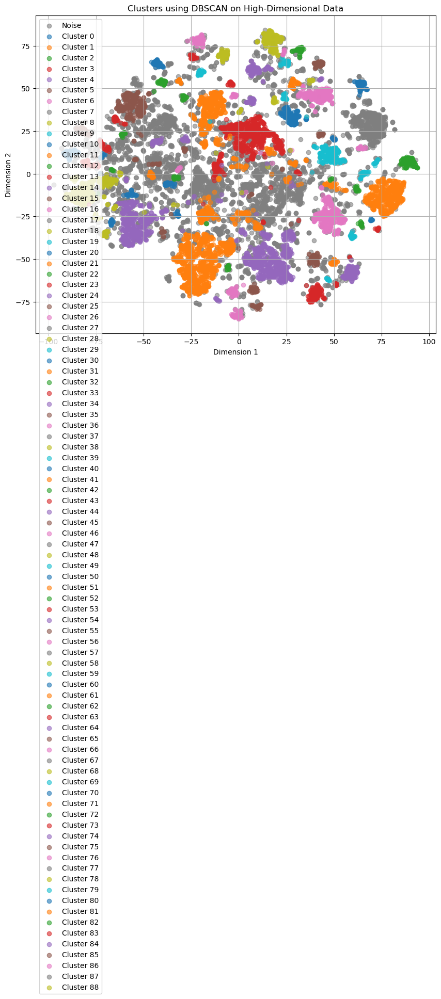

In [191]:
tsne_result_df["DBSCAN_Cluster"] = dbscan_clusters

plt.figure(figsize=(10, 8))
unique_clusters = np.unique(dbscan_clusters)

for cluster_num in unique_clusters:
    subset = tsne_result_df[tsne_result_df["DBSCAN_Cluster"] == cluster_num]
    if cluster_num == -1:
        # Noise points are usually represented with -1 in DBSCAN's output
        plt.scatter(subset["Dimension 1"], subset["Dimension 2"], label="Noise", alpha=0.6, color="gray")
    else:
        plt.scatter(subset["Dimension 1"], subset["Dimension 2"], label=f"Cluster {cluster_num}", alpha=0.6)

plt.xlabel("Dimension 1")
plt.ylabel("Dimension 2")
plt.title("Clusters using DBSCAN on High-Dimensional Data")
plt.grid(True)
plt.legend()
plt.show()

In [192]:
from sklearn.metrics import silhouette_score

# Since we've already computed the clustering above, no need to fit again
score = silhouette_score(merged_result_outliers_only_encoded, dbscan_clusters)

print(score)

-0.006403631084300608


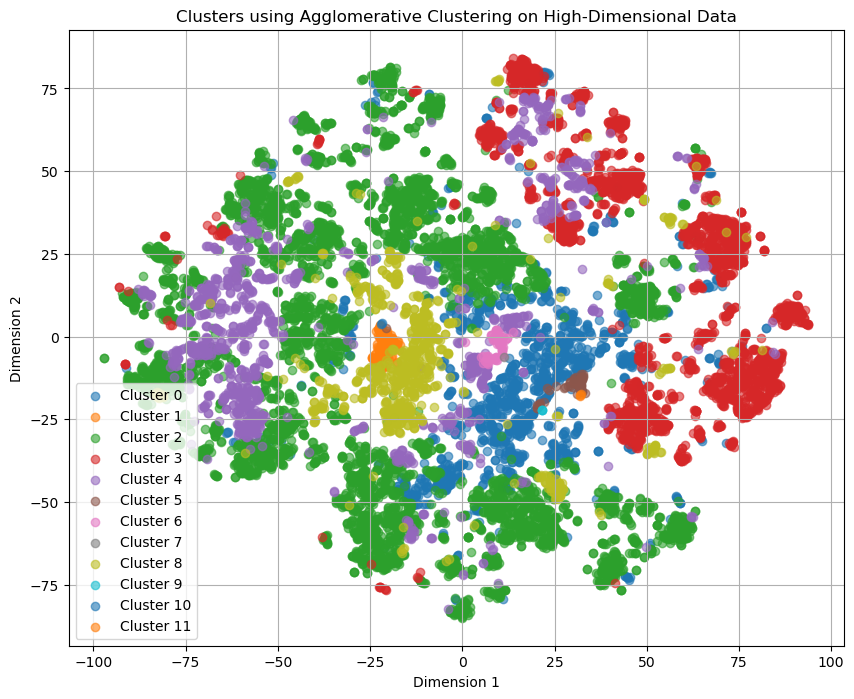

In [193]:
from sklearn.cluster import AgglomerativeClustering

# Using Agglomerative Clustering on the original high-dimensional data
agglo = AgglomerativeClustering(n_clusters=12)
agglo_clusters = agglo.fit_predict(merged_result_outliers_only_encoded)

# Adding cluster information to your t-SNE result dataframe
tsne_result_df["Agglo_Cluster"] = agglo_clusters

plt.figure(figsize=(10, 8))
unique_clusters = np.unique(agglo_clusters)

for cluster_num in unique_clusters:
    subset = tsne_result_df[tsne_result_df["Agglo_Cluster"] == cluster_num]
    plt.scatter(subset["Dimension 1"], subset["Dimension 2"], label=f"Cluster {cluster_num}", alpha=0.6)

plt.xlabel("Dimension 1")
plt.ylabel("Dimension 2")
plt.title("Clusters using Agglomerative Clustering on High-Dimensional Data")
plt.grid(True)
plt.legend()
plt.show()

In [194]:
from sklearn.metrics import silhouette_score

# Since we've already computed the clustering above, no need to fit again
score = silhouette_score(merged_result_outliers_only_encoded, agglo_clusters)

print(score)

0.060572117101069876


# Final Data Frame with Clusters

In [237]:
obj1 = merged_result_outliers_only_encoded_kmeans['Cluster']
obj1

CUST_NUM
11712.654012    1
2416.837603     1
3014.807457     1
4847.993812     1
5139.472930     1
               ..
12538.757674    1
12779.612044    2
13671.029369    1
11266.634103    1
8992.043372     2
Name: Cluster, Length: 11603, dtype: int32

In [238]:
obj2 = merged_result_no_outliers_encoded_kmeans['Cluster'] + 10 #Since there are 10 clusters in obj1 already
obj2

CUST_NUM
921.989154      16
1119.634762     16
1709.755538     10
1964.683690     16
2144.071827     16
                ..
13806.610156    16
13858.741068    14
13908.768601    14
14060.827927    17
11776.173572    13
Name: Cluster, Length: 16797, dtype: int32

In [239]:
obj = pd.concat([obj1,obj2])
obj.nunique()

18

In [240]:
merged_sum2 = merged_sum.join(merged_sum_copy, how = "inner").fillna(merged_result_outliers.mean())
merged_sum2

C:\Users\euric\AppData\Local\Temp\ipykernel_10384\2420600877.py:1: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  merged_sum2 = merged_sum.join(merged_sum_copy, how = "inner").fillna(merged_result_outliers.mean())


,C_TXNS_SUM,D_TXNS_SUM,DIG_TXNS_SUM,IN_INSTA_TXNS_SUM,OUT_INSTA_TXNS_SUM,EDUCATION,AGE,TENURE,BUSINESS_OWNER,DIGITAL_FLAG,INCOME_SOURCE,GENDER,MARITAL_STATUS
CUST_NUM,,,,,,,,,,,,,
11712.654012,0.0,20390.258341,76823.021158,13095.957256,27643.975823,NO_DATA,20.0,1.833333,N,DIGITAL,ALLOWANCE,MALE,SINGLE
921.989154,0.0,32302.648762,5146.924018,13396.837358,0.000000,NO_DATA,23.0,2.000000,N,TRADITIONAL,ALLOWANCE,MALE,SINGLE
1119.634762,0.0,2.925549,0.000000,0.000000,0.000000,LOW,13.0,5.583333,N,TRADITIONAL,ALLOWANCE,MALE,SINGLE
1709.755538,0.0,12178.902578,3466.929487,15546.981865,0.000000,NO_DATA,20.0,1.250000,N,DIGITAL,SALARY,FEMALE,SINGLE
1964.683690,0.0,10713.303471,0.000000,11195.112750,0.000000,LOW,22.0,5.333333,N,TRADITIONAL,ALLOWANCE,MALE,SINGLE
...,...,...,...,...,...,...,...,...,...,...,...,...,...
13908.768601,0.0,41543.846981,0.000000,16993.715118,0.000000,NO_DATA,54.0,2.083333,N,TRADITIONAL,SALARY,FEMALE,MARRIED
14060.827927,0.0,0.000000,0.000000,8399.157542,0.000000,MID,34.0,9.916667,N,TRADITIONAL,SALARY,MALE,SINGLE
11266.634103,0.0,0.000000,9799.940690,0.000000,168147.211967,NO_DATA,30.0,2.750000,N,DIGITAL,SALARY,FEMALE,MARRIED


In [241]:
merged_sum2['Cluster'] = obj
merged_sum2

,C_TXNS_SUM,D_TXNS_SUM,DIG_TXNS_SUM,IN_INSTA_TXNS_SUM,OUT_INSTA_TXNS_SUM,EDUCATION,AGE,TENURE,BUSINESS_OWNER,DIGITAL_FLAG,INCOME_SOURCE,GENDER,MARITAL_STATUS,Cluster
CUST_NUM,,,,,,,,,,,,,,
11712.654012,0.0,20390.258341,76823.021158,13095.957256,27643.975823,NO_DATA,20.0,1.833333,N,DIGITAL,ALLOWANCE,MALE,SINGLE,1
921.989154,0.0,32302.648762,5146.924018,13396.837358,0.000000,NO_DATA,23.0,2.000000,N,TRADITIONAL,ALLOWANCE,MALE,SINGLE,16
1119.634762,0.0,2.925549,0.000000,0.000000,0.000000,LOW,13.0,5.583333,N,TRADITIONAL,ALLOWANCE,MALE,SINGLE,16
1709.755538,0.0,12178.902578,3466.929487,15546.981865,0.000000,NO_DATA,20.0,1.250000,N,DIGITAL,SALARY,FEMALE,SINGLE,10
1964.683690,0.0,10713.303471,0.000000,11195.112750,0.000000,LOW,22.0,5.333333,N,TRADITIONAL,ALLOWANCE,MALE,SINGLE,16
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13908.768601,0.0,41543.846981,0.000000,16993.715118,0.000000,NO_DATA,54.0,2.083333,N,TRADITIONAL,SALARY,FEMALE,MARRIED,14
14060.827927,0.0,0.000000,0.000000,8399.157542,0.000000,MID,34.0,9.916667,N,TRADITIONAL,SALARY,MALE,SINGLE,17
11266.634103,0.0,0.000000,9799.940690,0.000000,168147.211967,NO_DATA,30.0,2.750000,N,DIGITAL,SALARY,FEMALE,MARRIED,1


In [242]:
#merged_sum2.to_excel("merged_sum2.xlsx", index=True)

In [243]:
clusters = []
for i in range(18):
    cluster_i = merged_sum2[merged_sum2["Cluster"] == i]
    clusters.append(cluster_i)

clusters[1].head()

,C_TXNS_SUM,D_TXNS_SUM,DIG_TXNS_SUM,IN_INSTA_TXNS_SUM,OUT_INSTA_TXNS_SUM,EDUCATION,AGE,TENURE,BUSINESS_OWNER,DIGITAL_FLAG,INCOME_SOURCE,GENDER,MARITAL_STATUS,Cluster
CUST_NUM,,,,,,,,,,,,,,
11712.654012,0.0,20390.258341,76823.021158,13095.957256,27643.975823,NO_DATA,20.0,1.833333,N,DIGITAL,ALLOWANCE,MALE,SINGLE,1
2416.837603,0.0,0.000000,0.000000,0.000000,28796.599409,NO_DATA,23.0,0.166667,N,DIGITAL,SALARY,FEMALE,SINGLE,1
3014.807457,0.0,50275.780595,24402.131714,23665.813668,6299.363864,NO_DATA,23.0,1.333333,N,DIGITAL,SALARY,FEMALE,SINGLE,1
4847.993812,0.0,20081.686944,9000.396213,20498.565861,30195.860792,NO_DATA,22.0,2.833333,N,DIGITAL,ALLOWANCE,FEMALE,SINGLE,1
5139.472930,0.0,15431.962649,82018.474581,13071.889402,0.000000,LOW,22.0,6.166667,N,DIGITAL,SALARY,FEMALE,SINGLE,1


Cluster 0:
COUNT: 20


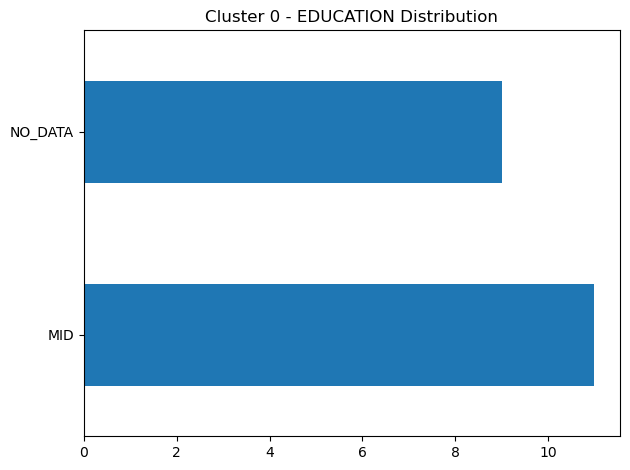

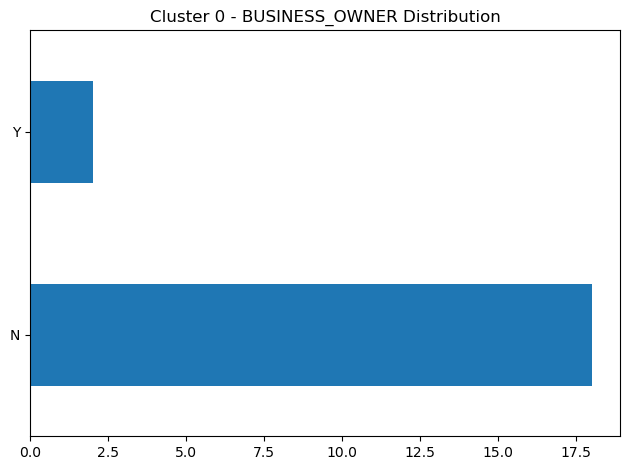

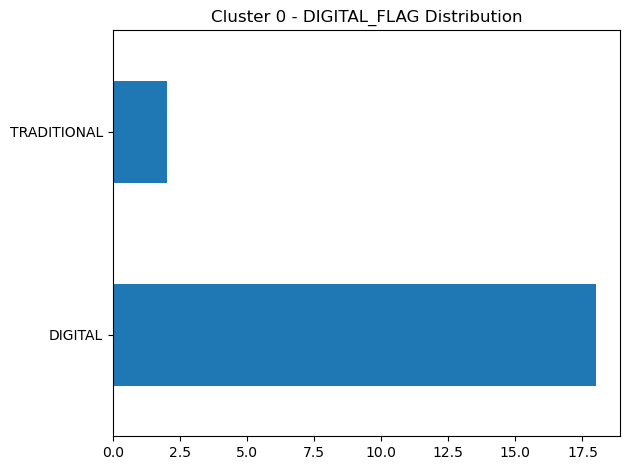

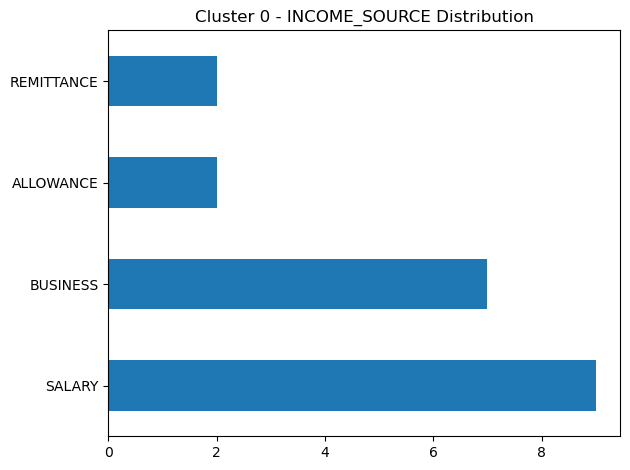

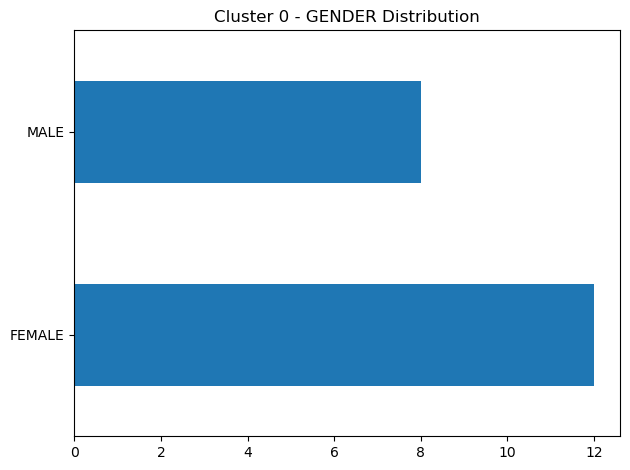

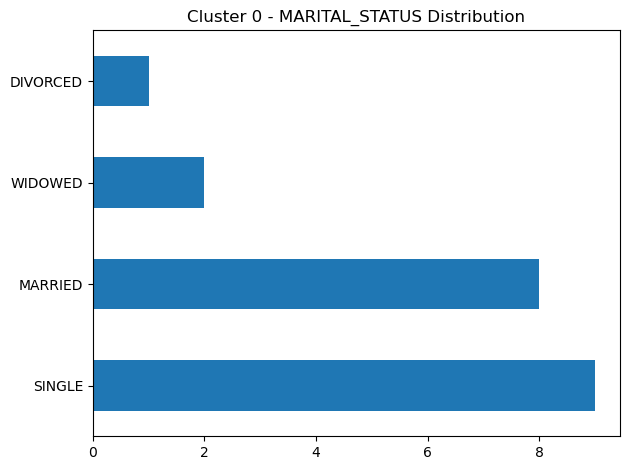

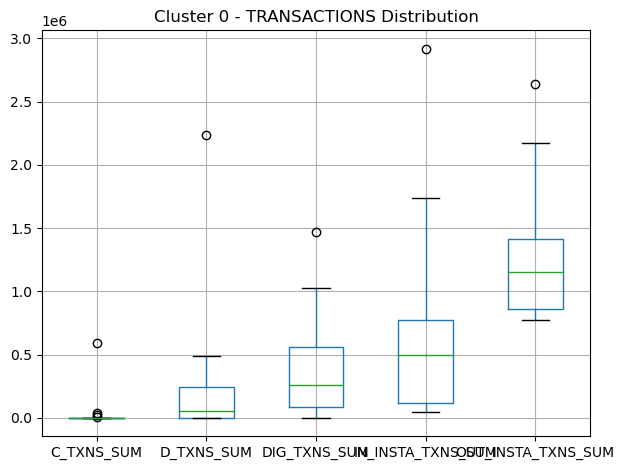

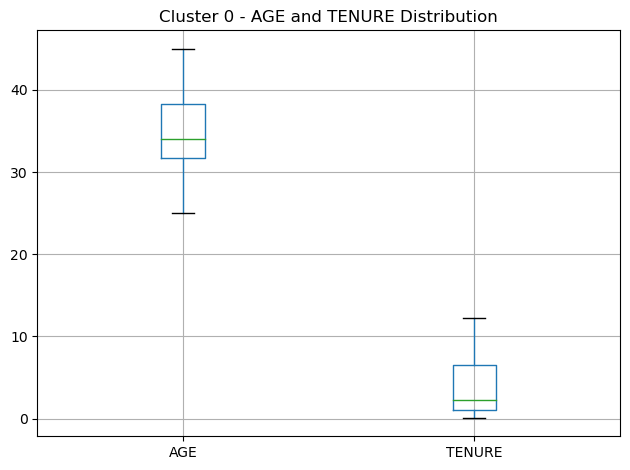

Cluster 1:
COUNT: 5193


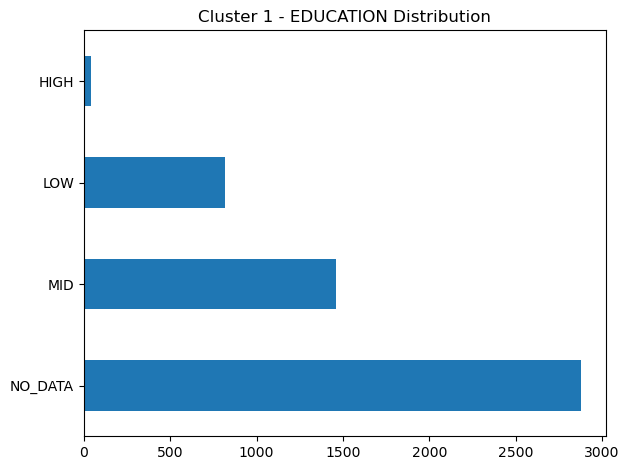

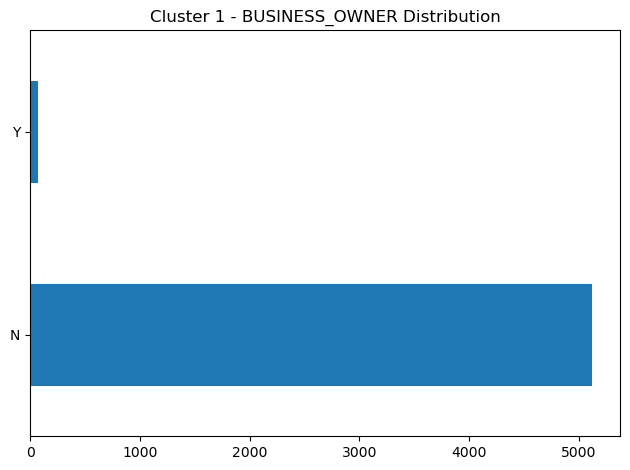

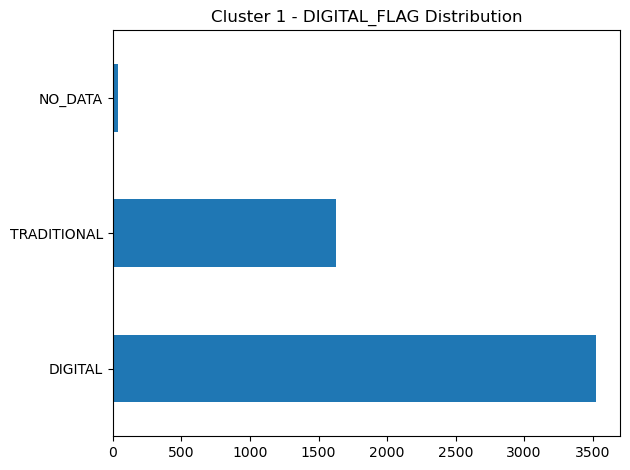

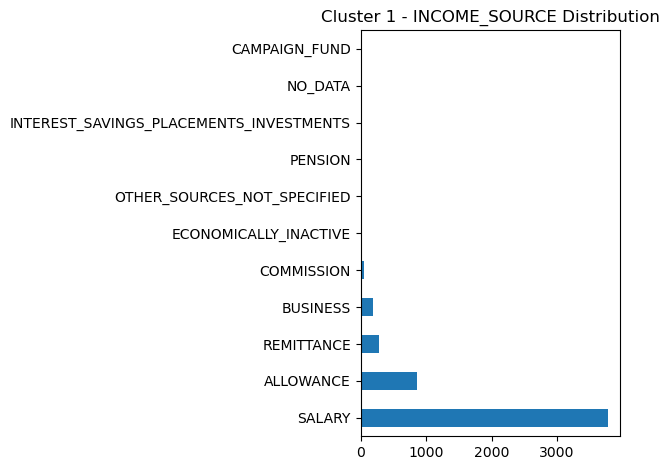

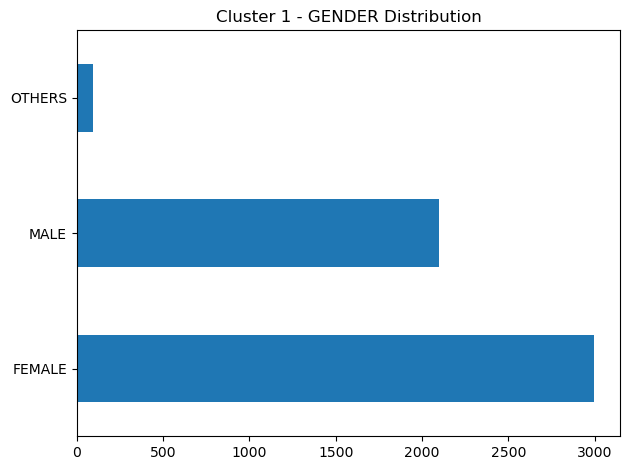

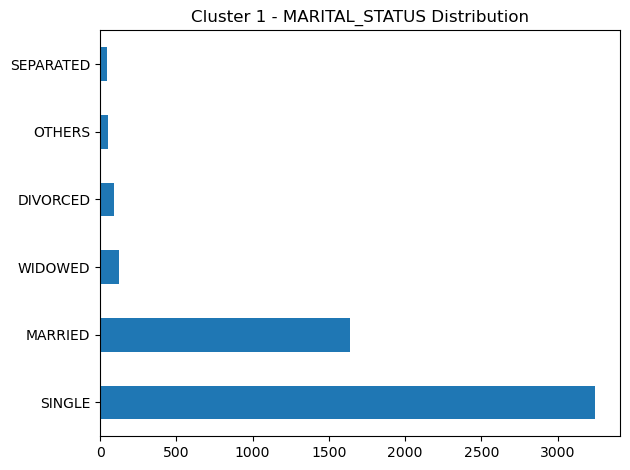

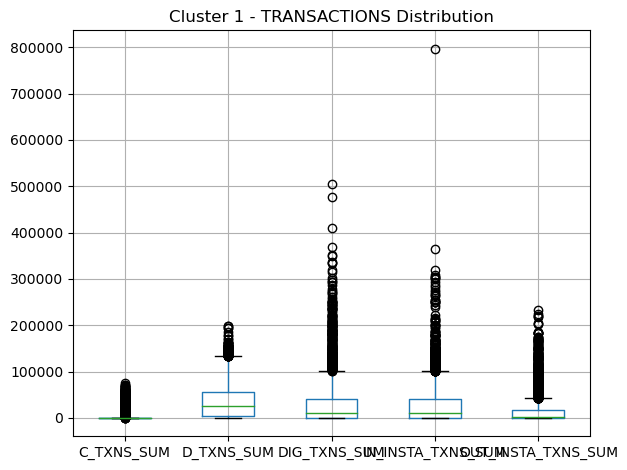

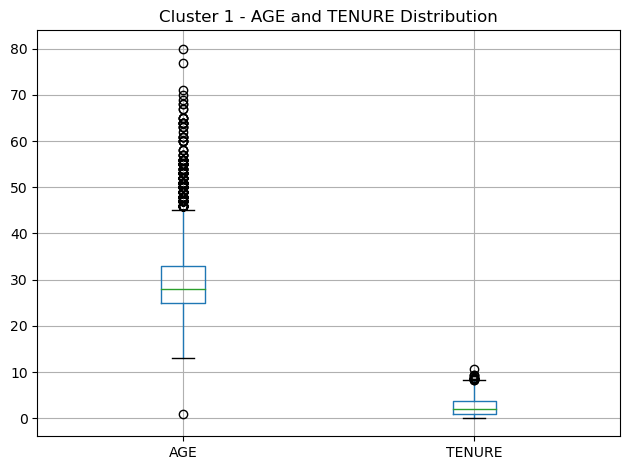

Cluster 2:
COUNT: 1778


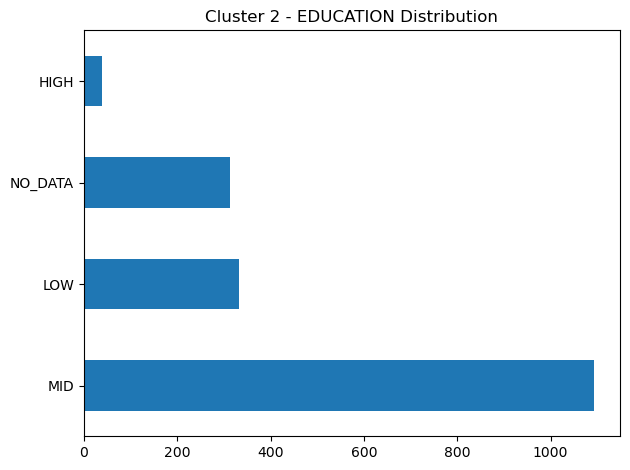

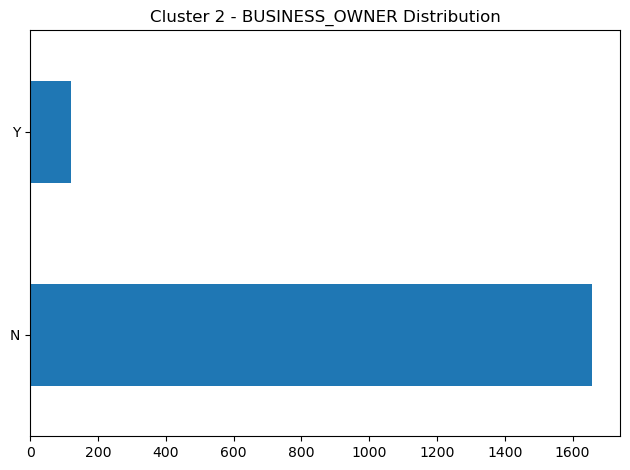

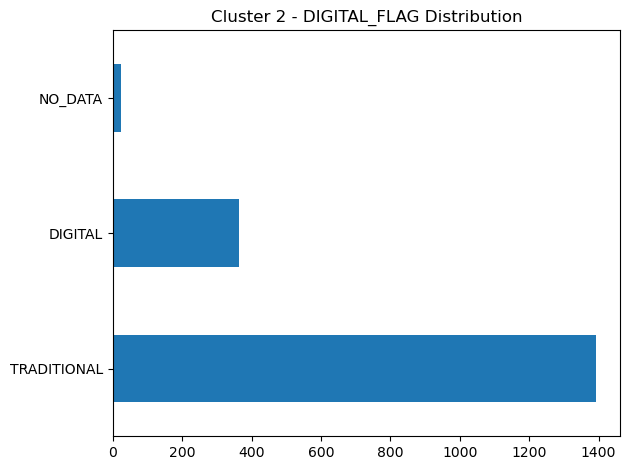

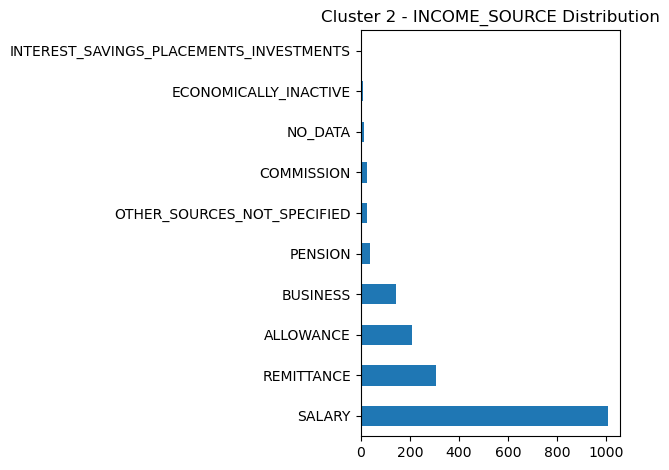

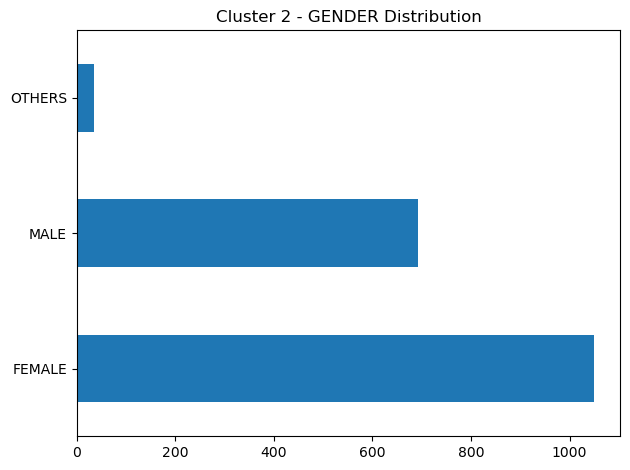

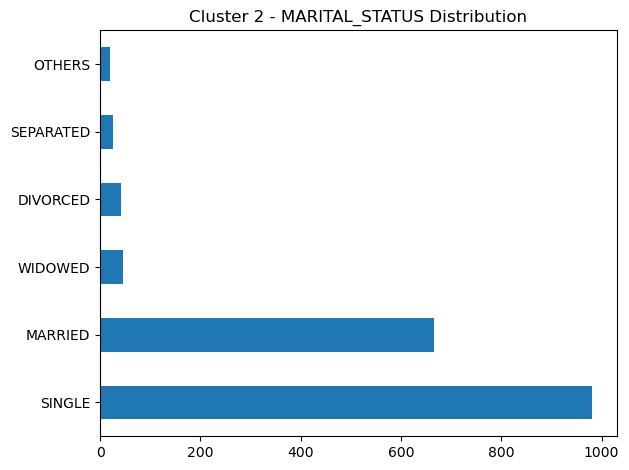

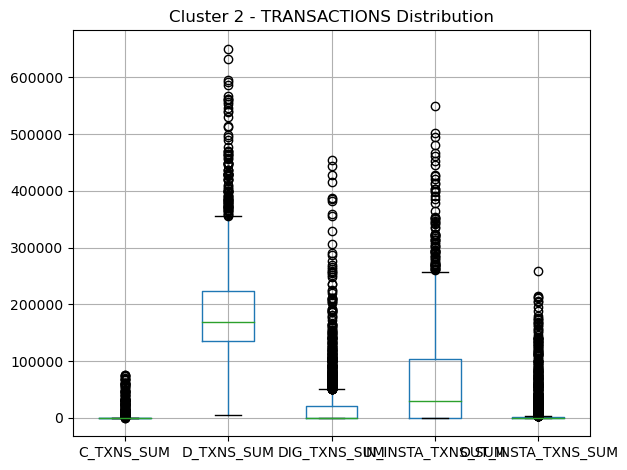

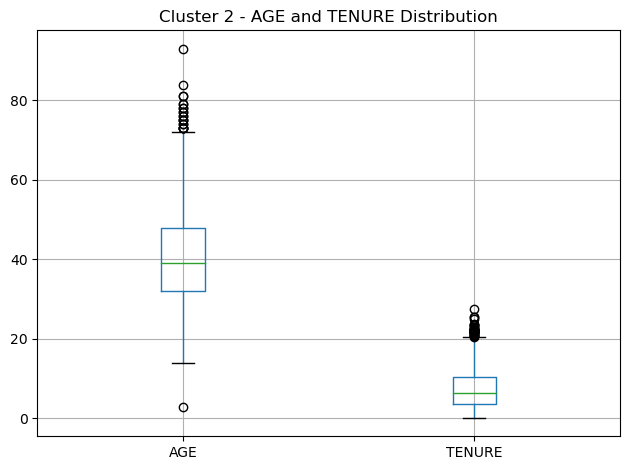

Cluster 3:
COUNT: 3824


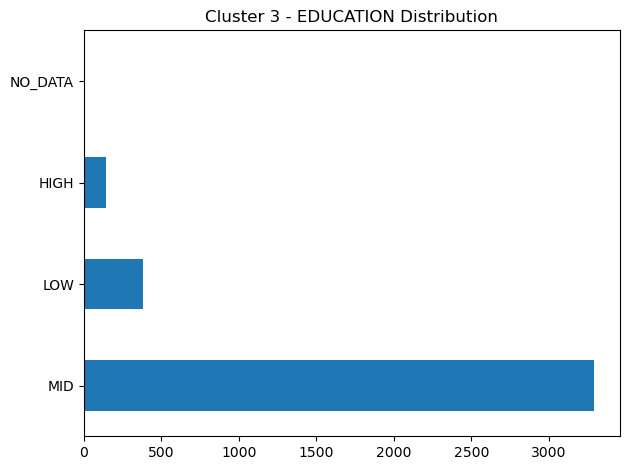

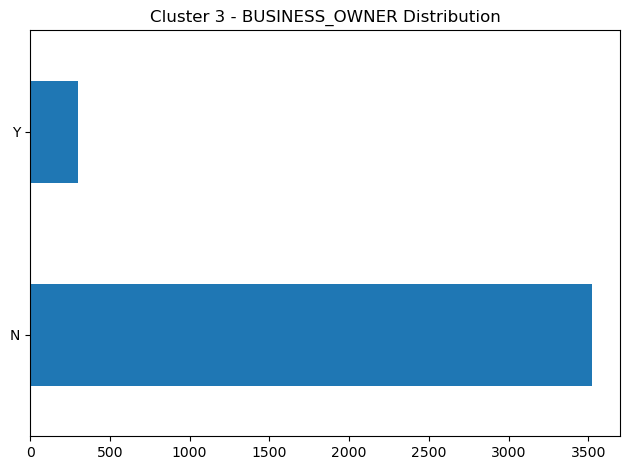

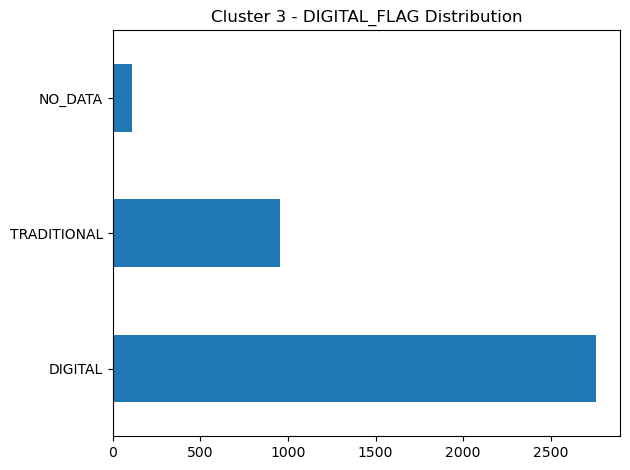

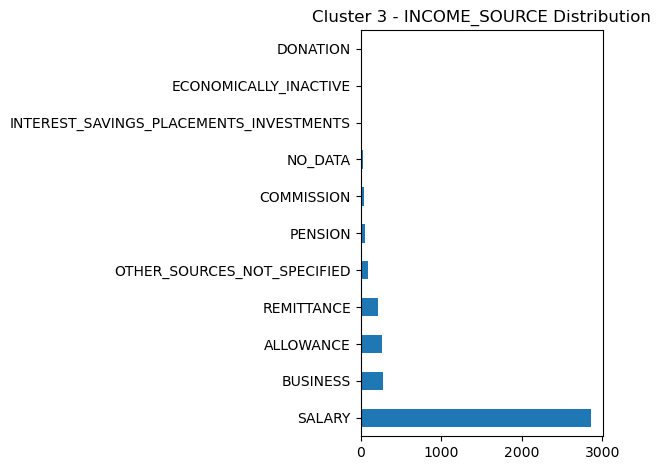

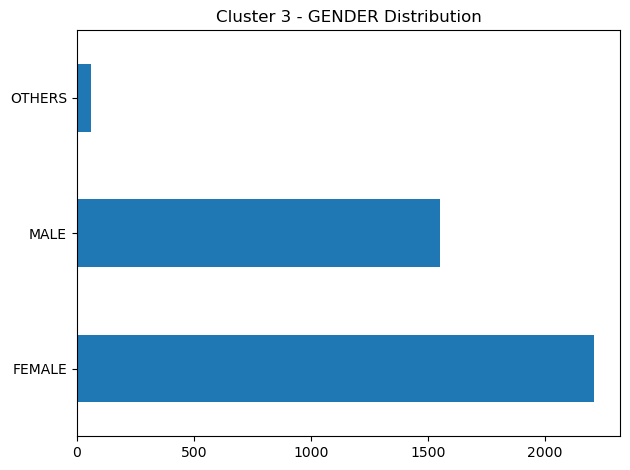

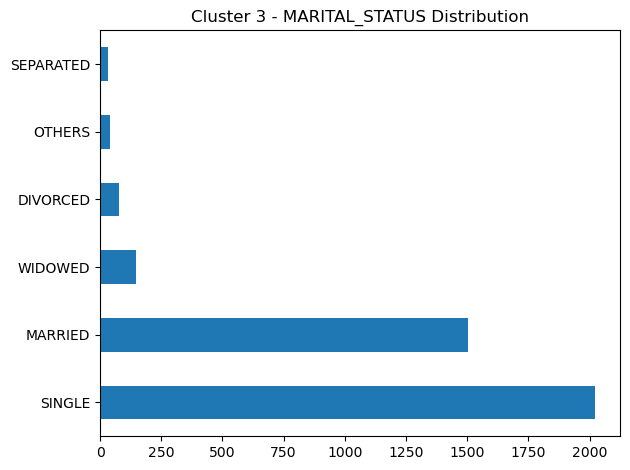

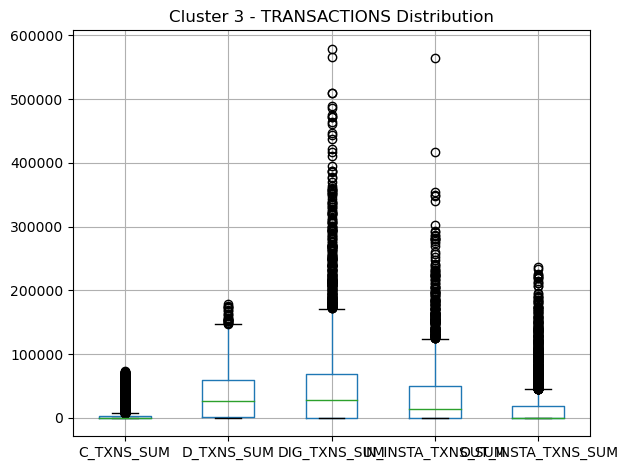

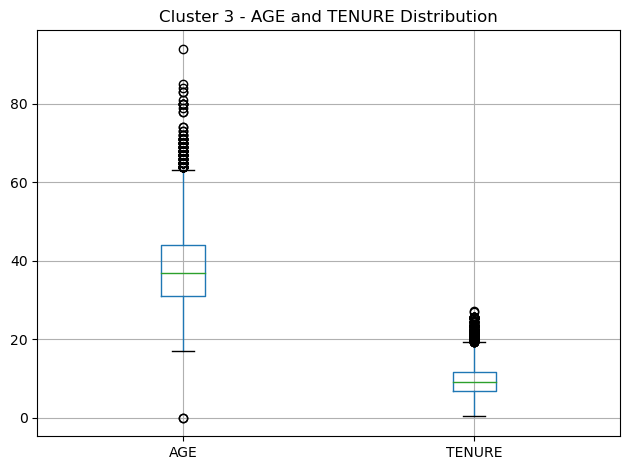

Cluster 4:
COUNT: 47


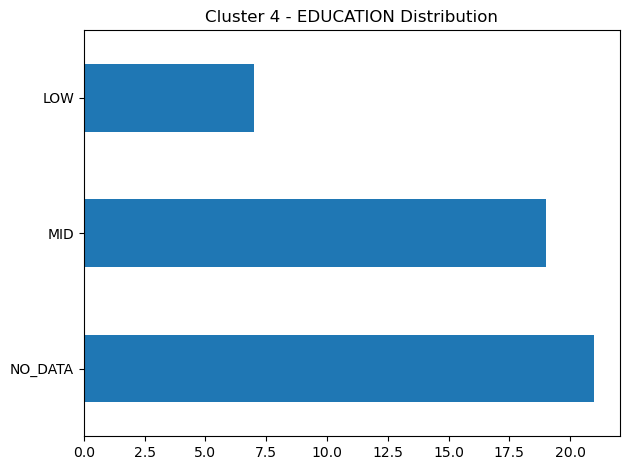

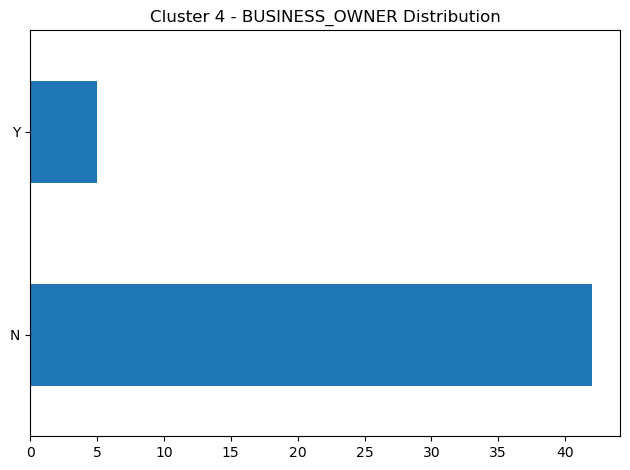

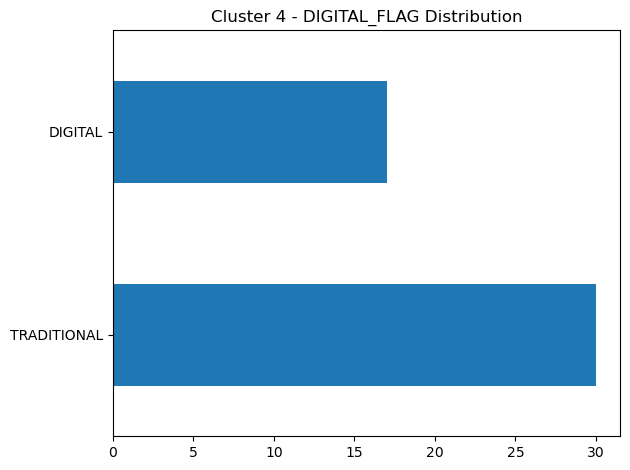

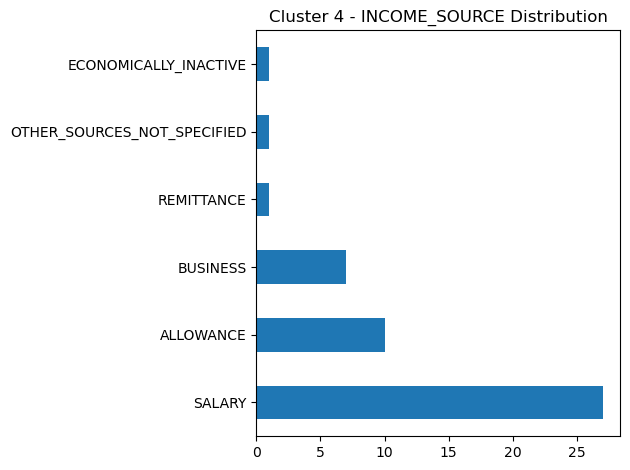

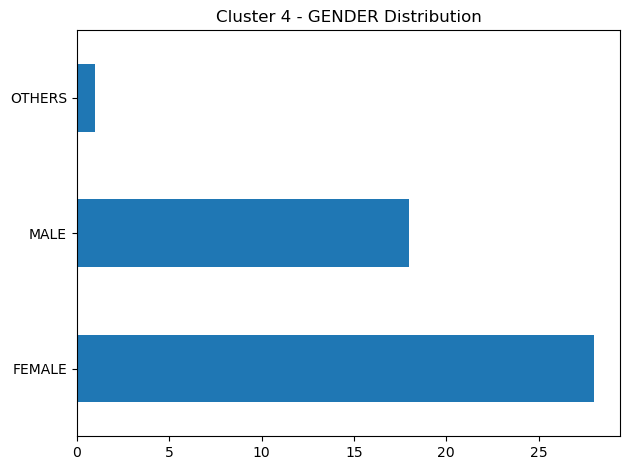

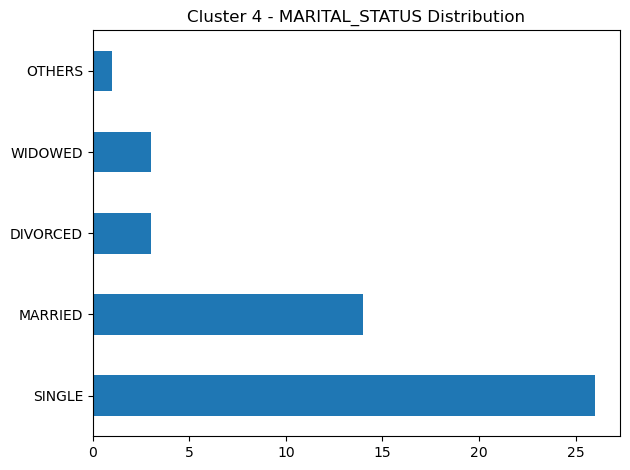

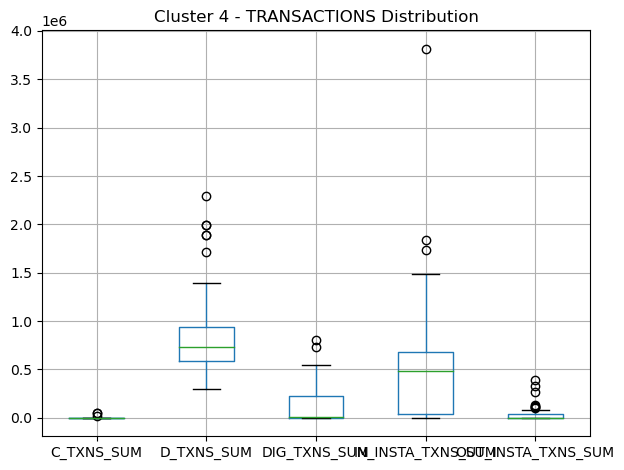

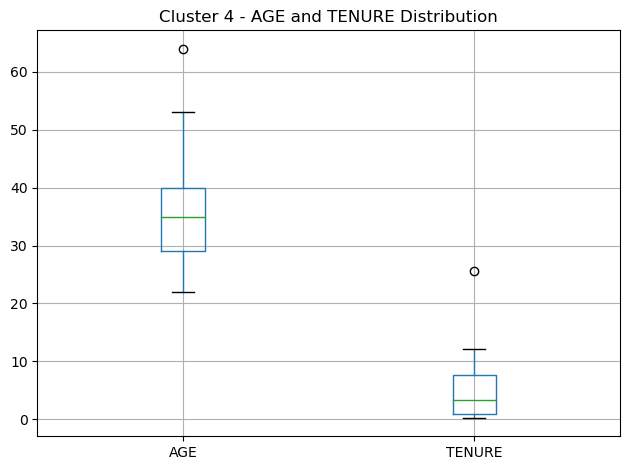

Cluster 5:
COUNT: 21


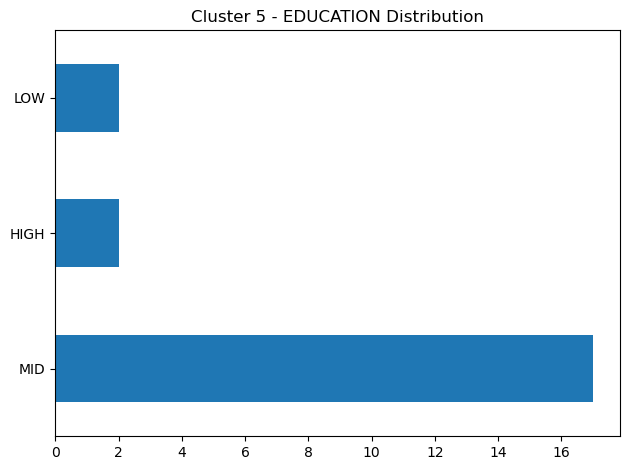

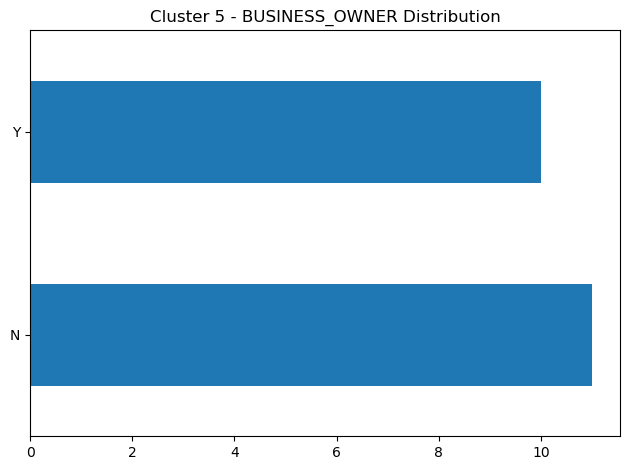

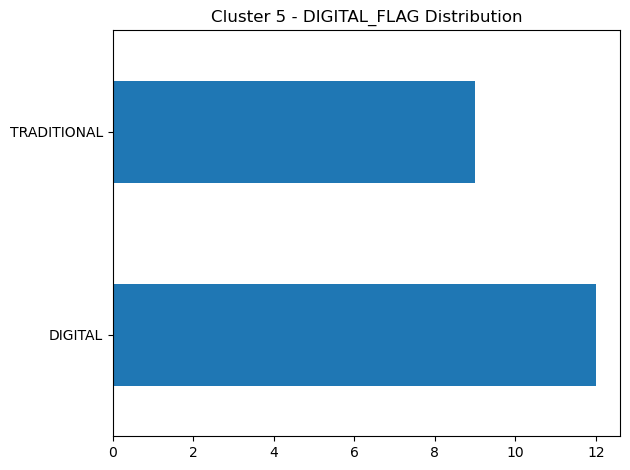

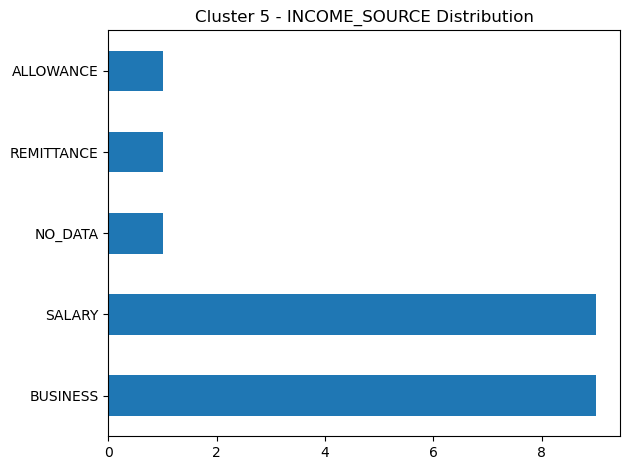

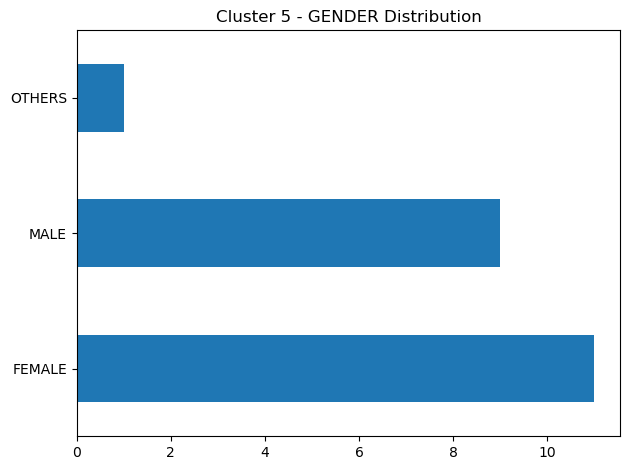

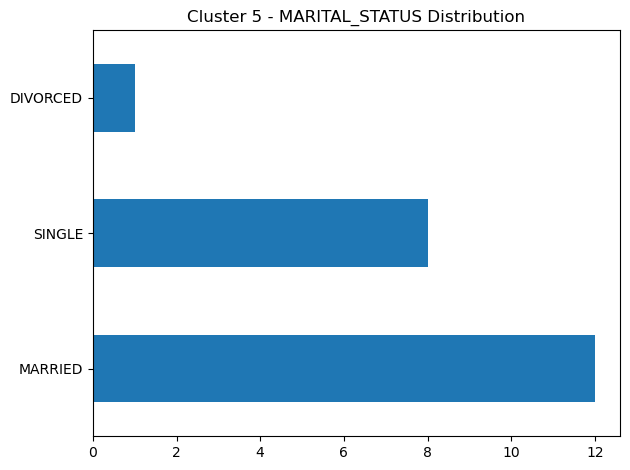

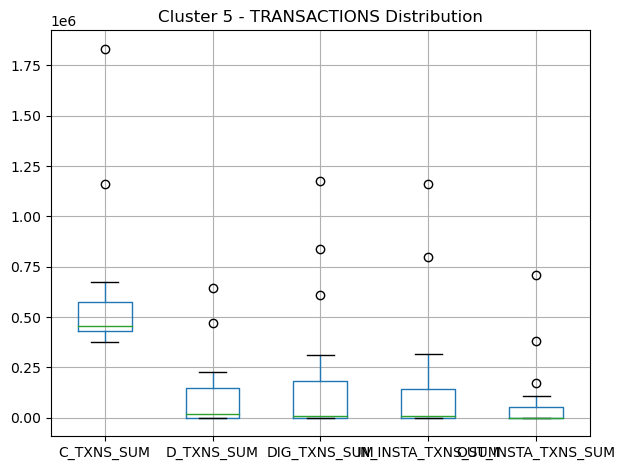

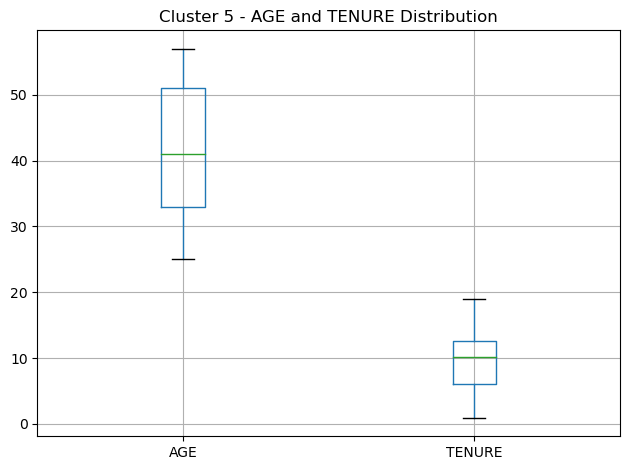

Cluster 6:
COUNT: 3


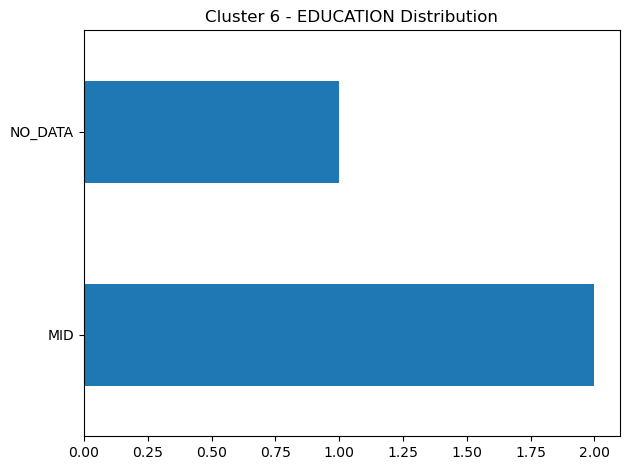

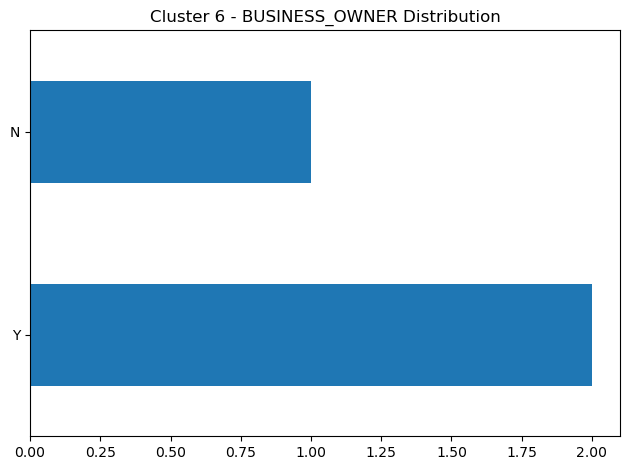

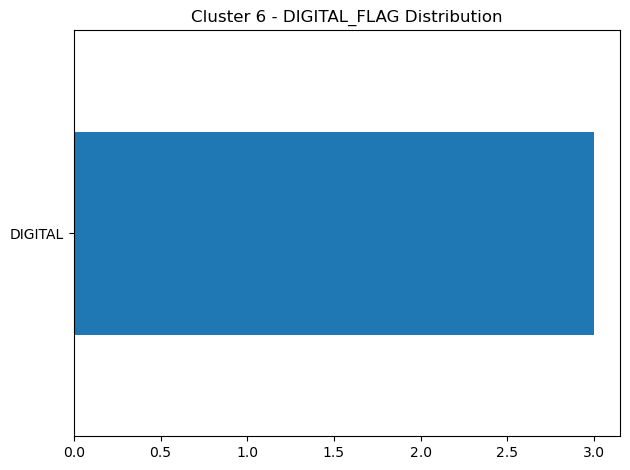

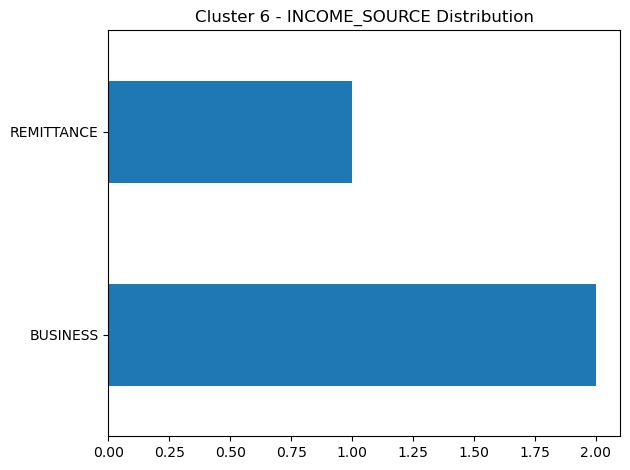

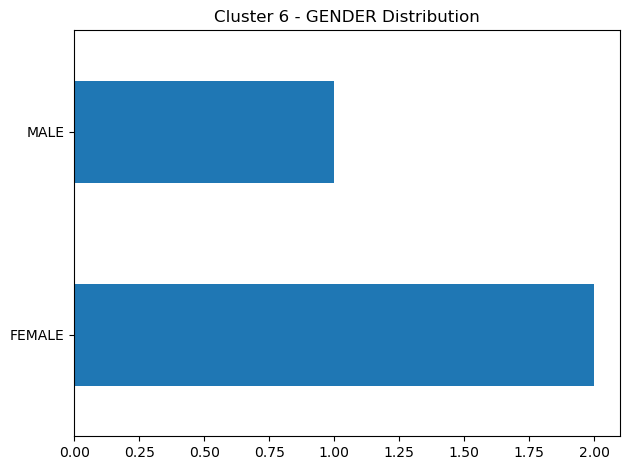

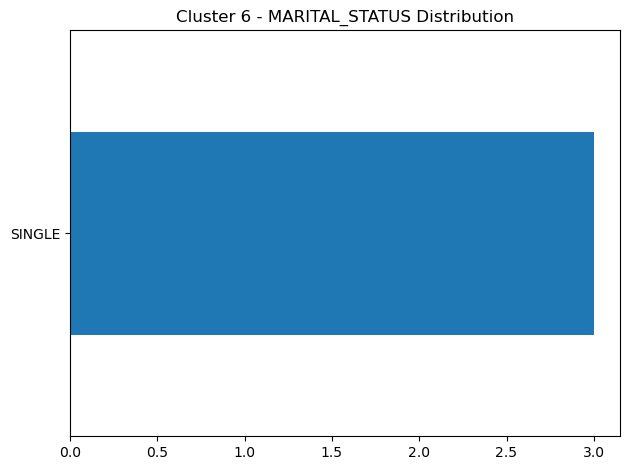

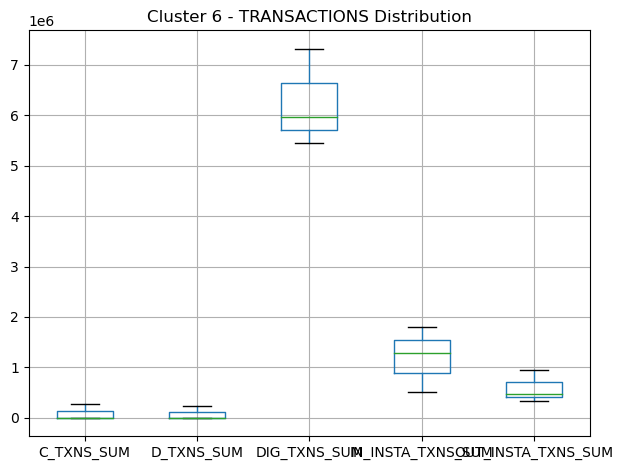

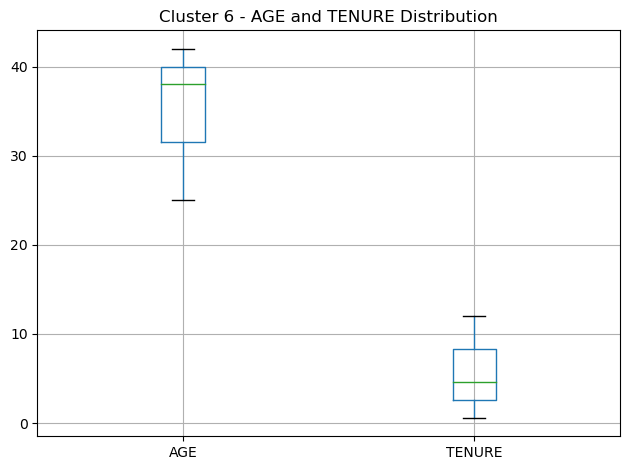

Cluster 7:
COUNT: 324


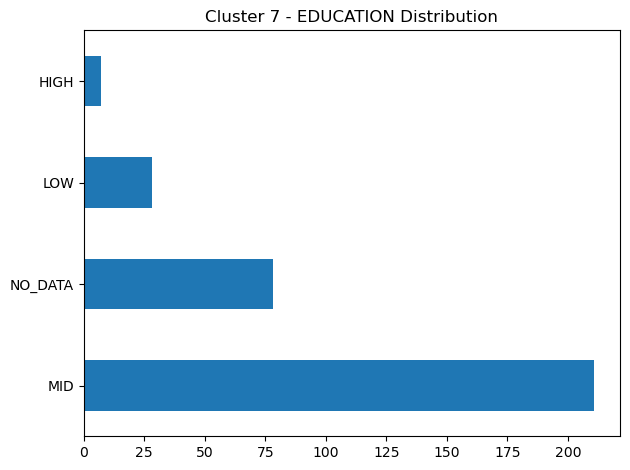

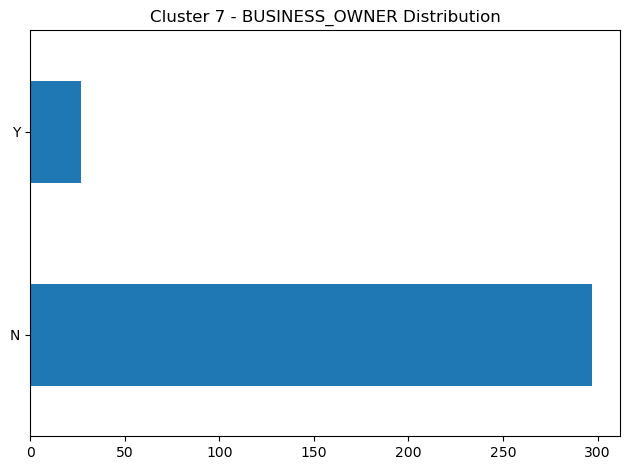

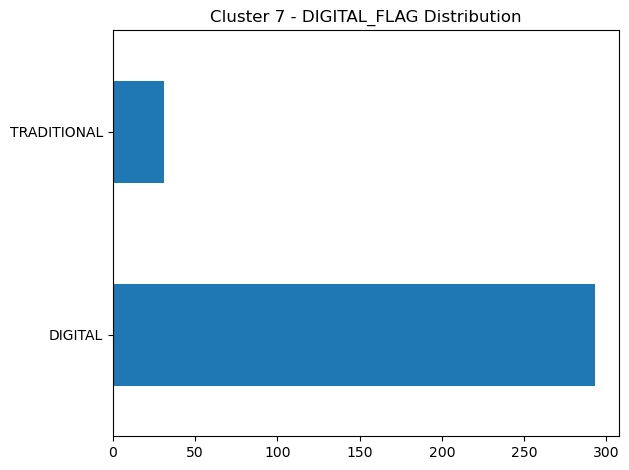

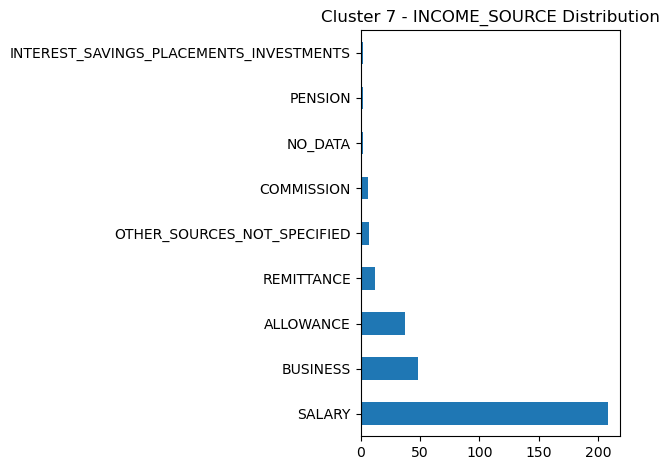

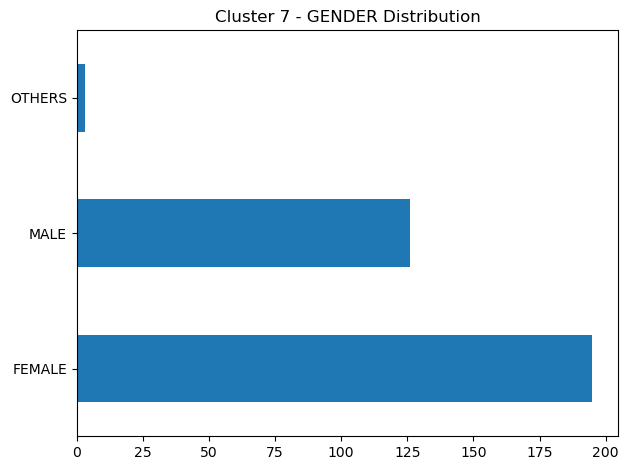

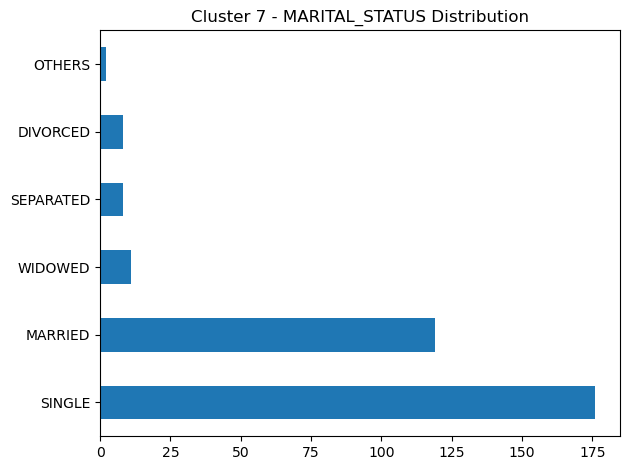

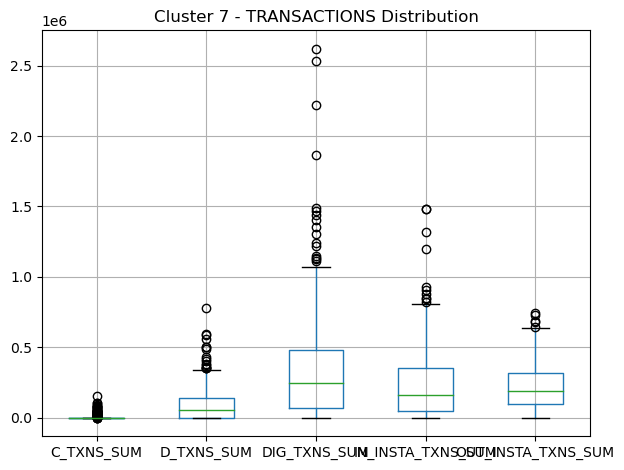

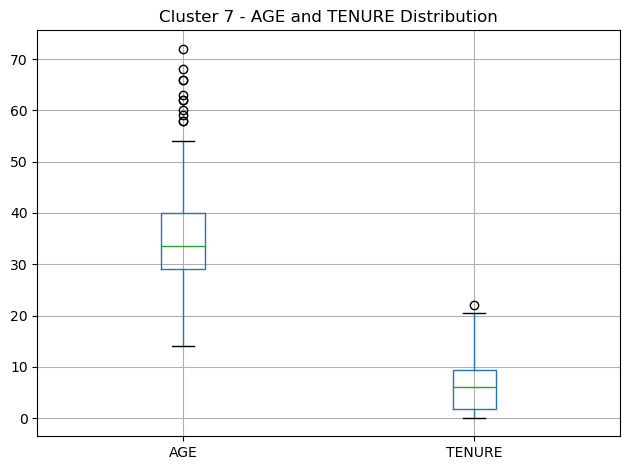

Cluster 8:
COUNT: 1


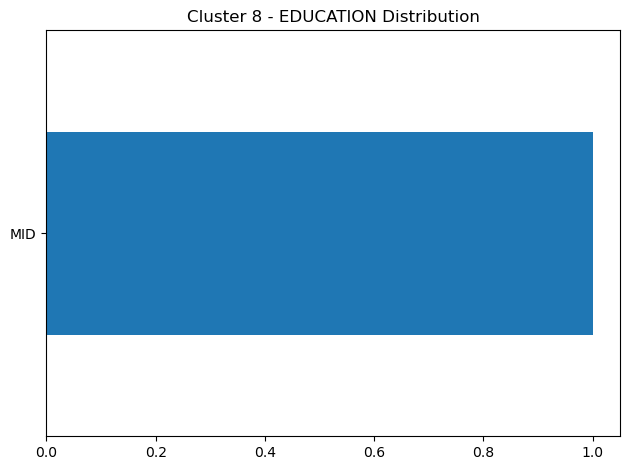

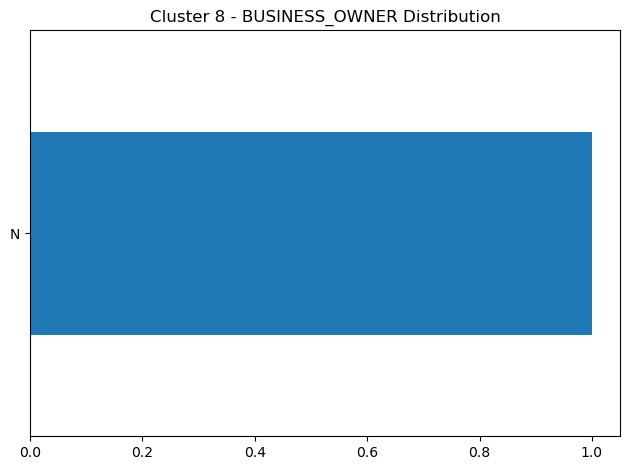

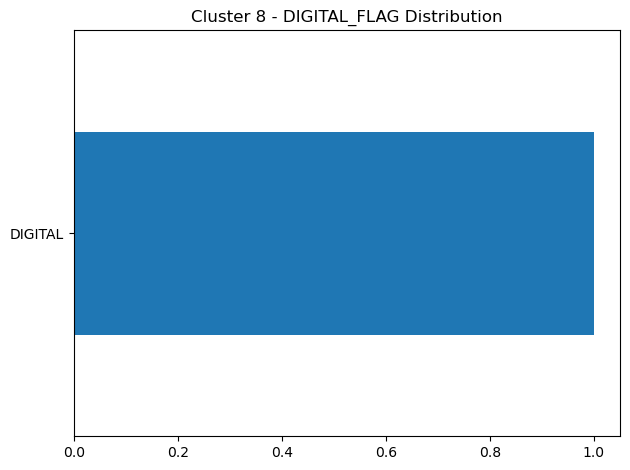

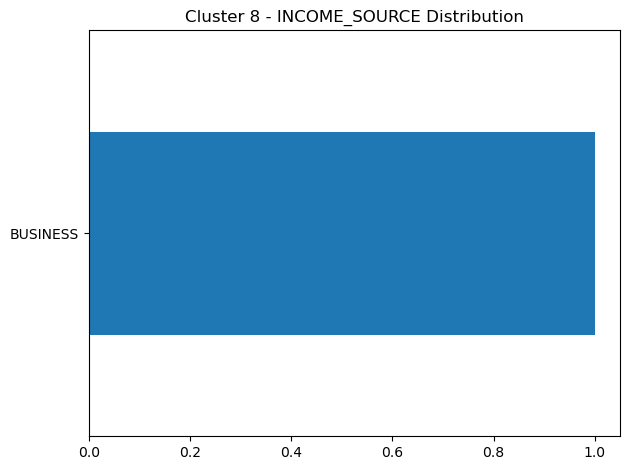

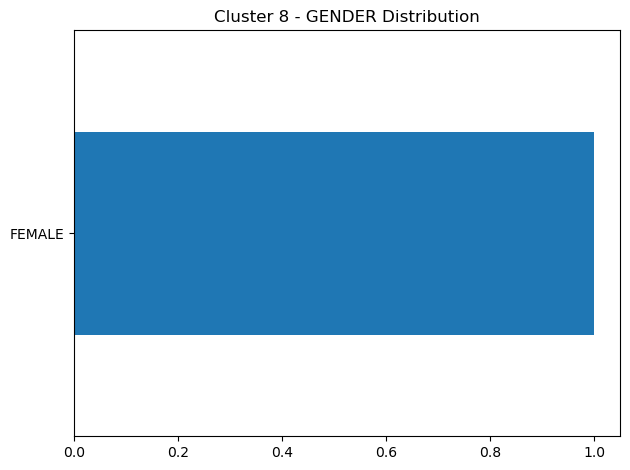

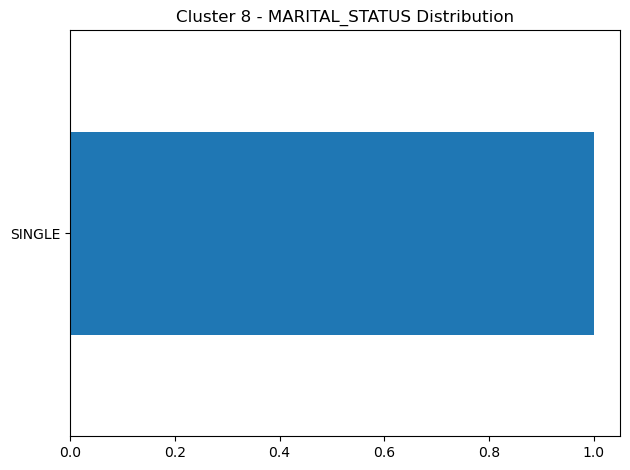

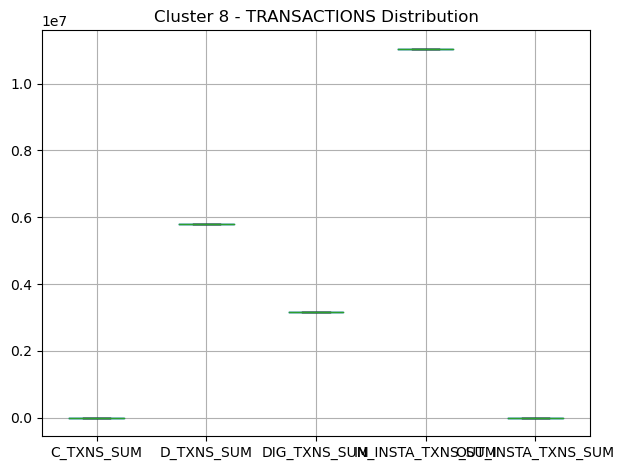

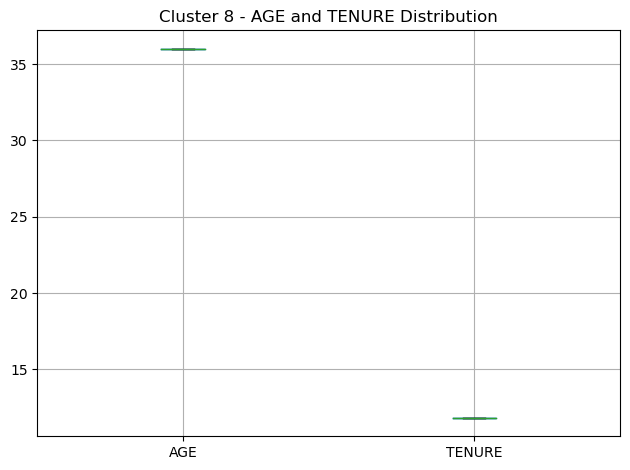

Cluster 9:
COUNT: 392


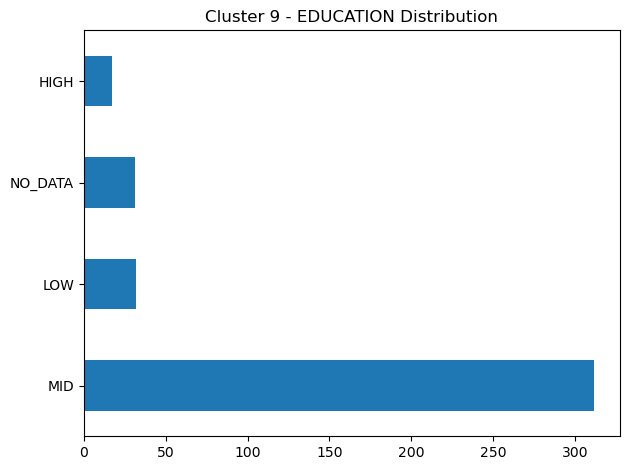

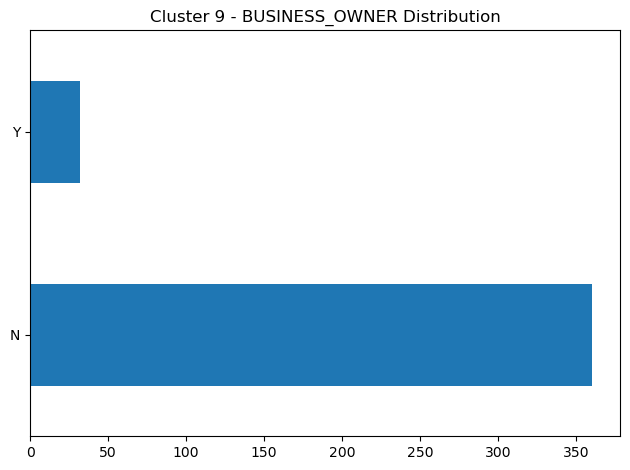

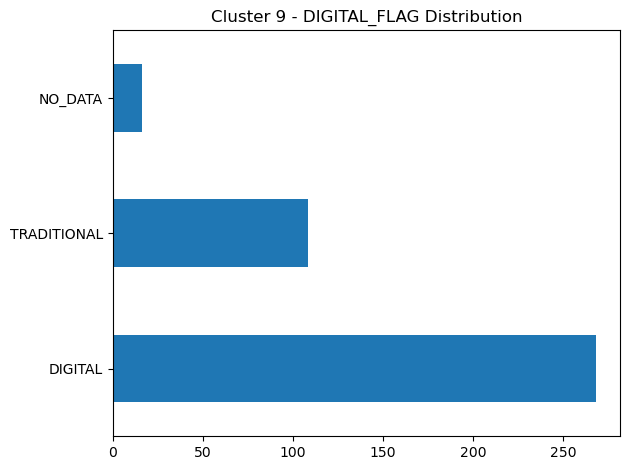

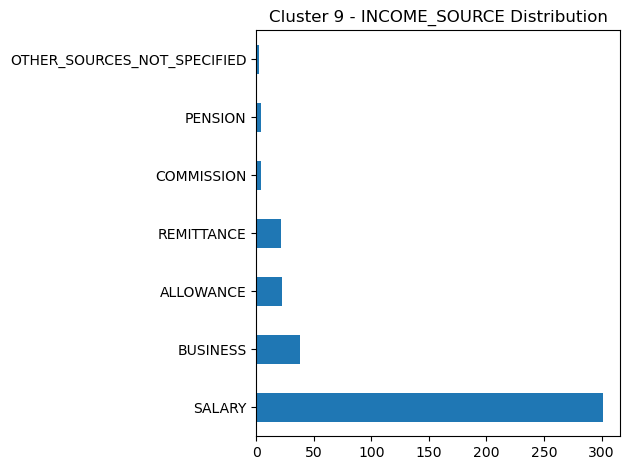

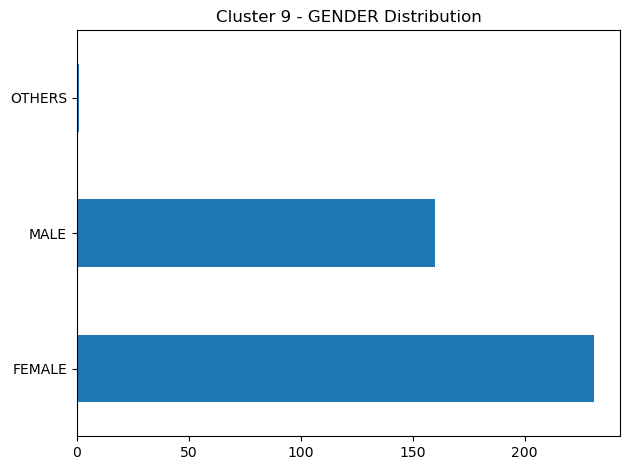

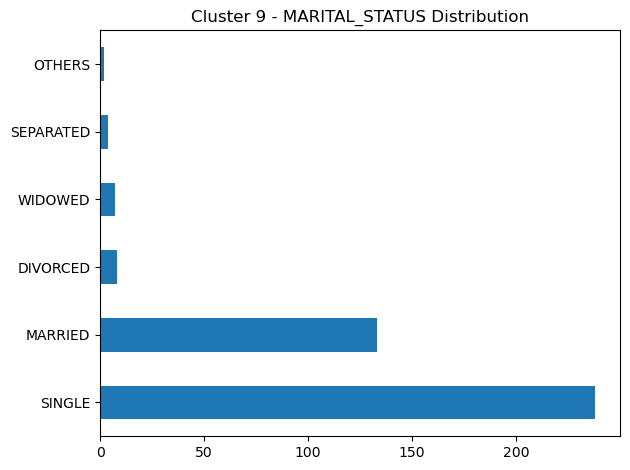

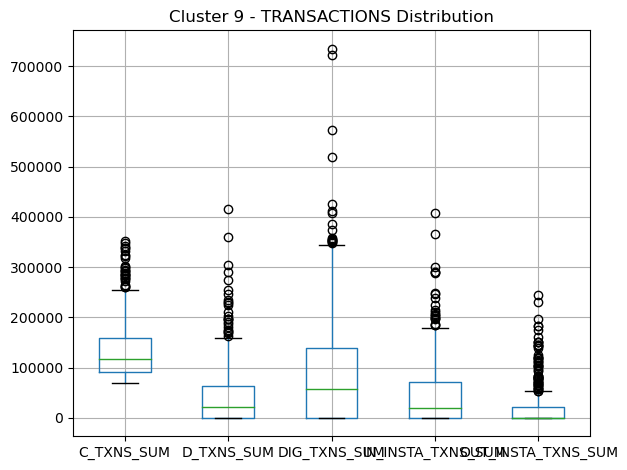

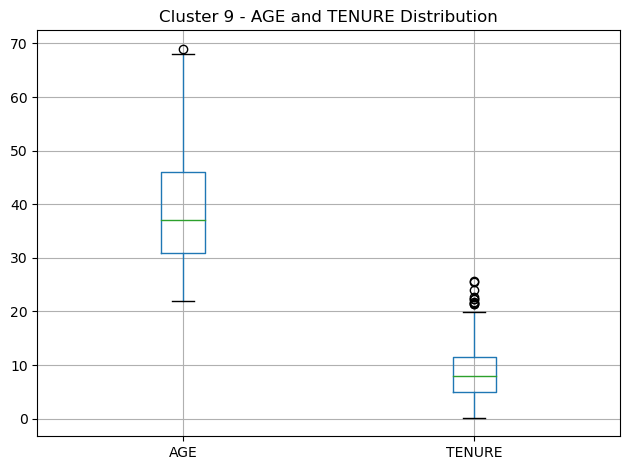

Cluster 10:
COUNT: 3114


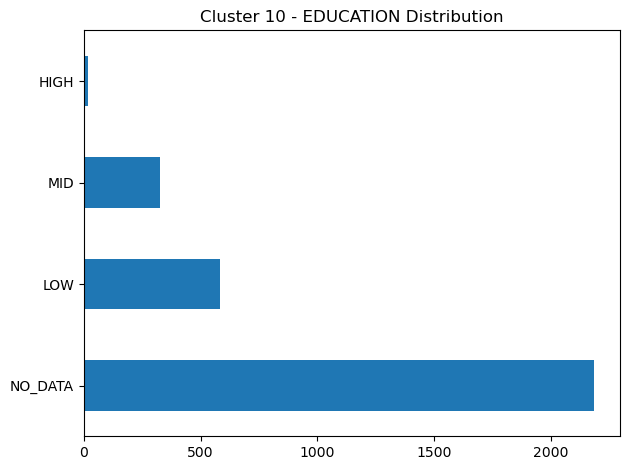

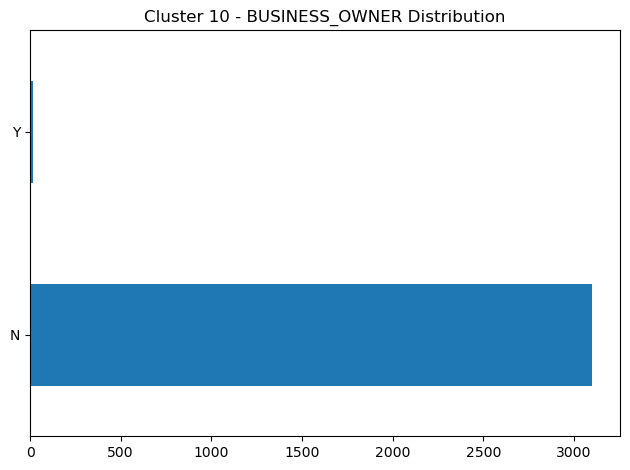

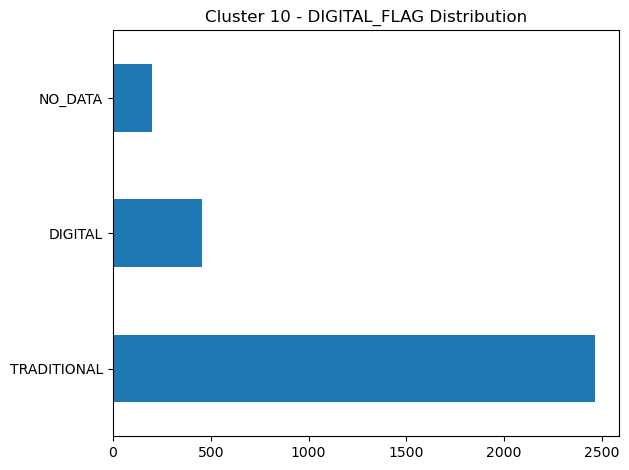

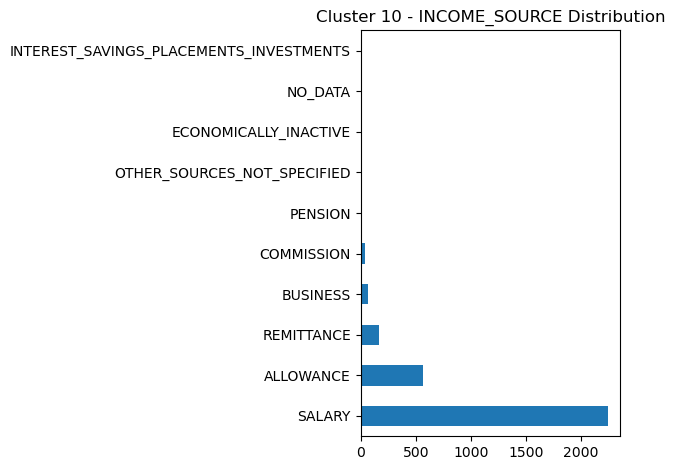

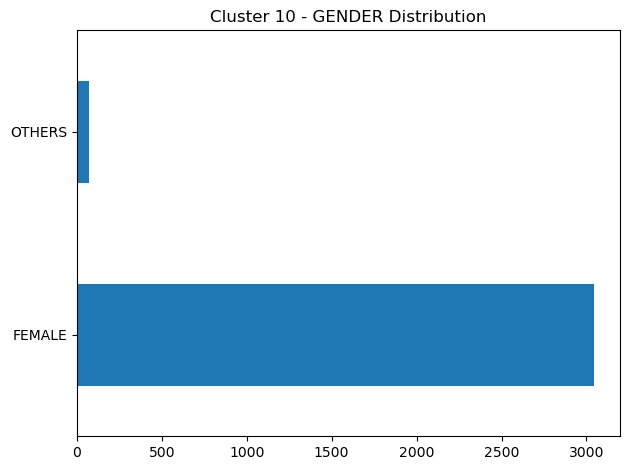

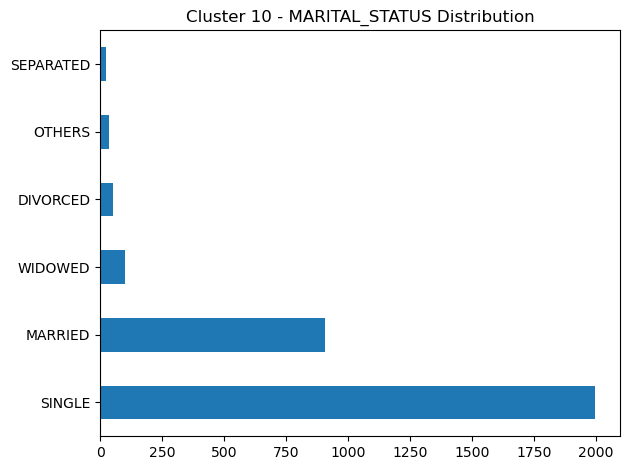

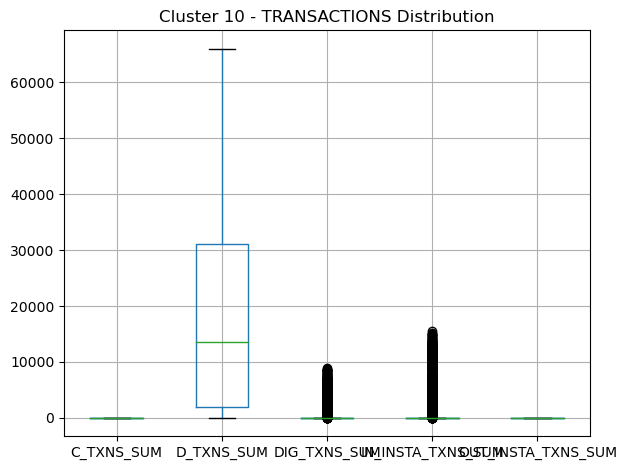

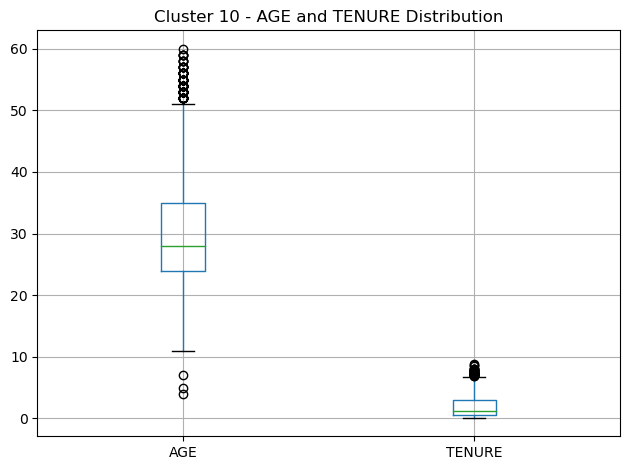

Cluster 11:
COUNT: 2089


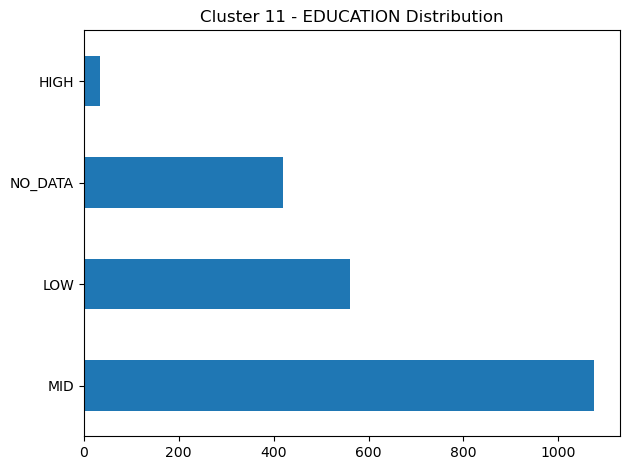

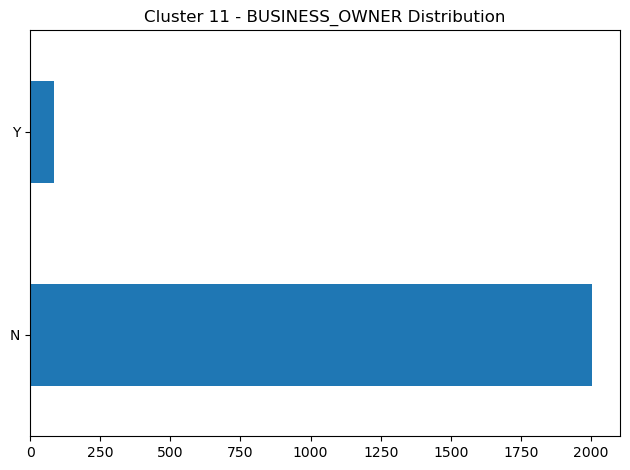

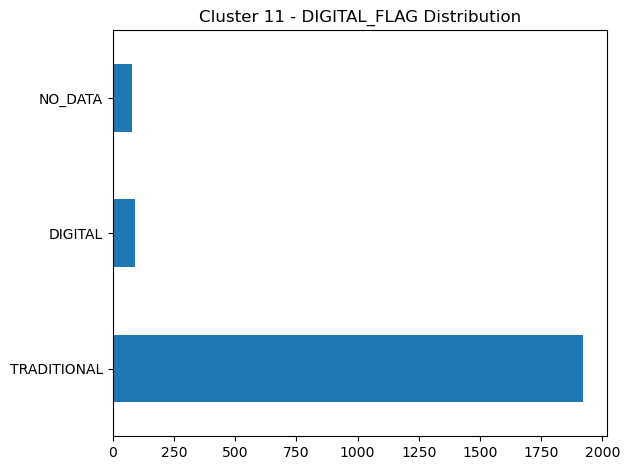

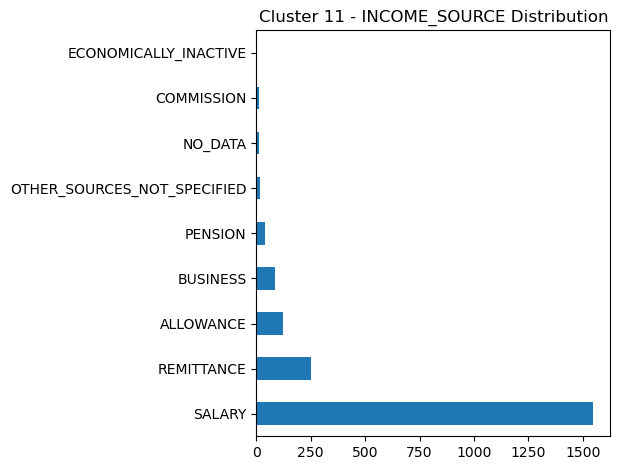

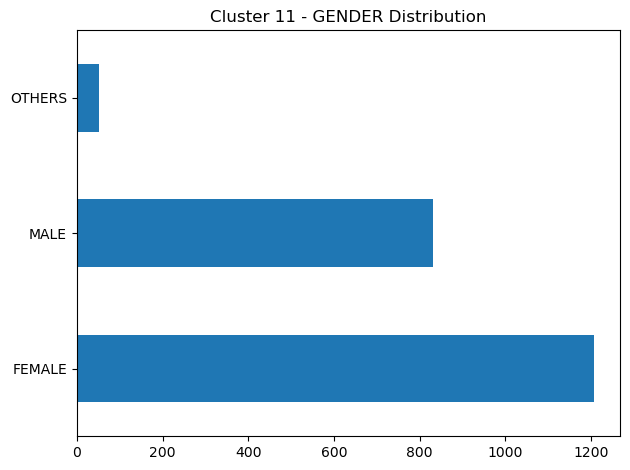

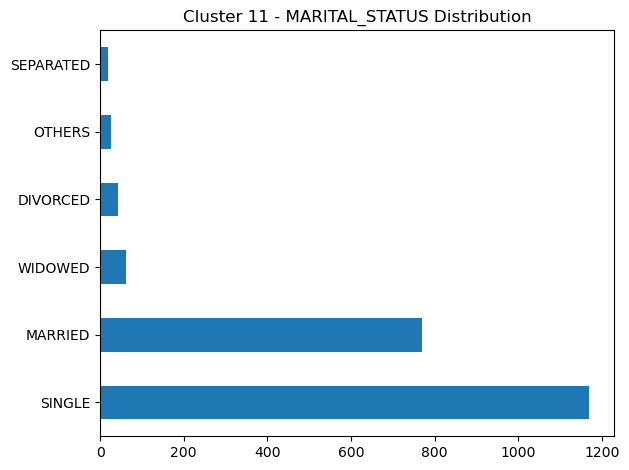

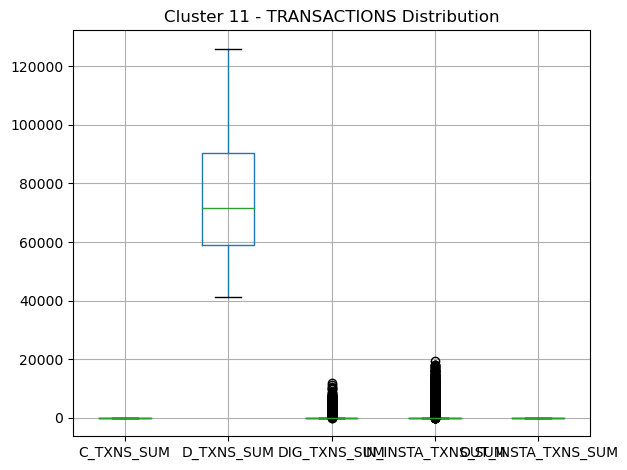

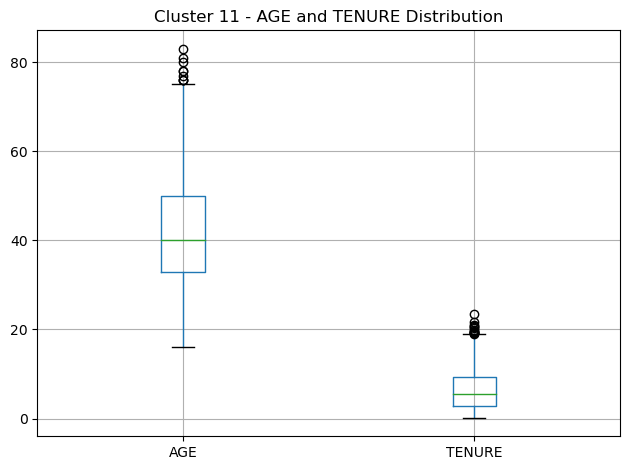

Cluster 12:
COUNT: 2575


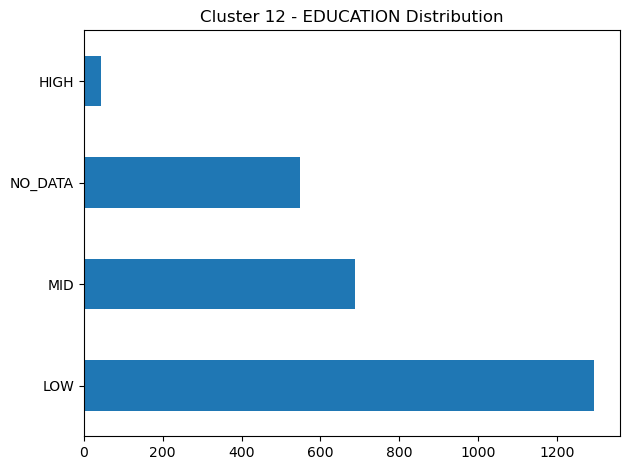

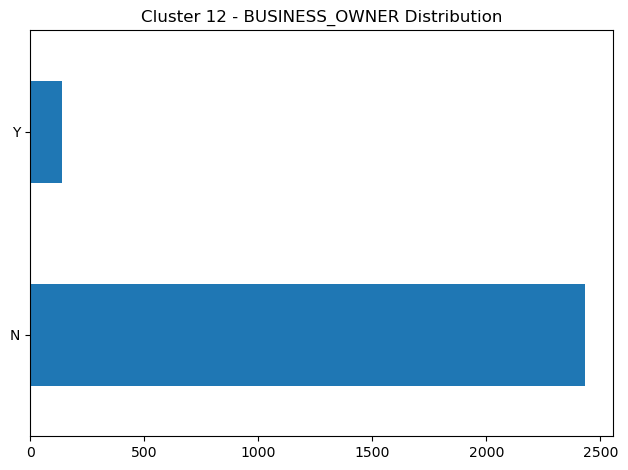

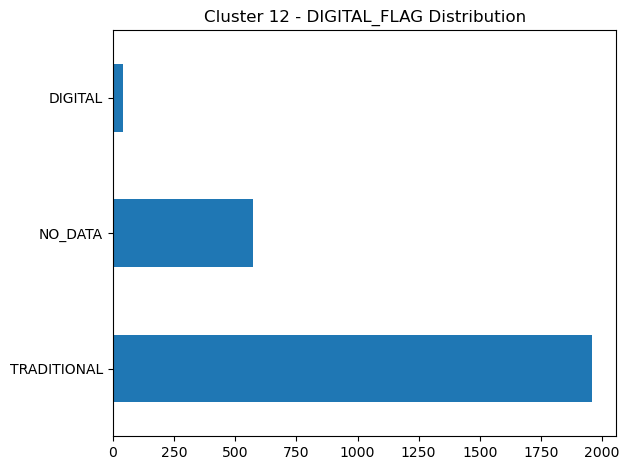

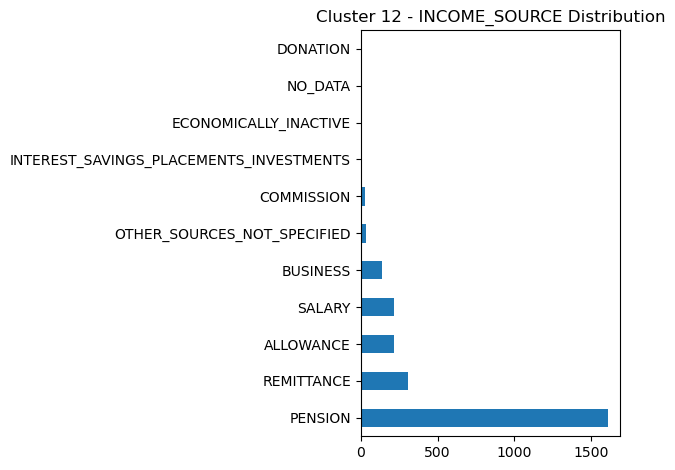

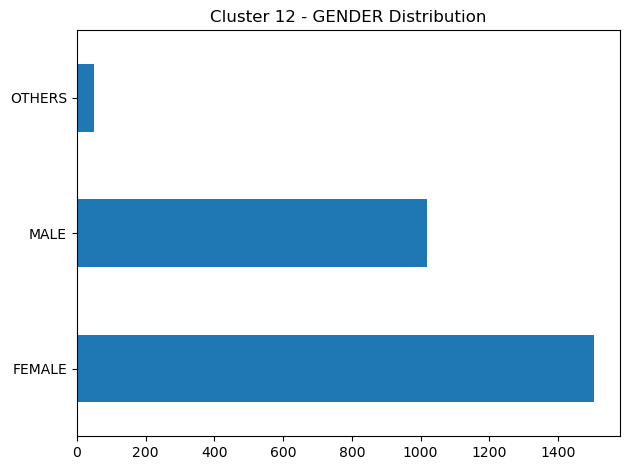

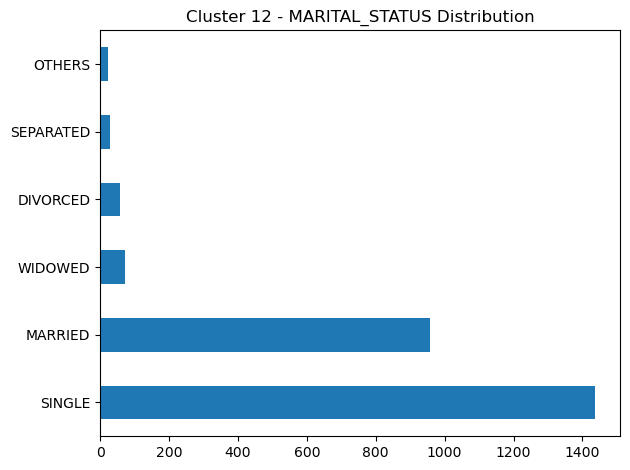

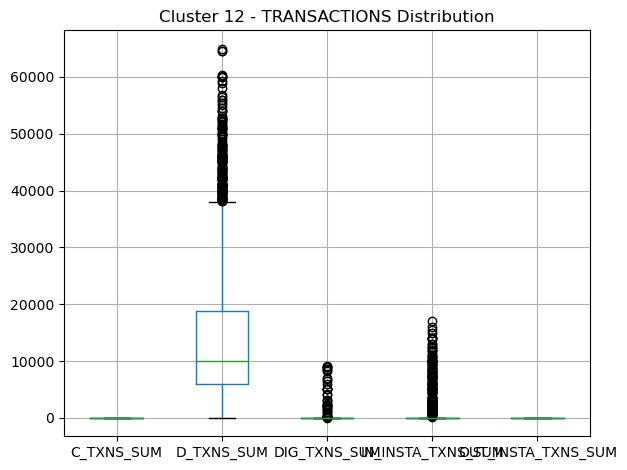

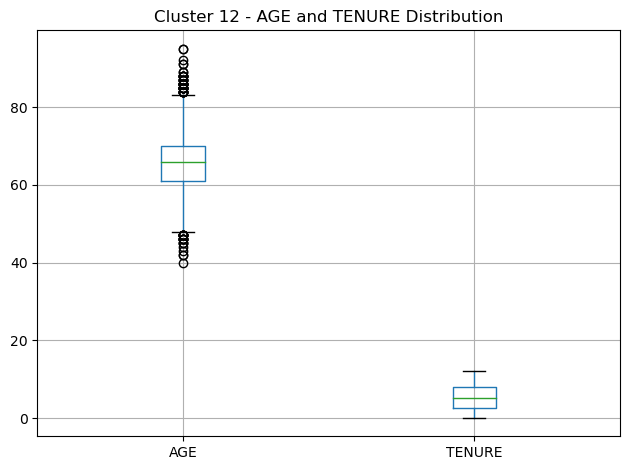

Cluster 13:
COUNT: 1010


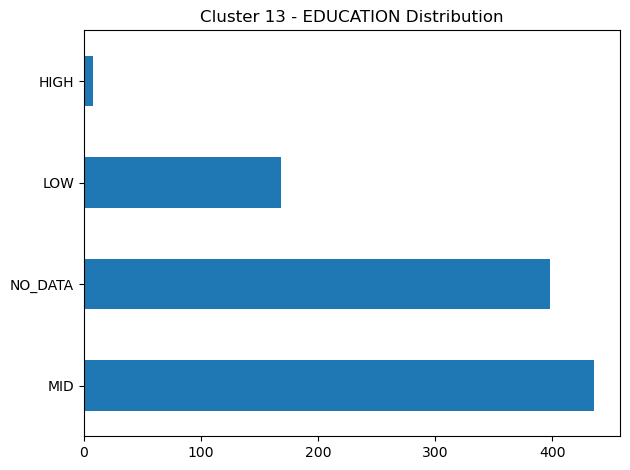

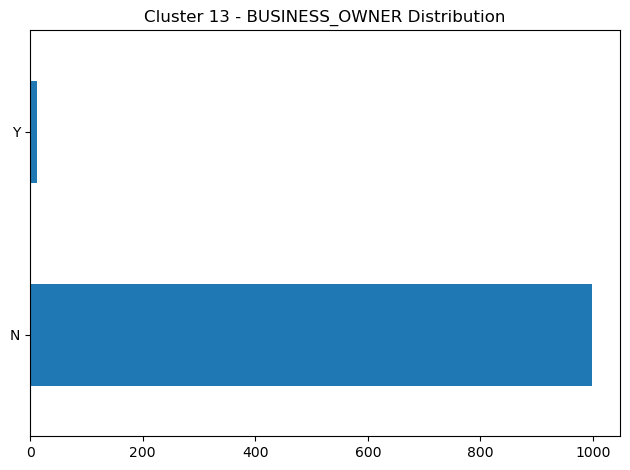

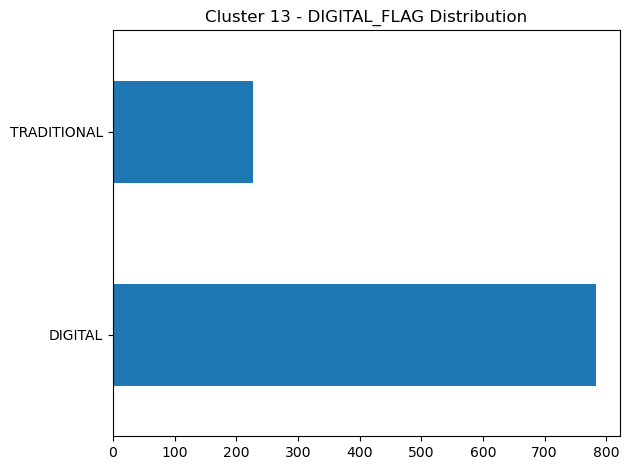

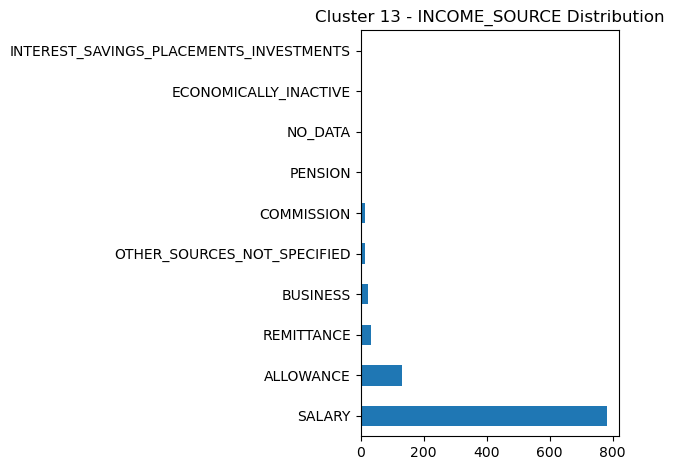

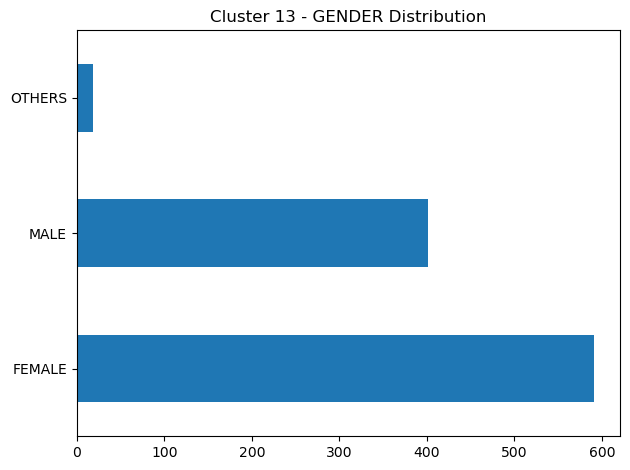

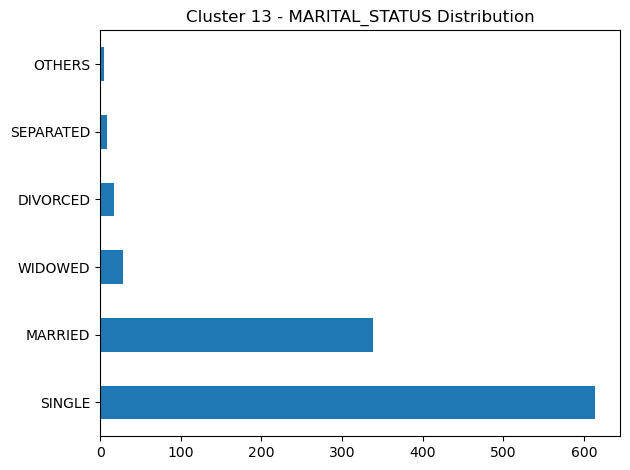

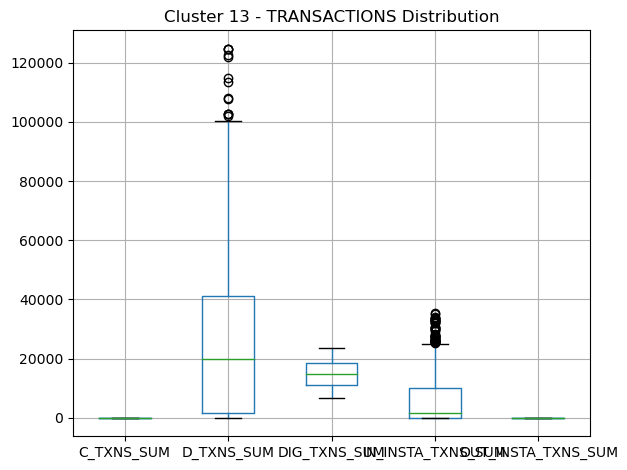

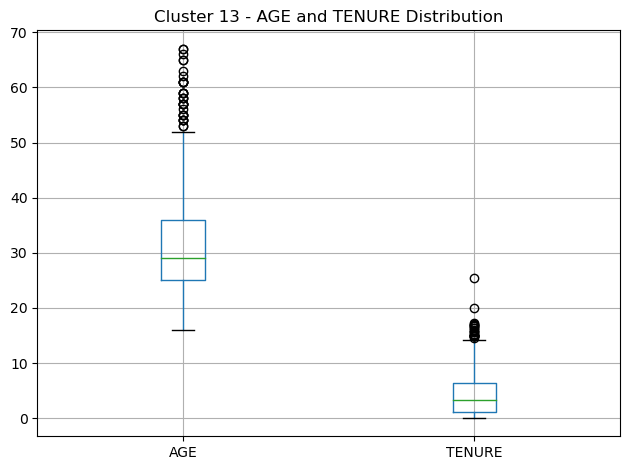

Cluster 14:
COUNT: 1176


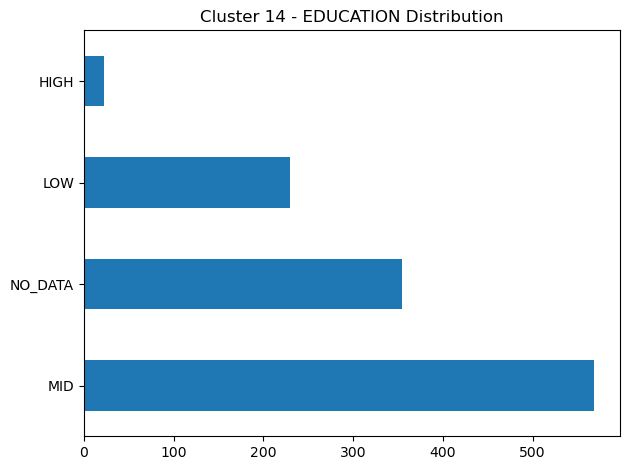

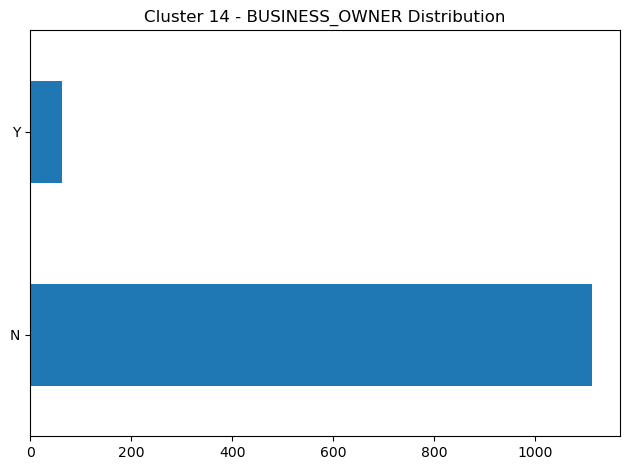

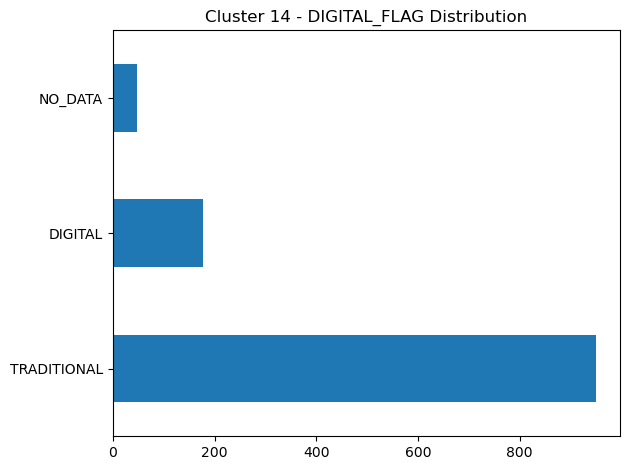

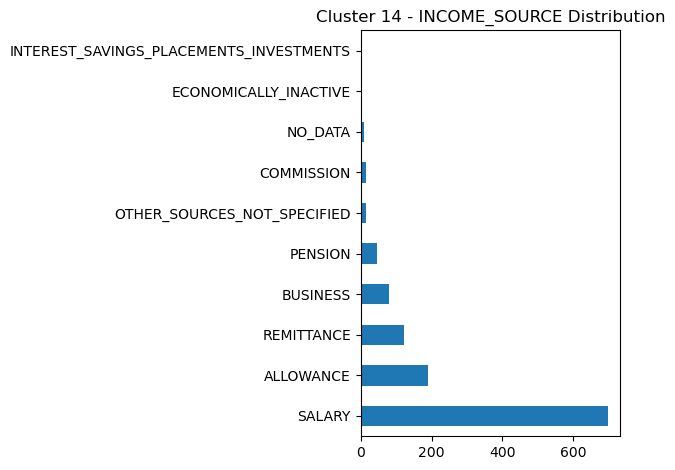

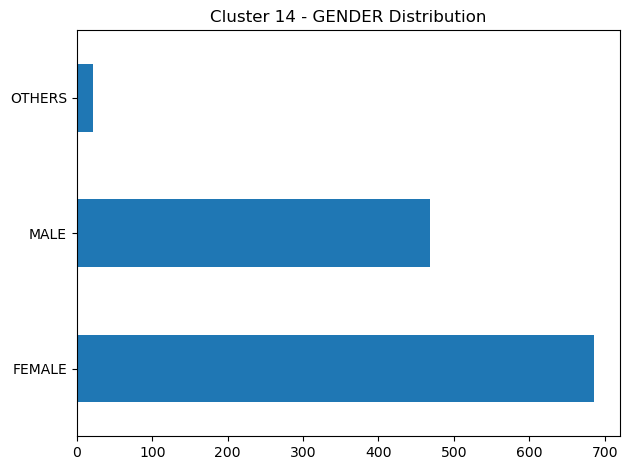

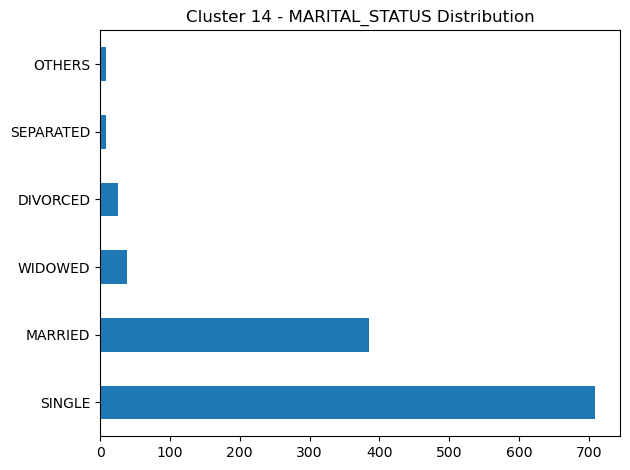

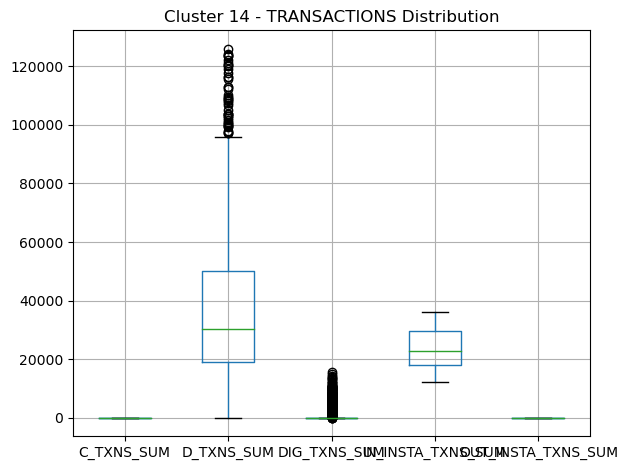

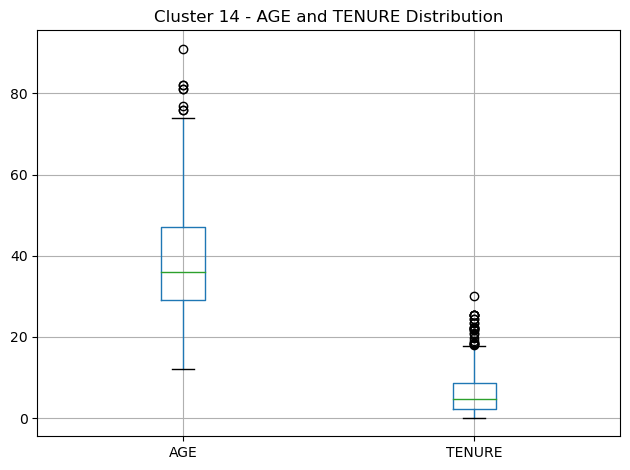

Cluster 15:
COUNT: 1566


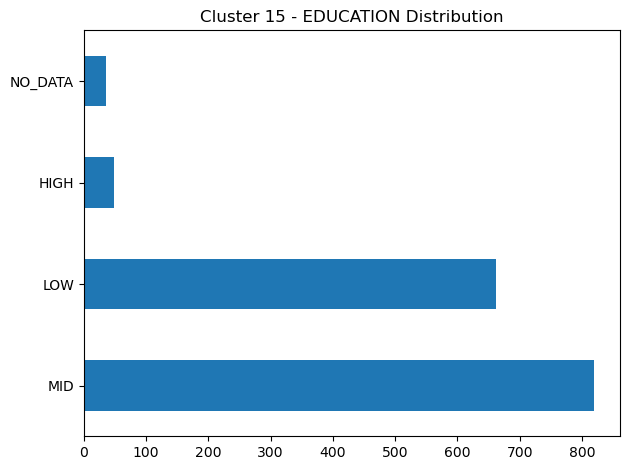

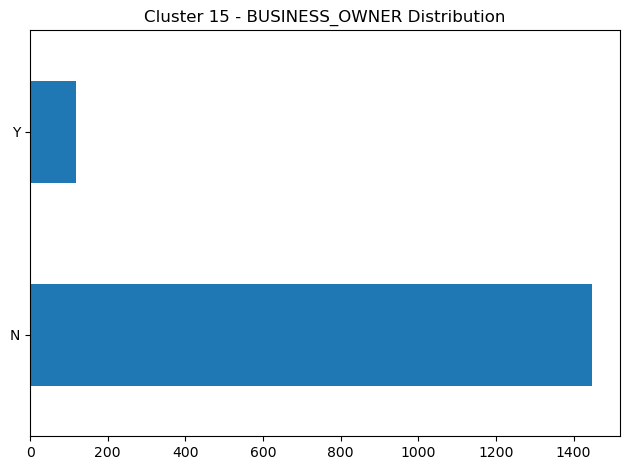

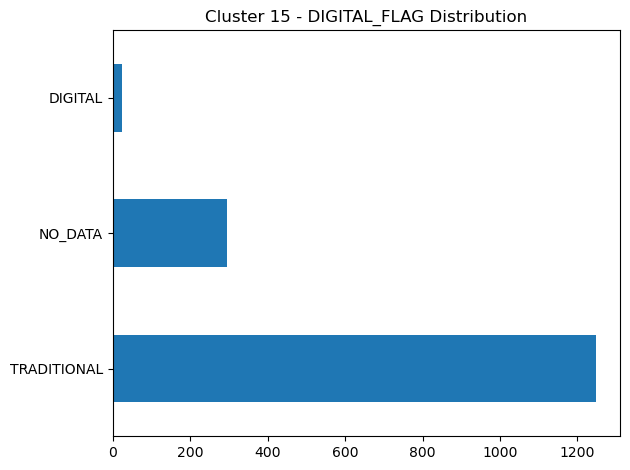

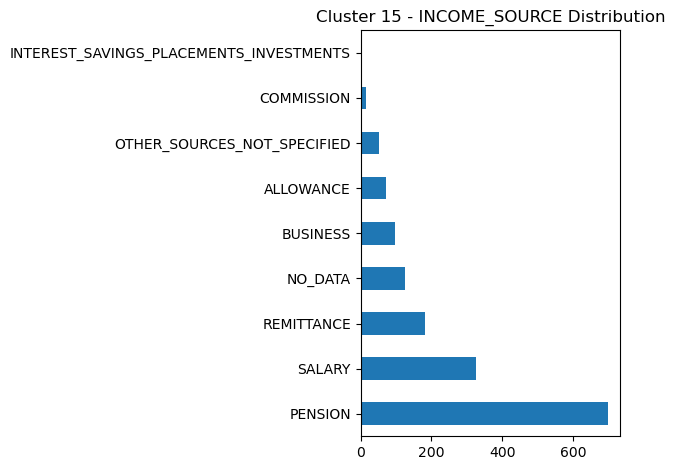

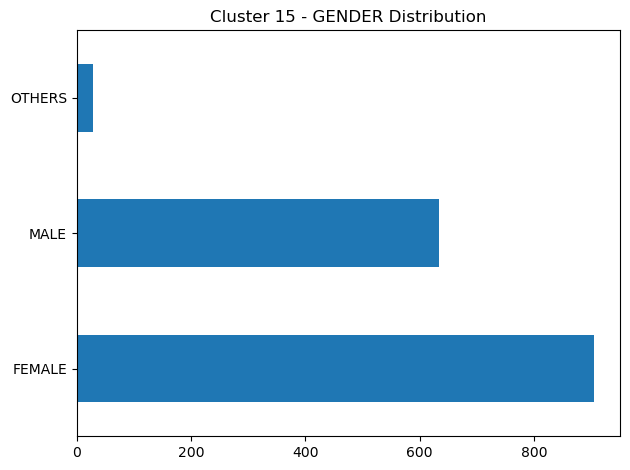

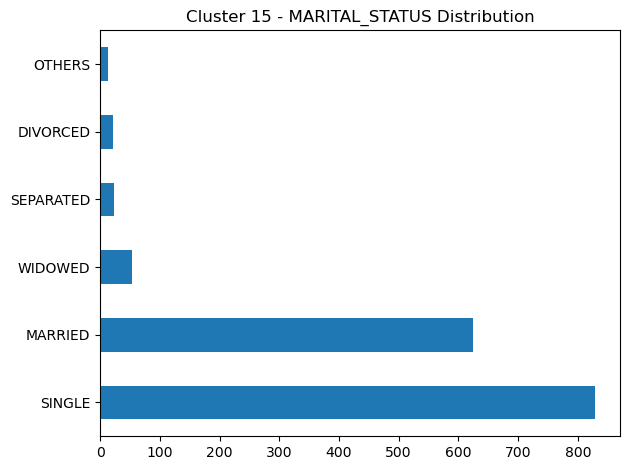

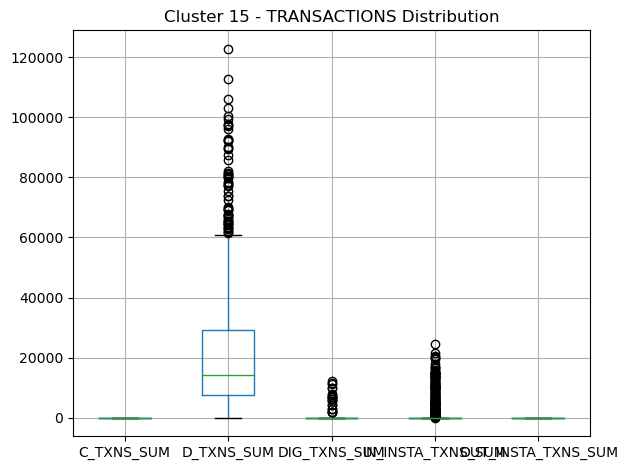

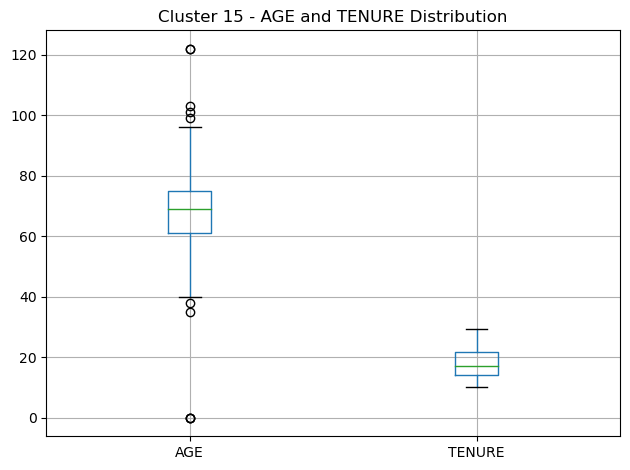

Cluster 16:
COUNT: 2592


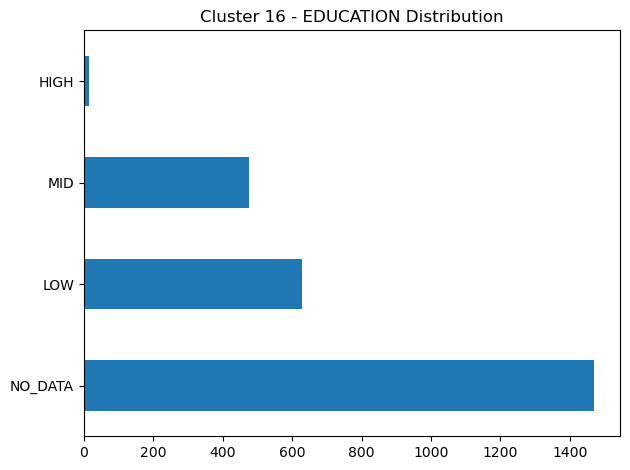

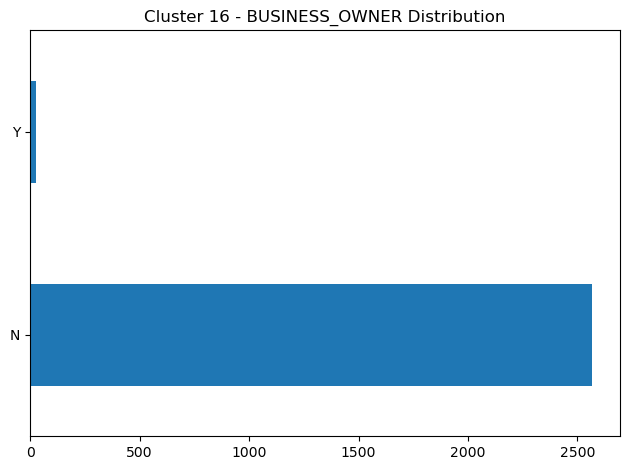

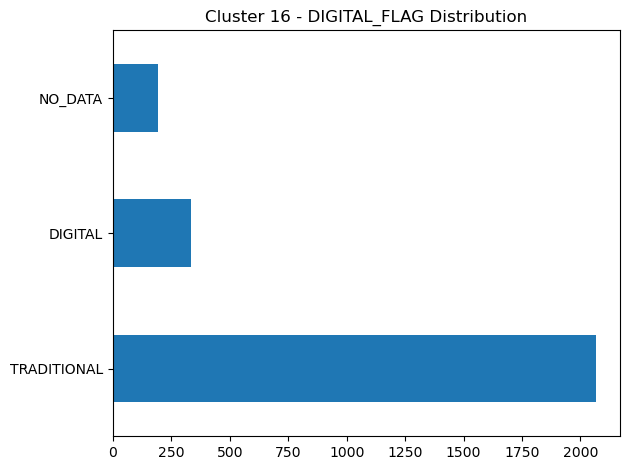

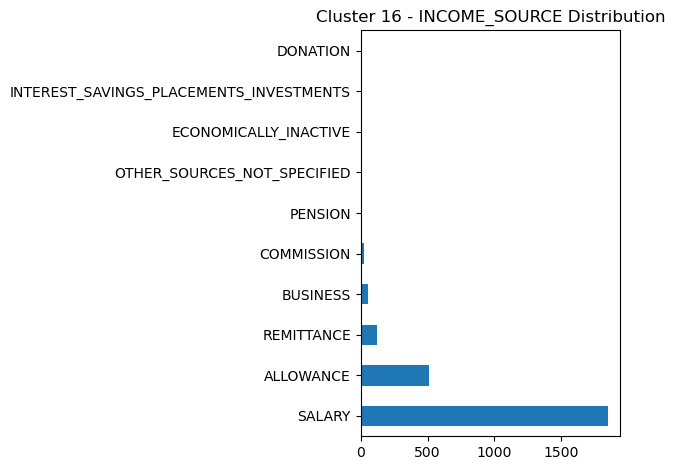

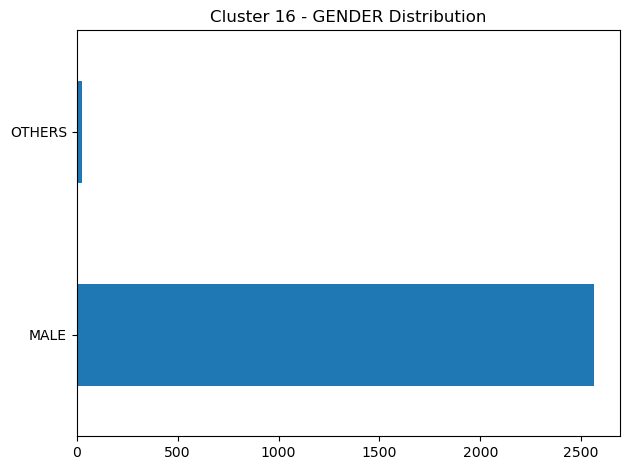

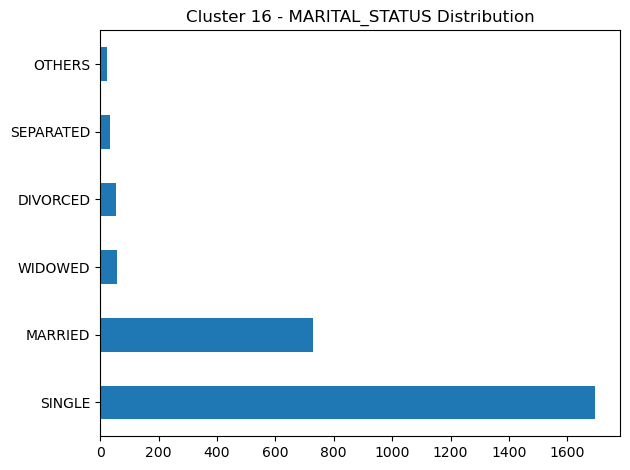

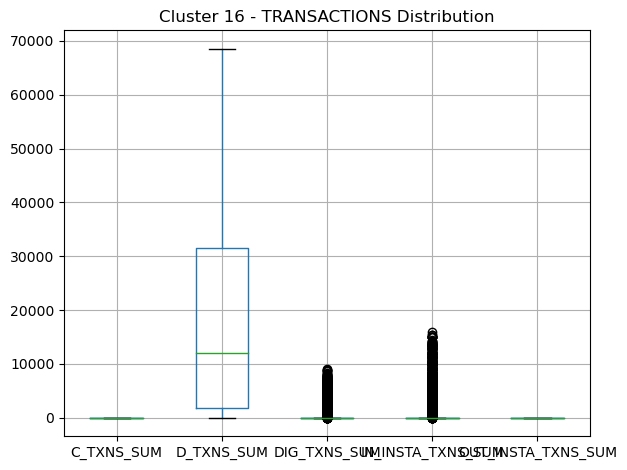

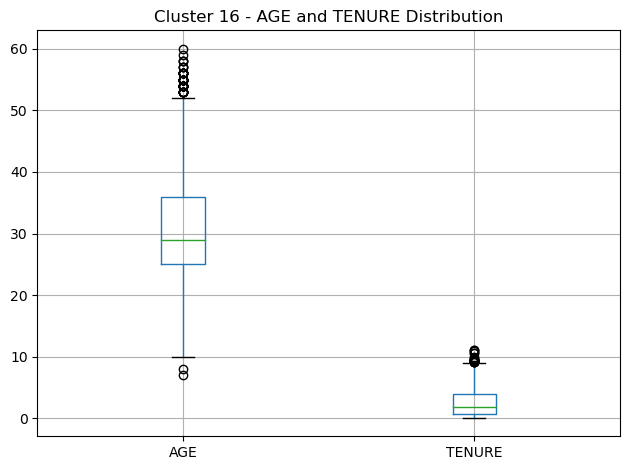

Cluster 17:
COUNT: 2675


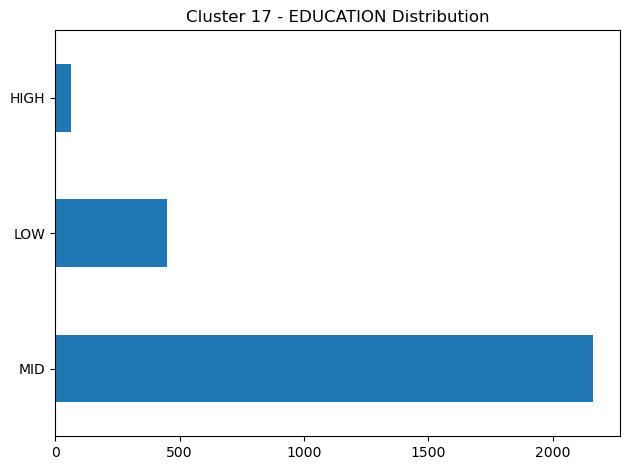

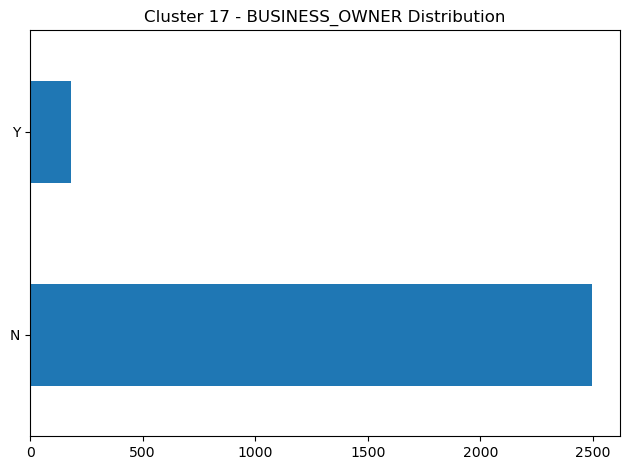

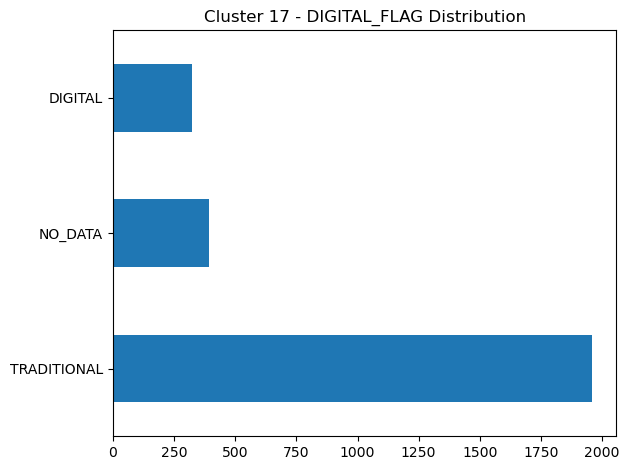

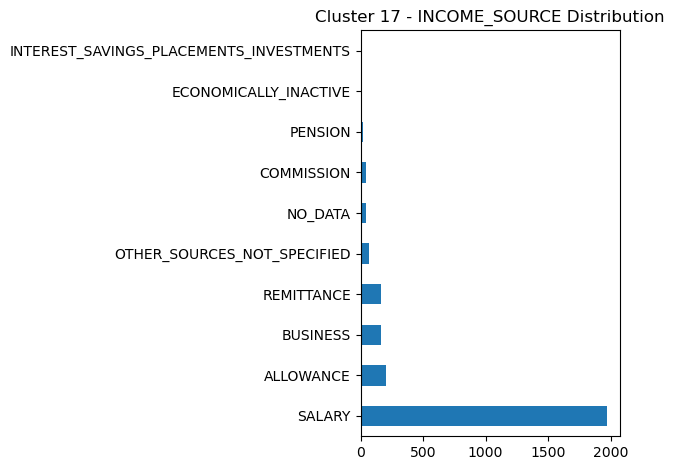

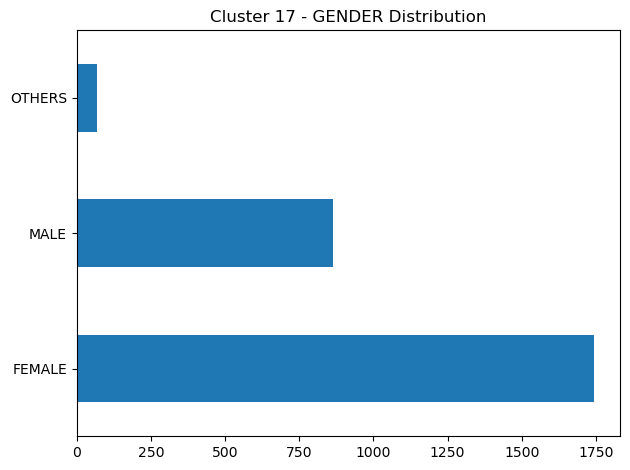

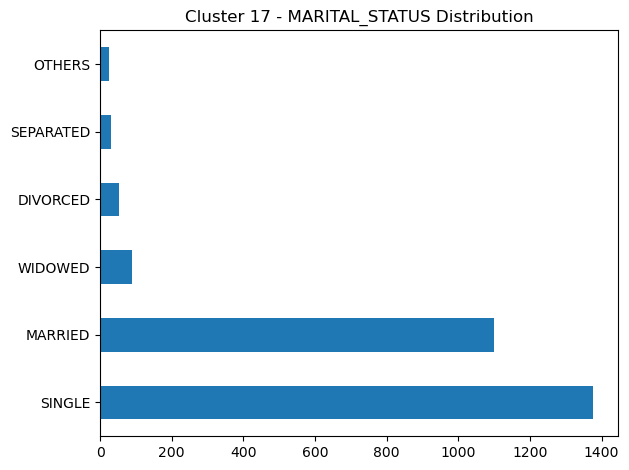

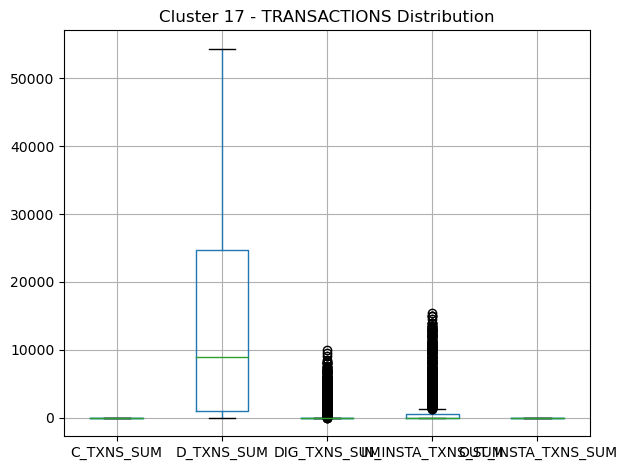

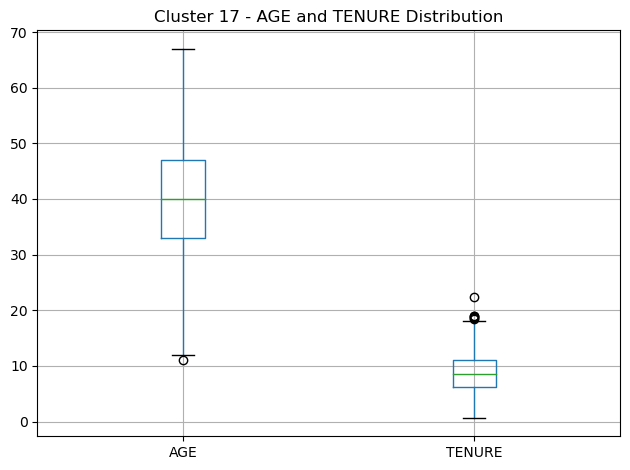

In [244]:
import matplotlib.pyplot as plt

for i in range(18):
    print("Cluster " + str(i) + ":")
    print("COUNT: " + str(clusters[i].count()[0]))
    
    for cat in category_columns:
        plt.figure()  # Create a new figure for each plot
        clusters[i][cat].value_counts().plot.barh()
        plt.title(f"Cluster {i} - {cat} Distribution")
        plt.tight_layout()
        plt.show()
        
    plt.figure()
    clusters[i][["C_TXNS_SUM","D_TXNS_SUM","DIG_TXNS_SUM","IN_INSTA_TXNS_SUM","OUT_INSTA_TXNS_SUM"]].boxplot()
    plt.title(f"Cluster {i} - TRANSACTIONS Distribution")
    plt.tight_layout()
    plt.show()

    plt.figure()
    clusters[i][["AGE", "TENURE"]].boxplot()
    plt.title(f"Cluster {i} - AGE and TENURE Distribution")
    plt.tight_layout()
    plt.show()

In [246]:
merged_sum2["Cluster"].value_counts()

1     5193
3     3824
10    3114
17    2675
16    2592
12    2575
11    2089
2     1778
15    1566
14    1176
13    1010
9      392
7      324
4       47
5       21
0       20
6        3
8        1
Name: Cluster, dtype: int64